In [1]:
# AeroCNN-II
import os
import sys
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer

import datetime
%matplotlib inline

In [2]:
n_kernel=100
l2Regularizer=1e-09
kernel_size1 = 3
kernel_size2 = 3
#kernel_size3 = 5
n_grid = 100
strides1 = 1
strides2 = 2
lr=5e-04
batch_size=20

In [3]:
alpha = np.linspace(-10,20,16).reshape((16,1))

In [4]:
aa = np.zeros((16*133,1))
for i in range(0, 133):
    aa[16*i:16*(i+1), :] = alpha[:,:]

In [5]:
aa = aa.reshape((133, 16, 1, 1))

In [6]:
os.chdir('D:\\AeroCNN2Inputs')

In [7]:
origin = "D:\\AeroCNN2Inputs2"
origin_data = "D:\\AirfoilClCdCoordinates_out\\AirfoilClCdCoordinates_out"
origin_poisson = "D:\\CNN_poisson_files\\poisson\\bc2"

In [8]:
folders_orig = os.listdir(origin)
folders = [file for file in folders_orig if file.endswith('.csv')]

In [9]:
image_df = pd.DataFrame()
for i in range(1, 134):
    for j in range(0, alpha.shape[0]):
        csv_file_name = origin + '\\airfoil' + str(i) + "_alpha"+ str(int(alpha[j])) + ".csv"
        data = pd.read_csv(csv_file_name, header=None)
        image_df = pd.concat([image_df, data])

In [10]:
image_np = image_df.iloc[:, :].values

In [11]:
image = image_np.reshape((133, 16, n_grid, n_grid))

In [12]:
image = 1-image/100

In [13]:
# Laplace/Poisson field
field_df = pd.DataFrame()
for i in range(1, 134):
    for j in range(0, alpha.shape[0]):
        csv_file_name = origin_poisson + '\\airfoil' + str(i) + "_alpha"+ str(int(alpha[j])) + ".csv"
        data = pd.read_csv(csv_file_name, header=None)
        field_df = pd.concat([field_df, data], axis=0)

In [14]:
field_np = field_df.iloc[:, :].values

In [15]:
imr = SimpleImputer(missing_values=np.nan, strategy='mean')
imr = imr.fit(field_np)
imputed_field = imr.transform(field_np)

In [16]:
field = imputed_field.reshape((133, 16, n_grid, n_grid))

In [17]:
field_nor = (field-np.min(field))/(np.max(field)-np.min(field))

In [18]:
file_name = origin_data + "\\AirfoilIndexList.xlsx"
airfoilName_df = pd.read_excel(file_name)
geometry_orig = airfoilName_df.iloc[:, 1].values

In [19]:
geometry = np.zeros((133*16,1))
geometry = geometry.astype(np.string_)
for i in geometry_orig:
    index_ = np.where(geometry_orig==i)
    for j in range(0,16):
        geometry[16*index_[0]+j,:] = np.asarray(i)

In [20]:
geometry = geometry.reshape((133, 16, 1))

In [21]:
x_train, x_test, aa_train, aa_test, geo_train, geo_test, y_train, y_test = train_test_split(image, aa, geometry, field_nor, test_size=0.05, random_state=1)

In [26]:
x_train = x_train.reshape((x_train.shape[0]*x_train.shape[1], x_train.shape[2], x_train.shape[3], 1))
x_test = x_test.reshape((x_test.shape[0]*x_test.shape[1], x_test.shape[2], x_test.shape[3], 1))
aa_train = aa_train.reshape((aa_train.shape[0]*aa_train.shape[1], aa_train.shape[2], aa_train.shape[3]))
aa_test = aa_test.reshape((aa_test.shape[0]*aa_test.shape[1], aa_test.shape[2], aa_test.shape[3]))
geo_train = geo_train.reshape((geo_train.shape[0]*geo_train.shape[1], geo_train.shape[2]))
geo_test = geo_test.reshape((geo_test.shape[0]*geo_test.shape[1], geo_test.shape[2]))
y_train = y_train.reshape((y_train.shape[0]*y_train.shape[1], y_train.shape[2], y_train.shape[3], 1))
y_test = y_test.reshape((y_test.shape[0]*y_test.shape[1], y_test.shape[2], y_test.shape[3], 1))

In [27]:
tf.keras.backend.set_image_data_format('channels_last')

In [28]:
input_image = tf.keras.Input(shape=(n_grid, n_grid, 1))

x_conv1 = tf.keras.layers.Conv2D(n_kernel, (kernel_size1, kernel_size1), strides=(strides1, strides1),
                                 activation='relu', padding='same',
                                 kernel_regularizer=tf.keras.regularizers.l2(l2Regularizer),
                                 name='Conv2DLayer1')(input_image)
x_1 = tf.keras.layers.MaxPooling2D((2,2))(x_conv1)
x_conv2 = tf.keras.layers.Conv2D(n_kernel*2, (kernel_size2, kernel_size2), strides=(strides1, strides1),
                                 activation='relu', padding='same',
                                 kernel_regularizer=tf.keras.regularizers.l2(l2Regularizer),
                                 name='Conv2DLayer2')(x_1)
x_2 = tf.keras.layers.MaxPooling2D((2,2))(x_conv2)

x_deconv1 = tf.keras.layers.Conv2DTranspose(n_kernel*2, (kernel_size2, kernel_size2),
                                            strides=(strides2,strides2),
                                            activation='relu', padding='same',
                                            kernel_regularizer=tf.keras.regularizers.l2(l2Regularizer),
                                            name='Conv2DTLayer1')(x_2)
x_deconv2 = tf.keras.layers.Conv2DTranspose(n_kernel, (kernel_size1, kernel_size1),
                                            strides=(strides2,strides2),
                                            activation='relu', padding='same',
                                            kernel_regularizer=tf.keras.regularizers.l2(l2Regularizer),
                                            name='Conv2DTLayer2')(x_deconv1)

x_conv_final = tf.keras.layers.Conv2D(1, (kernel_size1, kernel_size1), strides=(strides1, strides1),
                                      activation='relu', padding='valid',
                                      kernel_regularizer=tf.keras.regularizers.l2(l2Regularizer),
                                      name='Conv2DLayerFinal')(x_deconv2)
x_flat = tf.keras.layers.Flatten()(x_conv_final)
x_ = tf.keras.layers.Dense(units=int((n_grid)**2), activation='linear', name='FCLayer',
                           kernel_regularizer=tf.keras.regularizers.l2(l2Regularizer))(x_flat)

output_data = tf.keras.layers.Reshape((n_grid,n_grid,1))(x_)

# AeroCNN-II/Poisson/BC 2
model = tf.keras.Model(input_image, output_data)

In [29]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 100, 100, 1)]     0         
                                                                 
 Conv2DLayer1 (Conv2D)       (None, 100, 100, 100)     1000      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 50, 50, 100)      0         
 )                                                               
                                                                 
 Conv2DLayer2 (Conv2D)       (None, 50, 50, 200)       180200    
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 25, 25, 200)      0         
 2D)                                                             
                                                                 
 Conv2DTLayer1 (Conv2DTransp  (None, 50, 50, 200)      360200

In [30]:
#with mirrored_strategy.scope():
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr),
              loss = tf.keras.losses.MeanSquaredError(),
              metrics=[tf.keras.metrics.RootMeanSquaredError(name="rmse")])

In [31]:
#with mirrored_strategy.scope():
# 끝까지 학습시키고 싶을 땐 ReduceLRONPlateau에서 min_delta를 1e-11로, patience=100,
# EarlyStopping에서 patience를 200으로 설정. 평상시에는(50. 100, 1e-7로.)
# 아예 loss가 1e-6되면 멈추게끔 할 수도?
start = datetime.datetime.now()
history = model.fit(x_train, y_train, epochs=5000, shuffle=True, batch_size=batch_size,
                    callbacks=[tf.keras.callbacks.EarlyStopping(monitor='loss', patience=200,
                                                                restore_best_weights=True,
                                                                verbose=1),
                               tf.keras.callbacks.ReduceLROnPlateau(monitor='loss', factor=0.5,
                                                                    mode='min', patience=100,
                                                                    min_delta=1e-7,
                                                                    min_lr=1e-08,
                                                                    verbose=1)])
end = datetime.datetime.now()

Epoch 1/5000
101/101 [==============================] - 7s 34ms/step - loss: 0.0404 - rmse: 0.2009 - lr: 5.0000e-04
Epoch 2/5000
101/101 [==============================] - 3s 31ms/step - loss: 0.0070 - rmse: 0.0839 - lr: 5.0000e-04
Epoch 3/5000
101/101 [==============================] - 3s 31ms/step - loss: 2.9209e-04 - rmse: 0.0168 - lr: 5.0000e-04
Epoch 4/5000
101/101 [==============================] - 3s 31ms/step - loss: 2.2851e-04 - rmse: 0.0148 - lr: 5.0000e-04
Epoch 5/5000
101/101 [==============================] - 3s 31ms/step - loss: 1.8955e-04 - rmse: 0.0134 - lr: 5.0000e-04
Epoch 6/5000
101/101 [==============================] - 3s 31ms/step - loss: 1.7656e-04 - rmse: 0.0129 - lr: 5.0000e-04
Epoch 7/5000
101/101 [==============================] - 3s 31ms/step - loss: 1.3642e-04 - rmse: 0.0112 - lr: 5.0000e-04
Epoch 8/5000
101/101 [==============================] - 3s 31ms/step - loss: 1.0790e-04 - rmse: 0.0099 - lr: 5.0000e-04
Epoch 9/5000
101/101 [==========================

Epoch 69/5000
101/101 [==============================] - 3s 30ms/step - loss: 5.4880e-05 - rmse: 0.0067 - lr: 5.0000e-04
Epoch 70/5000
101/101 [==============================] - 3s 29ms/step - loss: 4.8336e-05 - rmse: 0.0062 - lr: 5.0000e-04
Epoch 71/5000
101/101 [==============================] - 3s 29ms/step - loss: 6.4853e-05 - rmse: 0.0074 - lr: 5.0000e-04
Epoch 72/5000
101/101 [==============================] - 3s 29ms/step - loss: 6.2279e-05 - rmse: 0.0072 - lr: 5.0000e-04
Epoch 73/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.0777e-05 - rmse: 0.0064 - lr: 5.0000e-04
Epoch 74/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.1084e-05 - rmse: 0.0064 - lr: 5.0000e-04
Epoch 75/5000
101/101 [==============================] - 3s 29ms/step - loss: 4.7911e-05 - rmse: 0.0062 - lr: 5.0000e-04
Epoch 76/5000
101/101 [==============================] - 3s 29ms/step - loss: 7.0770e-05 - rmse: 0.0078 - lr: 5.0000e-04
Epoch 77/5000
101/101 [=========

101/101 [==============================] - 3s 29ms/step - loss: 3.1600e-05 - rmse: 0.0047 - lr: 5.0000e-04
Epoch 137/5000
101/101 [==============================] - 3s 29ms/step - loss: 3.1111e-05 - rmse: 0.0047 - lr: 5.0000e-04
Epoch 138/5000
101/101 [==============================] - 3s 29ms/step - loss: 4.0028e-05 - rmse: 0.0055 - lr: 5.0000e-04
Epoch 139/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.6066e-05 - rmse: 0.0068 - lr: 5.0000e-04
Epoch 140/5000
101/101 [==============================] - 3s 29ms/step - loss: 2.3829e-05 - rmse: 0.0038 - lr: 5.0000e-04
Epoch 141/5000
101/101 [==============================] - 3s 29ms/step - loss: 2.5461e-05 - rmse: 0.0040 - lr: 5.0000e-04
Epoch 142/5000
101/101 [==============================] - 3s 29ms/step - loss: 2.7743e-05 - rmse: 0.0043 - lr: 5.0000e-04
Epoch 143/5000
101/101 [==============================] - 3s 29ms/step - loss: 2.8652e-05 - rmse: 0.0044 - lr: 5.0000e-04
Epoch 144/5000
101/101 [===============

101/101 [==============================] - 3s 29ms/step - loss: 3.6989e-05 - rmse: 0.0053 - lr: 5.0000e-04
Epoch 204/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.9140e-05 - rmse: 0.0032 - lr: 5.0000e-04
Epoch 205/5000
101/101 [==============================] - 3s 31ms/step - loss: 1.5112e-05 - rmse: 0.0025 - lr: 5.0000e-04
Epoch 206/5000
101/101 [==============================] - 3s 31ms/step - loss: 1.3987e-05 - rmse: 0.0023 - lr: 5.0000e-04
Epoch 207/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.8996e-05 - rmse: 0.0032 - lr: 5.0000e-04
Epoch 208/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.7111e-05 - rmse: 0.0029 - lr: 5.0000e-04
Epoch 209/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.5723e-05 - rmse: 0.0027 - lr: 5.0000e-04
Epoch 210/5000
101/101 [==============================] - 3s 29ms/step - loss: 2.5245e-05 - rmse: 0.0041 - lr: 5.0000e-04
Epoch 211/5000
101/101 [===============

101/101 [==============================] - 3s 29ms/step - loss: 1.2922e-05 - rmse: 0.0022 - lr: 5.0000e-04
Epoch 271/5000
101/101 [==============================] - 3s 29ms/step - loss: 2.0476e-05 - rmse: 0.0035 - lr: 5.0000e-04
Epoch 272/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.7746e-05 - rmse: 0.0031 - lr: 5.0000e-04
Epoch 273/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.6607e-05 - rmse: 0.0030 - lr: 5.0000e-04
Epoch 274/5000
101/101 [==============================] - 3s 29ms/step - loss: 2.2462e-05 - rmse: 0.0038 - lr: 5.0000e-04
Epoch 275/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.6596e-05 - rmse: 0.0030 - lr: 5.0000e-04
Epoch 276/5000
101/101 [==============================] - 3s 29ms/step - loss: 2.7342e-05 - rmse: 0.0044 - lr: 5.0000e-04
Epoch 277/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.9135e-05 - rmse: 0.0034 - lr: 5.0000e-04
Epoch 278/5000
101/101 [===============

101/101 [==============================] - 3s 29ms/step - loss: 1.0848e-05 - rmse: 0.0019 - lr: 5.0000e-04
Epoch 338/5000
101/101 [==============================] - 3s 29ms/step - loss: 4.8208e-05 - rmse: 0.0064 - lr: 5.0000e-04
Epoch 339/5000
101/101 [==============================] - 3s 29ms/step - loss: 2.2659e-05 - rmse: 0.0039 - lr: 5.0000e-04
Epoch 340/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.0098e-05 - rmse: 0.0017 - lr: 5.0000e-04
Epoch 341/5000
101/101 [==============================] - 3s 29ms/step - loss: 9.3950e-06 - rmse: 0.0015 - lr: 5.0000e-04
Epoch 342/5000
101/101 [==============================] - 3s 29ms/step - loss: 9.7052e-06 - rmse: 0.0016 - lr: 5.0000e-04
Epoch 343/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.2992e-05 - rmse: 0.0024 - lr: 5.0000e-04
Epoch 344/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.0148e-05 - rmse: 0.0017 - lr: 5.0000e-04
Epoch 345/5000
101/101 [===============

101/101 [==============================] - 3s 29ms/step - loss: 1.1836e-05 - rmse: 0.0023 - lr: 5.0000e-04
Epoch 405/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.0388e-05 - rmse: 0.0020 - lr: 5.0000e-04
Epoch 406/5000
101/101 [==============================] - 3s 29ms/step - loss: 8.9001e-06 - rmse: 0.0015 - lr: 5.0000e-04
Epoch 407/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.0365e-05 - rmse: 0.0020 - lr: 5.0000e-04
Epoch 408/5000
101/101 [==============================] - 3s 29ms/step - loss: 3.8330e-05 - rmse: 0.0056 - lr: 5.0000e-04
Epoch 409/5000
101/101 [==============================] - 3s 29ms/step - loss: 2.9547e-05 - rmse: 0.0048 - lr: 5.0000e-04
Epoch 410/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.1341e-05 - rmse: 0.0022 - lr: 5.0000e-04
Epoch 411/5000
101/101 [==============================] - 3s 29ms/step - loss: 8.5102e-06 - rmse: 0.0014 - lr: 5.0000e-04
Epoch 412/5000
101/101 [===============

101/101 [==============================] - 3s 29ms/step - loss: 1.6236e-05 - rmse: 0.0032 - lr: 5.0000e-04
Epoch 472/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.1347e-05 - rmse: 0.0023 - lr: 5.0000e-04
Epoch 473/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.0153e-05 - rmse: 0.0021 - lr: 5.0000e-04
Epoch 474/5000
101/101 [==============================] - 3s 29ms/step - loss: 9.9390e-06 - rmse: 0.0020 - lr: 5.0000e-04
Epoch 475/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.1934e-05 - rmse: 0.0025 - lr: 5.0000e-04
Epoch 476/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.0663e-05 - rmse: 0.0022 - lr: 5.0000e-04
Epoch 477/5000
101/101 [==============================] - 3s 29ms/step - loss: 8.2887e-06 - rmse: 0.0015 - lr: 5.0000e-04
Epoch 478/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.2513e-05 - rmse: 0.0026 - lr: 5.0000e-04
Epoch 479/5000
101/101 [===============

101/101 [==============================] - 3s 29ms/step - loss: 7.3570e-06 - rmse: 0.0014 - lr: 5.0000e-04
Epoch 539/5000
101/101 [==============================] - 3s 29ms/step - loss: 7.1252e-06 - rmse: 0.0013 - lr: 5.0000e-04
Epoch 540/5000
101/101 [==============================] - 3s 29ms/step - loss: 7.9654e-06 - rmse: 0.0016 - lr: 5.0000e-04
Epoch 541/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.2188e-05 - rmse: 0.0026 - lr: 5.0000e-04
Epoch 542/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.2748e-05 - rmse: 0.0027 - lr: 5.0000e-04
Epoch 543/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.3764e-05 - rmse: 0.0029 - lr: 5.0000e-04
Epoch 544/5000
101/101 [==============================] - 3s 29ms/step - loss: 9.4552e-06 - rmse: 0.0020 - lr: 5.0000e-04
Epoch 545/5000
101/101 [==============================] - 3s 29ms/step - loss: 9.2225e-06 - rmse: 0.0020 - lr: 5.0000e-04
Epoch 546/5000
101/101 [===============

101/101 [==============================] - 3s 29ms/step - loss: 2.2304e-05 - rmse: 0.0042 - lr: 5.0000e-04
Epoch 606/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.2233e-05 - rmse: 0.0027 - lr: 5.0000e-04
Epoch 607/5000
101/101 [==============================] - 3s 29ms/step - loss: 6.8901e-06 - rmse: 0.0014 - lr: 5.0000e-04
Epoch 608/5000
101/101 [==============================] - 3s 31ms/step - loss: 5.8637e-06 - rmse: 9.7365e-04 - lr: 5.0000e-04
Epoch 609/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.0083e-05 - rmse: 0.0023 - lr: 5.0000e-04
Epoch 610/5000
101/101 [==============================] - 3s 29ms/step - loss: 7.8768e-06 - rmse: 0.0017 - lr: 5.0000e-04
Epoch 611/5000
101/101 [==============================] - 3s 29ms/step - loss: 6.6484e-06 - rmse: 0.0013 - lr: 5.0000e-04
Epoch 612/5000
101/101 [==============================] - 3s 31ms/step - loss: 5.8570e-06 - rmse: 9.8492e-04 - lr: 5.0000e-04
Epoch 613/5000
101/101 [=======

101/101 [==============================] - 3s 29ms/step - loss: 7.8382e-06 - rmse: 0.0018 - lr: 5.0000e-04
Epoch 673/5000
101/101 [==============================] - 3s 29ms/step - loss: 7.1132e-06 - rmse: 0.0016 - lr: 5.0000e-04
Epoch 674/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.8289e-06 - rmse: 0.0012 - lr: 5.0000e-04
Epoch 675/5000
101/101 [==============================] - 3s 29ms/step - loss: 6.8282e-06 - rmse: 0.0015 - lr: 5.0000e-04
Epoch 676/5000
101/101 [==============================] - 3s 29ms/step - loss: 8.0926e-06 - rmse: 0.0019 - lr: 5.0000e-04
Epoch 677/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.1211e-05 - rmse: 0.0026 - lr: 5.0000e-04
Epoch 678/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.9277e-06 - rmse: 0.0012 - lr: 5.0000e-04
Epoch 679/5000
101/101 [==============================] - 3s 29ms/step - loss: 6.8913e-06 - rmse: 0.0016 - lr: 5.0000e-04
Epoch 680/5000
101/101 [===============

Epoch 739/5000
101/101 [==============================] - 3s 29ms/step - loss: 6.7280e-06 - rmse: 0.0016 - lr: 5.0000e-04
Epoch 740/5000
101/101 [==============================] - 3s 29ms/step - loss: 6.8967e-06 - rmse: 0.0017 - lr: 5.0000e-04
Epoch 741/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.2676e-05 - rmse: 0.0029 - lr: 5.0000e-04
Epoch 742/5000
101/101 [==============================] - 3s 29ms/step - loss: 9.9707e-06 - rmse: 0.0024 - lr: 5.0000e-04
Epoch 743/5000
101/101 [==============================] - 3s 29ms/step - loss: 9.4977e-06 - rmse: 0.0023 - lr: 5.0000e-04
Epoch 744/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.8971e-06 - rmse: 0.0014 - lr: 5.0000e-04
Epoch 745/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.1713e-06 - rmse: 0.0011 - lr: 5.0000e-04
Epoch 746/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.3104e-06 - rmse: 0.0011 - lr: 5.0000e-04
Epoch 747/5000
101/101 [

101/101 [==============================] - 3s 29ms/step - loss: 4.8249e-06 - rmse: 0.0010 - lr: 5.0000e-04
Epoch 806/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.0075e-06 - rmse: 0.0011 - lr: 5.0000e-04
Epoch 807/5000
101/101 [==============================] - 3s 31ms/step - loss: 4.2871e-06 - rmse: 7.5468e-04 - lr: 5.0000e-04
Epoch 808/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.2357e-06 - rmse: 0.0012 - lr: 5.0000e-04
Epoch 809/5000
101/101 [==============================] - 3s 29ms/step - loss: 6.3837e-06 - rmse: 0.0016 - lr: 5.0000e-04
Epoch 810/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.3222e-06 - rmse: 0.0013 - lr: 5.0000e-04
Epoch 811/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.3224e-06 - rmse: 0.0013 - lr: 5.0000e-04
Epoch 812/5000
101/101 [==============================] - 3s 29ms/step - loss: 8.2270e-06 - rmse: 0.0021 - lr: 5.0000e-04
Epoch 813/5000
101/101 [===========

101/101 [==============================] - 3s 29ms/step - loss: 5.4517e-06 - rmse: 0.0014 - lr: 5.0000e-04
Epoch 872/5000
101/101 [==============================] - 3s 29ms/step - loss: 4.7144e-06 - rmse: 0.0011 - lr: 5.0000e-04
Epoch 873/5000
101/101 [==============================] - 3s 29ms/step - loss: 4.5501e-06 - rmse: 0.0011 - lr: 5.0000e-04
Epoch 874/5000
101/101 [==============================] - 3s 29ms/step - loss: 6.1815e-06 - rmse: 0.0017 - lr: 5.0000e-04
Epoch 875/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.0859e-05 - rmse: 0.0027 - lr: 5.0000e-04
Epoch 876/5000
101/101 [==============================] - 3s 29ms/step - loss: 7.7699e-06 - rmse: 0.0021 - lr: 5.0000e-04
Epoch 877/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.3185e-06 - rmse: 0.0014 - lr: 5.0000e-04
Epoch 878/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.2077e-06 - rmse: 0.0014 - lr: 5.0000e-04
Epoch 879/5000
101/101 [===============

101/101 [==============================] - 3s 29ms/step - loss: 5.7934e-06 - rmse: 0.0016 - lr: 5.0000e-04
Epoch 938/5000
101/101 [==============================] - 3s 29ms/step - loss: 4.0277e-06 - rmse: 9.4188e-04 - lr: 5.0000e-04
Epoch 939/5000
101/101 [==============================] - 3s 29ms/step - loss: 4.9980e-06 - rmse: 0.0014 - lr: 5.0000e-04
Epoch 940/5000
101/101 [==============================] - 3s 29ms/step - loss: 4.0114e-06 - rmse: 9.3807e-04 - lr: 5.0000e-04
Epoch 941/5000
101/101 [==============================] - 3s 29ms/step - loss: 3.6716e-06 - rmse: 7.3827e-04 - lr: 5.0000e-04
Epoch 942/5000
101/101 [==============================] - 3s 29ms/step - loss: 3.7879e-06 - rmse: 8.1612e-04 - lr: 5.0000e-04
Epoch 943/5000
101/101 [==============================] - 3s 31ms/step - loss: 3.5152e-06 - rmse: 6.3102e-04 - lr: 5.0000e-04
Epoch 944/5000
101/101 [==============================] - 3s 29ms/step - loss: 4.5255e-06 - rmse: 0.0012 - lr: 5.0000e-04
Epoch 945/5000
101/

101/101 [==============================] - 3s 29ms/step - loss: 6.3853e-06 - rmse: 0.0019 - lr: 5.0000e-04
Epoch 1004/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.0023e-05 - rmse: 0.0027 - lr: 5.0000e-04
Epoch 1005/5000
101/101 [==============================] - 3s 29ms/step - loss: 6.8800e-06 - rmse: 0.0020 - lr: 5.0000e-04
Epoch 1006/5000
101/101 [==============================] - 3s 29ms/step - loss: 4.6215e-06 - rmse: 0.0013 - lr: 5.0000e-04
Epoch 1007/5000
101/101 [==============================] - 3s 29ms/step - loss: 3.6236e-06 - rmse: 8.6756e-04 - lr: 5.0000e-04
Epoch 1008/5000
101/101 [==============================] - 3s 29ms/step - loss: 4.2692e-06 - rmse: 0.0012 - lr: 5.0000e-04
Epoch 1009/5000
101/101 [==============================] - 3s 29ms/step - loss: 4.0122e-06 - rmse: 0.0011 - lr: 5.0000e-04
Epoch 1010/5000
101/101 [==============================] - 3s 31ms/step - loss: 3.4544e-06 - rmse: 7.7202e-04 - lr: 5.0000e-04
Epoch 1011/5000
101/101 

101/101 [==============================] - 3s 29ms/step - loss: 1.3313e-05 - rmse: 0.0033 - lr: 5.0000e-04
Epoch 1070/5000
101/101 [==============================] - 3s 29ms/step - loss: 6.8172e-06 - rmse: 0.0020 - lr: 5.0000e-04
Epoch 1071/5000
101/101 [==============================] - 3s 29ms/step - loss: 4.1587e-06 - rmse: 0.0012 - lr: 5.0000e-04
Epoch 1072/5000
101/101 [==============================] - 3s 29ms/step - loss: 4.4161e-06 - rmse: 0.0013 - lr: 5.0000e-04
Epoch 1073/5000
101/101 [==============================] - 3s 29ms/step - loss: 6.8097e-06 - rmse: 0.0020 - lr: 5.0000e-04
Epoch 1074/5000
101/101 [==============================] - 3s 29ms/step - loss: 4.0429e-05 - rmse: 0.0061 - lr: 5.0000e-04
Epoch 1075/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.8823e-05 - rmse: 0.0040 - lr: 5.0000e-04
Epoch 1076/5000
101/101 [==============================] - 3s 29ms/step - loss: 4.5147e-06 - rmse: 0.0014 - lr: 5.0000e-04
Epoch 1077/5000
101/101 [=======

101/101 [==============================] - 3s 29ms/step - loss: 4.5153e-06 - rmse: 0.0014 - lr: 5.0000e-04
Epoch 1136/5000
101/101 [==============================] - 3s 29ms/step - loss: 4.0802e-06 - rmse: 0.0013 - lr: 5.0000e-04
Epoch 1137/5000
101/101 [==============================] - 3s 29ms/step - loss: 7.9220e-06 - rmse: 0.0023 - lr: 5.0000e-04
Epoch 1138/5000
101/101 [==============================] - 3s 29ms/step - loss: 3.4811e-06 - rmse: 0.0010 - lr: 5.0000e-04
Epoch 1139/5000
101/101 [==============================] - 3s 29ms/step - loss: 3.4220e-06 - rmse: 9.8822e-04 - lr: 5.0000e-04
Epoch 1140/5000
101/101 [==============================] - 3s 29ms/step - loss: 3.2870e-06 - rmse: 9.1920e-04 - lr: 5.0000e-04
Epoch 1141/5000
101/101 [==============================] - 3s 29ms/step - loss: 3.5628e-06 - rmse: 0.0011 - lr: 5.0000e-04
Epoch 1142/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.3785e-06 - rmse: 0.0017 - lr: 5.0000e-04
Epoch 1143/5000
101/101 

101/101 [==============================] - 3s 29ms/step - loss: 4.3494e-06 - rmse: 0.0014 - lr: 5.0000e-04
Epoch 1202/5000
101/101 [==============================] - 3s 29ms/step - loss: 9.1052e-06 - rmse: 0.0026 - lr: 5.0000e-04
Epoch 1203/5000
101/101 [==============================] - 3s 29ms/step - loss: 3.2493e-06 - rmse: 9.9220e-04 - lr: 5.0000e-04
Epoch 1204/5000
101/101 [==============================] - 3s 29ms/step - loss: 7.1344e-06 - rmse: 0.0022 - lr: 5.0000e-04
Epoch 1205/5000
101/101 [==============================] - 3s 29ms/step - loss: 7.7131e-06 - rmse: 0.0023 - lr: 5.0000e-04
Epoch 1206/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.3540e-05 - rmse: 0.0034 - lr: 5.0000e-04
Epoch 1207/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.1190e-05 - rmse: 0.0030 - lr: 5.0000e-04
Epoch 1208/5000
101/101 [==============================] - 3s 29ms/step - loss: 3.8643e-06 - rmse: 0.0013 - lr: 5.0000e-04
Epoch 1209/5000
101/101 [===

Epoch 1267/5000
101/101 [==============================] - 3s 29ms/step - loss: 2.8404e-06 - rmse: 8.5032e-04 - lr: 5.0000e-04
Epoch 1268/5000
101/101 [==============================] - 3s 29ms/step - loss: 3.5267e-06 - rmse: 0.0012 - lr: 5.0000e-04
Epoch 1269/5000
101/101 [==============================] - 3s 29ms/step - loss: 3.1320e-06 - rmse: 0.0010 - lr: 5.0000e-04
Epoch 1270/5000
101/101 [==============================] - 3s 29ms/step - loss: 3.0050e-06 - rmse: 9.4651e-04 - lr: 5.0000e-04
Epoch 1271/5000
101/101 [==============================] - 3s 29ms/step - loss: 6.7674e-06 - rmse: 0.0022 - lr: 5.0000e-04
Epoch 1272/5000
101/101 [==============================] - 3s 29ms/step - loss: 2.4880e-05 - rmse: 0.0048 - lr: 5.0000e-04
Epoch 1273/5000
101/101 [==============================] - 3s 29ms/step - loss: 4.1027e-06 - rmse: 0.0014 - lr: 5.0000e-04
Epoch 1274/5000
101/101 [==============================] - 3s 29ms/step - loss: 2.9355e-06 - rmse: 9.0875e-04 - lr: 5.0000e-04
Epoc

101/101 [==============================] - 3s 29ms/step - loss: 3.2351e-06 - rmse: 0.0011 - lr: 5.0000e-04
Epoch 1333/5000
101/101 [==============================] - 3s 29ms/step - loss: 4.2654e-06 - rmse: 0.0015 - lr: 5.0000e-04
Epoch 1334/5000
101/101 [==============================] - 3s 29ms/step - loss: 7.5728e-06 - rmse: 0.0024 - lr: 5.0000e-04
Epoch 1335/5000
101/101 [==============================] - 3s 29ms/step - loss: 4.8381e-06 - rmse: 0.0017 - lr: 5.0000e-04
Epoch 1336/5000
101/101 [==============================] - 3s 29ms/step - loss: 6.7777e-06 - rmse: 0.0022 - lr: 5.0000e-04
Epoch 1337/5000
101/101 [==============================] - 3s 29ms/step - loss: 6.5595e-06 - rmse: 0.0021 - lr: 5.0000e-04
Epoch 1338/5000
101/101 [==============================] - 3s 29ms/step - loss: 4.2539e-06 - rmse: 0.0015 - lr: 5.0000e-04
Epoch 1339/5000
101/101 [==============================] - 3s 29ms/step - loss: 2.8170e-06 - rmse: 9.2637e-04 - lr: 5.0000e-04
Epoch 1340/5000
101/101 [===

101/101 [==============================] - 3s 31ms/step - loss: 2.2481e-06 - rmse: 6.3646e-04 - lr: 5.0000e-04
Epoch 1399/5000
101/101 [==============================] - 3s 29ms/step - loss: 2.2758e-06 - rmse: 6.5982e-04 - lr: 5.0000e-04
Epoch 1400/5000
101/101 [==============================] - 3s 29ms/step - loss: 2.9551e-06 - rmse: 0.0011 - lr: 5.0000e-04
Epoch 1401/5000
101/101 [==============================] - 3s 29ms/step - loss: 2.9171e-06 - rmse: 0.0010 - lr: 5.0000e-04
Epoch 1402/5000
101/101 [==============================] - 3s 29ms/step - loss: 8.3509e-06 - rmse: 0.0026 - lr: 5.0000e-04
Epoch 1403/5000
101/101 [==============================] - 3s 29ms/step - loss: 7.1597e-06 - rmse: 0.0023 - lr: 5.0000e-04
Epoch 1404/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.8852e-06 - rmse: 0.0020 - lr: 5.0000e-04
Epoch 1405/5000
101/101 [==============================] - 3s 29ms/step - loss: 4.0167e-06 - rmse: 0.0015 - lr: 5.0000e-04
Epoch 1406/5000
101/101 

Epoch 1464/5000
101/101 [==============================] - 3s 29ms/step - loss: 3.5583e-06 - rmse: 0.0014 - lr: 5.0000e-04
Epoch 1465/5000
101/101 [==============================] - 3s 29ms/step - loss: 4.3044e-06 - rmse: 0.0016 - lr: 5.0000e-04
Epoch 1466/5000
101/101 [==============================] - 3s 29ms/step - loss: 2.5162e-06 - rmse: 8.8809e-04 - lr: 5.0000e-04
Epoch 1467/5000
101/101 [==============================] - 3s 29ms/step - loss: 2.8861e-06 - rmse: 0.0011 - lr: 5.0000e-04
Epoch 1468/5000
101/101 [==============================] - 3s 31ms/step - loss: 2.0942e-06 - rmse: 6.0905e-04 - lr: 5.0000e-04
Epoch 1469/5000
101/101 [==============================] - 3s 31ms/step - loss: 1.9952e-06 - rmse: 5.2385e-04 - lr: 5.0000e-04
Epoch 1470/5000
101/101 [==============================] - 3s 29ms/step - loss: 2.1310e-06 - rmse: 6.4234e-04 - lr: 5.0000e-04
Epoch 1471/5000
101/101 [==============================] - 3s 29ms/step - loss: 2.0920e-06 - rmse: 6.1311e-04 - lr: 5.0000e

Epoch 1530/5000
101/101 [==============================] - 3s 29ms/step - loss: 3.8261e-06 - rmse: 0.0015 - lr: 5.0000e-04
Epoch 1531/5000
101/101 [==============================] - 3s 29ms/step - loss: 2.3925e-06 - rmse: 8.7716e-04 - lr: 5.0000e-04
Epoch 1532/5000
101/101 [==============================] - 3s 29ms/step - loss: 2.1171e-06 - rmse: 7.0439e-04 - lr: 5.0000e-04
Epoch 1533/5000
101/101 [==============================] - 3s 31ms/step - loss: 1.9026e-06 - rmse: 5.3277e-04 - lr: 5.0000e-04
Epoch 1534/5000
101/101 [==============================] - 3s 29ms/step - loss: 2.0019e-06 - rmse: 6.2068e-04 - lr: 5.0000e-04
Epoch 1535/5000
101/101 [==============================] - 3s 29ms/step - loss: 2.6419e-06 - rmse: 0.0010 - lr: 5.0000e-04
Epoch 1536/5000
101/101 [==============================] - 3s 29ms/step - loss: 3.6842e-06 - rmse: 0.0014 - lr: 5.0000e-04
Epoch 1537/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.0440e-06 - rmse: 0.0019 - lr: 5.0000e-04


101/101 [==============================] - 3s 29ms/step - loss: 2.9515e-06 - rmse: 0.0012 - lr: 5.0000e-04
Epoch 1596/5000
101/101 [==============================] - 3s 29ms/step - loss: 4.1697e-06 - rmse: 0.0016 - lr: 5.0000e-04
Epoch 1597/5000
101/101 [==============================] - 3s 29ms/step - loss: 6.3685e-06 - rmse: 0.0022 - lr: 5.0000e-04
Epoch 1598/5000
101/101 [==============================] - 3s 29ms/step - loss: 6.6922e-06 - rmse: 0.0023 - lr: 5.0000e-04
Epoch 1599/5000
101/101 [==============================] - 3s 29ms/step - loss: 4.7720e-06 - rmse: 0.0018 - lr: 5.0000e-04
Epoch 1600/5000
101/101 [==============================] - 3s 29ms/step - loss: 2.0865e-06 - rmse: 7.5058e-04 - lr: 5.0000e-04
Epoch 1601/5000
101/101 [==============================] - 3s 29ms/step - loss: 2.1729e-06 - rmse: 8.0723e-04 - lr: 5.0000e-04
Epoch 1602/5000
101/101 [==============================] - 3s 29ms/step - loss: 2.1820e-06 - rmse: 8.1406e-04 - lr: 5.0000e-04
Epoch 1603/5000
101/

Epoch 1661/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.7866e-06 - rmse: 5.6975e-04 - lr: 5.0000e-04
Epoch 1662/5000
101/101 [==============================] - 3s 29ms/step - loss: 2.2962e-06 - rmse: 9.1431e-04 - lr: 5.0000e-04
Epoch 1663/5000
101/101 [==============================] - 3s 29ms/step - loss: 2.3396e-06 - rmse: 9.3847e-04 - lr: 5.0000e-04
Epoch 1664/5000
101/101 [==============================] - 3s 30ms/step - loss: 1.7870e-06 - rmse: 5.7436e-04 - lr: 5.0000e-04
Epoch 1665/5000
101/101 [==============================] - 3s 31ms/step - loss: 1.6879e-06 - rmse: 4.8224e-04 - lr: 5.0000e-04
Epoch 1666/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.9058e-06 - rmse: 6.7258e-04 - lr: 5.0000e-04
Epoch 1667/5000
101/101 [==============================] - 3s 30ms/step - loss: 1.7780e-06 - rmse: 5.7137e-04 - lr: 5.0000e-04
Epoch 1668/5000
101/101 [==============================] - 3s 30ms/step - loss: 2.4084e-06 - rmse: 9.7911e-04 -

101/101 [==============================] - 3s 29ms/step - loss: 1.8907e-06 - rmse: 7.1195e-04 - lr: 5.0000e-04
Epoch 1727/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.2224e-06 - rmse: 0.0020 - lr: 5.0000e-04
Epoch 1728/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.1014e-06 - rmse: 0.0019 - lr: 5.0000e-04
Epoch 1729/5000
101/101 [==============================] - 3s 29ms/step - loss: 3.2756e-06 - rmse: 0.0014 - lr: 5.0000e-04
Epoch 1730/5000
101/101 [==============================] - 3s 30ms/step - loss: 1.9666e-06 - rmse: 7.6547e-04 - lr: 5.0000e-04
Epoch 1731/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.8659e-06 - rmse: 6.9786e-04 - lr: 5.0000e-04
Epoch 1732/5000
101/101 [==============================] - 3s 30ms/step - loss: 2.1886e-06 - rmse: 9.0072e-04 - lr: 5.0000e-04
Epoch 1733/5000
101/101 [==============================] - 3s 30ms/step - loss: 1.8661e-06 - rmse: 7.0033e-04 - lr: 5.0000e-04
Epoch 1734/5

101/101 [==============================] - 3s 29ms/step - loss: 1.7592e-06 - rmse: 6.6737e-04 - lr: 5.0000e-04
Epoch 1792/5000
101/101 [==============================] - 3s 29ms/step - loss: 2.3593e-06 - rmse: 0.0010 - lr: 5.0000e-04
Epoch 1793/5000
101/101 [==============================] - 3s 29ms/step - loss: 4.5052e-06 - rmse: 0.0018 - lr: 5.0000e-04
Epoch 1794/5000
101/101 [==============================] - 3s 30ms/step - loss: 2.9148e-06 - rmse: 0.0013 - lr: 5.0000e-04
Epoch 1795/5000
101/101 [==============================] - 3s 30ms/step - loss: 6.9455e-06 - rmse: 0.0024 - lr: 5.0000e-04
Epoch 1796/5000
101/101 [==============================] - 3s 30ms/step - loss: 3.6688e-06 - rmse: 0.0015 - lr: 5.0000e-04
Epoch 1797/5000
101/101 [==============================] - 3s 30ms/step - loss: 2.1442e-06 - rmse: 9.1336e-04 - lr: 5.0000e-04
Epoch 1798/5000
101/101 [==============================] - 3s 29ms/step - loss: 2.0212e-06 - rmse: 8.4412e-04 - lr: 5.0000e-04
Epoch 1799/5000
101/

101/101 [==============================] - 3s 30ms/step - loss: 1.7614e-06 - rmse: 7.0998e-04 - lr: 5.0000e-04
Epoch 1857/5000
101/101 [==============================] - 3s 29ms/step - loss: 2.2223e-06 - rmse: 9.8310e-04 - lr: 5.0000e-04
Epoch 1858/5000
101/101 [==============================] - 3s 29ms/step - loss: 3.9879e-06 - rmse: 0.0017 - lr: 5.0000e-04
Epoch 1859/5000
101/101 [==============================] - 3s 29ms/step - loss: 2.3101e-06 - rmse: 0.0010 - lr: 5.0000e-04
Epoch 1860/5000
101/101 [==============================] - 3s 29ms/step - loss: 7.6385e-06 - rmse: 0.0025 - lr: 5.0000e-04
Epoch 1861/5000
101/101 [==============================] - 3s 29ms/step - loss: 7.7197e-06 - rmse: 0.0025 - lr: 5.0000e-04
Epoch 1862/5000
101/101 [==============================] - 3s 30ms/step - loss: 2.4036e-06 - rmse: 0.0011 - lr: 5.0000e-04
Epoch 1863/5000
101/101 [==============================] - 3s 29ms/step - loss: 2.6504e-06 - rmse: 0.0012 - lr: 5.0000e-04
Epoch 1864/5000
101/101 

101/101 [==============================] - 3s 29ms/step - loss: 1.8585e-06 - rmse: 8.0952e-04 - lr: 5.0000e-04
Epoch 1922/5000
101/101 [==============================] - 3s 30ms/step - loss: 4.5696e-06 - rmse: 0.0018 - lr: 5.0000e-04
Epoch 1923/5000
101/101 [==============================] - 3s 29ms/step - loss: 6.1828e-06 - rmse: 0.0022 - lr: 5.0000e-04
Epoch 1924/5000
101/101 [==============================] - 3s 29ms/step - loss: 3.5991e-06 - rmse: 0.0015 - lr: 5.0000e-04
Epoch 1925/5000
101/101 [==============================] - 3s 30ms/step - loss: 2.3227e-06 - rmse: 0.0011 - lr: 5.0000e-04
Epoch 1926/5000
101/101 [==============================] - 3s 29ms/step - loss: 3.5575e-06 - rmse: 0.0015 - lr: 5.0000e-04
Epoch 1927/5000
101/101 [==============================] - 3s 29ms/step - loss: 2.4510e-06 - rmse: 0.0011 - lr: 5.0000e-04
Epoch 1928/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.6396e-06 - rmse: 6.6291e-04 - lr: 5.0000e-04
Epoch 1929/5000
101/101 

101/101 [==============================] - 3s 29ms/step - loss: 1.6261e-06 - rmse: 6.8613e-04 - lr: 5.0000e-04
Epoch 1987/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.5030e-06 - rmse: 0.0021 - lr: 5.0000e-04
Epoch 1988/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.0000e-05 - rmse: 0.0030 - lr: 5.0000e-04
Epoch 1989/5000
101/101 [==============================] - 3s 29ms/step - loss: 4.8695e-06 - rmse: 0.0019 - lr: 5.0000e-04
Epoch 1990/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.7857e-06 - rmse: 0.0022 - lr: 5.0000e-04
Epoch 1991/5000
101/101 [==============================] - 3s 29ms/step - loss: 2.1556e-06 - rmse: 9.9881e-04 - lr: 5.0000e-04
Epoch 1992/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.7462e-06 - rmse: 7.6744e-04 - lr: 5.0000e-04
Epoch 1993/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.6964e-06 - rmse: 7.3513e-04 - lr: 5.0000e-04
Epoch 1994/5000


101/101 [==============================] - 3s 29ms/step - loss: 3.5623e-06 - rmse: 0.0016 - lr: 5.0000e-04
Epoch 2052/5000
101/101 [==============================] - 3s 29ms/step - loss: 2.4027e-06 - rmse: 0.0011 - lr: 5.0000e-04
Epoch 2053/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.8323e-06 - rmse: 8.4886e-04 - lr: 5.0000e-04
Epoch 2054/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.5099e-06 - rmse: 6.3186e-04 - lr: 5.0000e-04
Epoch 2055/5000
101/101 [==============================] - 3s 29ms/step - loss: 3.2341e-06 - rmse: 0.0015 - lr: 5.0000e-04
Epoch 2056/5000
101/101 [==============================] - 3s 29ms/step - loss: 3.8327e-06 - rmse: 0.0017 - lr: 5.0000e-04
Epoch 2057/5000
101/101 [==============================] - 3s 29ms/step - loss: 2.4979e-06 - rmse: 0.0012 - lr: 5.0000e-04
Epoch 2058/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.6988e-06 - rmse: 7.6860e-04 - lr: 5.0000e-04
Epoch 2059/5000
101/

101/101 [==============================] - 3s 29ms/step - loss: 1.2181e-06 - rmse: 3.8434e-04 - lr: 2.5000e-04
Epoch 2116/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.2268e-06 - rmse: 3.9647e-04 - lr: 2.5000e-04
Epoch 2117/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.2612e-06 - rmse: 4.3854e-04 - lr: 2.5000e-04
Epoch 2118/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.2848e-06 - rmse: 4.6547e-04 - lr: 2.5000e-04
Epoch 2119/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.4694e-06 - rmse: 6.3395e-04 - lr: 2.5000e-04
Epoch 2120/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.5287e-06 - rmse: 6.7962e-04 - lr: 2.5000e-04
Epoch 2121/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.9923e-06 - rmse: 9.6236e-04 - lr: 2.5000e-04
Epoch 2122/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.4218e-06 - rmse: 5.9692e-04 - lr: 2.5000e-04


101/101 [==============================] - 3s 29ms/step - loss: 1.1410e-06 - rmse: 3.3888e-04 - lr: 2.5000e-04
Epoch 2180/5000
101/101 [==============================] - 3s 31ms/step - loss: 1.1143e-06 - rmse: 2.9812e-04 - lr: 2.5000e-04
Epoch 2181/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.1259e-06 - rmse: 3.1811e-04 - lr: 2.5000e-04
Epoch 2182/5000
101/101 [==============================] - 3s 30ms/step - loss: 1.6685e-06 - rmse: 8.0276e-04 - lr: 2.5000e-04
Epoch 2183/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.4645e-06 - rmse: 6.6402e-04 - lr: 2.5000e-04
Epoch 2184/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.2506e-06 - rmse: 4.7709e-04 - lr: 2.5000e-04
Epoch 2185/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.2405e-06 - rmse: 4.6716e-04 - lr: 2.5000e-04
Epoch 2186/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.2116e-06 - rmse: 4.3592e-04 - lr: 2.5000e-04


101/101 [==============================] - 3s 29ms/step - loss: 1.2054e-06 - rmse: 4.6936e-04 - lr: 2.5000e-04
Epoch 2244/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.1452e-06 - rmse: 4.0097e-04 - lr: 2.5000e-04
Epoch 2245/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.1283e-06 - rmse: 3.8023e-04 - lr: 2.5000e-04
Epoch 2246/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.1214e-06 - rmse: 3.7200e-04 - lr: 2.5000e-04
Epoch 2247/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.3926e-06 - rmse: 6.4048e-04 - lr: 2.5000e-04
Epoch 2248/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.3557e-06 - rmse: 6.1145e-04 - lr: 2.5000e-04
Epoch 2249/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.2092e-06 - rmse: 4.7742e-04 - lr: 2.5000e-04
Epoch 2250/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.4998e-06 - rmse: 7.2050e-04 - lr: 2.5000e-04


101/101 [==============================] - 3s 29ms/step - loss: 1.1325e-06 - rmse: 4.2930e-04 - lr: 2.5000e-04
Epoch 2308/5000
101/101 [==============================] - 3s 29ms/step - loss: 3.7757e-06 - rmse: 0.0017 - lr: 2.5000e-04
Epoch 2309/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.5224e-06 - rmse: 7.5793e-04 - lr: 2.5000e-04
Epoch 2310/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.0820e-06 - rmse: 3.6690e-04 - lr: 2.5000e-04
Epoch 2311/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.2423e-06 - rmse: 5.4354e-04 - lr: 2.5000e-04
Epoch 2312/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.2604e-06 - rmse: 5.6034e-04 - lr: 2.5000e-04
Epoch 2313/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.1217e-06 - rmse: 4.1936e-04 - lr: 2.5000e-04
Epoch 2314/5000
101/101 [==============================] - 3s 30ms/step - loss: 1.1465e-06 - rmse: 4.4864e-04 - lr: 2.5000e-04
Epoc

101/101 [==============================] - 3s 29ms/step - loss: 1.5754e-06 - rmse: 8.1334e-04 - lr: 2.5000e-04
Epoch 2372/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.1926e-06 - rmse: 5.2833e-04 - lr: 2.5000e-04
Epoch 2373/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.1429e-06 - rmse: 4.7955e-04 - lr: 2.5000e-04
Epoch 2374/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.2839e-06 - rmse: 6.0958e-04 - lr: 2.5000e-04
Epoch 2375/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.1099e-06 - rmse: 4.4516e-04 - lr: 2.5000e-04
Epoch 2376/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.2412e-06 - rmse: 5.7441e-04 - lr: 2.5000e-04
Epoch 2377/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.0922e-06 - rmse: 4.2599e-04 - lr: 2.5000e-04
Epoch 2378/5000
101/101 [==============================] - 3s 29ms/step - loss: 9.9719e-07 - rmse: 2.9504e-04 - lr: 2.5000e-04


101/101 [==============================] - 3s 29ms/step - loss: 1.0766e-06 - rmse: 4.4269e-04 - lr: 2.5000e-04
Epoch 2436/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.0330e-06 - rmse: 3.9107e-04 - lr: 2.5000e-04
Epoch 2437/5000
101/101 [==============================] - 3s 31ms/step - loss: 9.7415e-07 - rmse: 3.0767e-04 - lr: 2.5000e-04
Epoch 2438/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.0003e-06 - rmse: 3.4840e-04 - lr: 2.5000e-04
Epoch 2439/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.1543e-06 - rmse: 5.2525e-04 - lr: 2.5000e-04
Epoch 2440/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.2123e-06 - rmse: 5.7824e-04 - lr: 2.5000e-04
Epoch 2441/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.0412e-06 - rmse: 4.0471e-04 - lr: 2.5000e-04
Epoch 2442/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.0626e-06 - rmse: 4.3092e-04 - lr: 2.5000e-04


101/101 [==============================] - 3s 29ms/step - loss: 9.8032e-07 - rmse: 3.5946e-04 - lr: 2.5000e-04
Epoch 2500/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.2457e-06 - rmse: 6.2861e-04 - lr: 2.5000e-04
Epoch 2501/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.1115e-06 - rmse: 5.1111e-04 - lr: 2.5000e-04
Epoch 2502/5000
101/101 [==============================] - 3s 30ms/step - loss: 1.1892e-06 - rmse: 5.8257e-04 - lr: 2.5000e-04
Epoch 2503/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.2249e-06 - rmse: 6.1286e-04 - lr: 2.5000e-04
Epoch 2504/5000
101/101 [==============================] - 3s 29ms/step - loss: 9.6470e-07 - rmse: 3.4034e-04 - lr: 2.5000e-04
Epoch 2505/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.3178e-06 - rmse: 6.8517e-04 - lr: 2.5000e-04
Epoch 2506/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.2020e-06 - rmse: 5.9502e-04 - lr: 2.5000e-04


101/101 [==============================] - 3s 29ms/step - loss: 1.3648e-06 - rmse: 7.3602e-04 - lr: 2.5000e-04
Epoch 2564/5000
101/101 [==============================] - 3s 29ms/step - loss: 9.8082e-07 - rmse: 3.9762e-04 - lr: 2.5000e-04
Epoch 2565/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.0052e-06 - rmse: 4.2775e-04 - lr: 2.5000e-04
Epoch 2566/5000
101/101 [==============================] - 3s 29ms/step - loss: 9.5258e-07 - rmse: 3.6173e-04 - lr: 2.5000e-04
Epoch 2567/5000
101/101 [==============================] - 3s 30ms/step - loss: 1.0657e-06 - rmse: 4.9443e-04 - lr: 2.5000e-04
Epoch 2568/5000
101/101 [==============================] - 3s 29ms/step - loss: 9.3859e-07 - rmse: 3.4329e-04 - lr: 2.5000e-04
Epoch 2569/5000
101/101 [==============================] - 3s 29ms/step - loss: 9.7170e-07 - rmse: 3.8911e-04 - lr: 2.5000e-04
Epoch 2570/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.0038e-06 - rmse: 4.2890e-04 - lr: 2.5000e-04


101/101 [==============================] - 3s 29ms/step - loss: 1.0937e-06 - rmse: 5.4559e-04 - lr: 2.5000e-04
Epoch 2628/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.4185e-06 - rmse: 7.8917e-04 - lr: 2.5000e-04
Epoch 2629/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.3153e-06 - rmse: 7.2102e-04 - lr: 2.5000e-04
Epoch 2630/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.1066e-06 - rmse: 5.5811e-04 - lr: 2.5000e-04
Epoch 2631/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.4622e-06 - rmse: 8.1696e-04 - lr: 2.5000e-04
Epoch 2632/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.0750e-06 - rmse: 5.2969e-04 - lr: 2.5000e-04
Epoch 2633/5000
101/101 [==============================] - 3s 29ms/step - loss: 9.5865e-07 - rmse: 4.0574e-04 - lr: 2.5000e-04
Epoch 2634/5000
101/101 [==============================] - 3s 30ms/step - loss: 9.2470e-07 - rmse: 3.6215e-04 - lr: 2.5000e-04


101/101 [==============================] - 3s 29ms/step - loss: 8.8129e-07 - rmse: 3.2953e-04 - lr: 2.5000e-04
Epoch 2692/5000
101/101 [==============================] - 3s 29ms/step - loss: 8.8172e-07 - rmse: 3.3086e-04 - lr: 2.5000e-04
Epoch 2693/5000
101/101 [==============================] - 3s 29ms/step - loss: 8.6816e-07 - rmse: 3.1041e-04 - lr: 2.5000e-04
Epoch 2694/5000
101/101 [==============================] - 3s 29ms/step - loss: 9.1017e-07 - rmse: 3.7253e-04 - lr: 2.5000e-04
Epoch 2695/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.0865e-06 - rmse: 5.6170e-04 - lr: 2.5000e-04
Epoch 2696/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.1891e-06 - rmse: 6.4691e-04 - lr: 2.5000e-04
Epoch 2697/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.0760e-06 - rmse: 5.5290e-04 - lr: 2.5000e-04
Epoch 2698/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.1823e-06 - rmse: 6.4209e-04 - lr: 2.5000e-04


101/101 [==============================] - 3s 29ms/step - loss: 1.0984e-06 - rmse: 5.9068e-04 - lr: 2.5000e-04
Epoch 2756/5000
101/101 [==============================] - 3s 29ms/step - loss: 9.4051e-07 - rmse: 4.3745e-04 - lr: 2.5000e-04
Epoch 2757/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.0112e-06 - rmse: 5.1230e-04 - lr: 2.5000e-04
Epoch 2758/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.0637e-06 - rmse: 5.6142e-04 - lr: 2.5000e-04
Epoch 2759/5000
101/101 [==============================] - 3s 29ms/step - loss: 2.1386e-06 - rmse: 0.0012 - lr: 2.5000e-04
Epoch 2760/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.3444e-06 - rmse: 7.7216e-04 - lr: 2.5000e-04
Epoch 2761/5000
101/101 [==============================] - 3s 29ms/step - loss: 9.6254e-07 - rmse: 4.6328e-04 - lr: 2.5000e-04
Epoch 2762/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.0899e-06 - rmse: 5.8511e-04 - lr: 2.5000e-04
Epoc

101/101 [==============================] - 3s 29ms/step - loss: 8.9975e-07 - rmse: 4.1467e-04 - lr: 2.5000e-04
Epoch 2820/5000
101/101 [==============================] - 3s 30ms/step - loss: 9.0037e-07 - rmse: 4.1590e-04 - lr: 2.5000e-04
Epoch 2821/5000
101/101 [==============================] - 3s 30ms/step - loss: 8.5811e-07 - rmse: 3.6201e-04 - lr: 2.5000e-04
Epoch 2822/5000
101/101 [==============================] - 3s 29ms/step - loss: 8.3685e-07 - rmse: 3.3193e-04 - lr: 2.5000e-04
Epoch 2823/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.6285e-06 - rmse: 9.4983e-04 - lr: 2.5000e-04
Epoch 2824/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.6176e-06 - rmse: 9.4415e-04 - lr: 2.5000e-04
Epoch 2825/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.2159e-06 - rmse: 6.9989e-04 - lr: 2.5000e-04
Epoch 2826/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.1728e-06 - rmse: 6.6854e-04 - lr: 2.5000e-04


101/101 [==============================] - 3s 29ms/step - loss: 8.4234e-07 - rmse: 3.6537e-04 - lr: 2.5000e-04
Epoch 2884/5000
101/101 [==============================] - 3s 29ms/step - loss: 8.7269e-07 - rmse: 4.0517e-04 - lr: 2.5000e-04
Epoch 2885/5000
101/101 [==============================] - 3s 29ms/step - loss: 9.6638e-07 - rmse: 5.0813e-04 - lr: 2.5000e-04
Epoch 2886/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.0312e-06 - rmse: 5.6861e-04 - lr: 2.5000e-04
Epoch 2887/5000
101/101 [==============================] - 3s 29ms/step - loss: 8.2995e-07 - rmse: 3.4986e-04 - lr: 2.5000e-04
Epoch 2888/5000
101/101 [==============================] - 3s 29ms/step - loss: 8.7859e-07 - rmse: 4.1402e-04 - lr: 2.5000e-04
Epoch 2889/5000
101/101 [==============================] - 3s 29ms/step - loss: 8.3590e-07 - rmse: 3.5934e-04 - lr: 2.5000e-04
Epoch 2890/5000
101/101 [==============================] - 3s 29ms/step - loss: 8.6407e-07 - rmse: 3.9709e-04 - lr: 2.5000e-04


101/101 [==============================] - 3s 29ms/step - loss: 1.1402e-06 - rmse: 6.7119e-04 - lr: 2.5000e-04
Epoch 2948/5000
101/101 [==============================] - 3s 29ms/step - loss: 9.9138e-07 - rmse: 5.4948e-04 - lr: 2.5000e-04
Epoch 2949/5000
101/101 [==============================] - 3s 29ms/step - loss: 8.5872e-07 - rmse: 4.1186e-04 - lr: 2.5000e-04
Epoch 2950/5000
101/101 [==============================] - 3s 29ms/step - loss: 8.6891e-07 - rmse: 4.2447e-04 - lr: 2.5000e-04
Epoch 2951/5000
101/101 [==============================] - 3s 29ms/step - loss: 9.0663e-07 - rmse: 4.6713e-04 - lr: 2.5000e-04
Epoch 2952/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.9004e-06 - rmse: 0.0011 - lr: 2.5000e-04
Epoch 2953/5000
101/101 [==============================] - 3s 29ms/step - loss: 8.9618e-07 - rmse: 4.5611e-04 - lr: 2.5000e-04
Epoch 2954/5000
101/101 [==============================] - 3s 29ms/step - loss: 8.6711e-07 - rmse: 4.2339e-04 - lr: 2.5000e-04
Epoc

101/101 [==============================] - 3s 29ms/step - loss: 8.6120e-07 - rmse: 4.3418e-04 - lr: 2.5000e-04
Epoch 3012/5000
101/101 [==============================] - 3s 29ms/step - loss: 8.2031e-07 - rmse: 3.8470e-04 - lr: 2.5000e-04
Epoch 3013/5000
101/101 [==============================] - 3s 29ms/step - loss: 7.7792e-07 - rmse: 3.2552e-04 - lr: 2.5000e-04
Epoch 3014/5000
101/101 [==============================] - 3s 29ms/step - loss: 7.8159e-07 - rmse: 3.3166e-04 - lr: 2.5000e-04
Epoch 3015/5000
101/101 [==============================] - 3s 29ms/step - loss: 8.6507e-07 - rmse: 4.4029e-04 - lr: 2.5000e-04
Epoch 3016/5000
101/101 [==============================] - 3s 29ms/step - loss: 7.7355e-07 - rmse: 3.2038e-04 - lr: 2.5000e-04
Epoch 3017/5000
101/101 [==============================] - 3s 30ms/step - loss: 1.0537e-06 - rmse: 6.1899e-04 - lr: 2.5000e-04
Epoch 3018/5000
101/101 [==============================] - 3s 30ms/step - loss: 3.3212e-06 - rmse: 0.0016 - lr: 2.5000e-04
Epoc

101/101 [==============================] - 3s 29ms/step - loss: 7.7673e-07 - rmse: 3.4746e-04 - lr: 2.5000e-04
Epoch 3076/5000
101/101 [==============================] - 3s 29ms/step - loss: 7.5749e-07 - rmse: 3.1914e-04 - lr: 2.5000e-04
Epoch 3077/5000
101/101 [==============================] - 3s 29ms/step - loss: 9.4488e-07 - rmse: 5.3811e-04 - lr: 2.5000e-04
Epoch 3078/5000
101/101 [==============================] - 3s 29ms/step - loss: 7.7665e-07 - rmse: 3.4873e-04 - lr: 2.5000e-04
Epoch 3079/5000
101/101 [==============================] - 3s 29ms/step - loss: 8.5503e-07 - rmse: 4.4756e-04 - lr: 2.5000e-04
Epoch 3080/5000
101/101 [==============================] - 3s 29ms/step - loss: 8.3881e-07 - rmse: 4.2941e-04 - lr: 2.5000e-04
Epoch 3081/5000
101/101 [==============================] - 3s 29ms/step - loss: 8.0365e-07 - rmse: 3.8673e-04 - lr: 2.5000e-04
Epoch 3082/5000
101/101 [==============================] - 3s 29ms/step - loss: 9.3187e-07 - rmse: 5.2739e-04 - lr: 2.5000e-04


101/101 [==============================] - 3s 29ms/step - loss: 8.9406e-07 - rmse: 5.0409e-04 - lr: 2.5000e-04
Epoch 3140/5000
101/101 [==============================] - 3s 29ms/step - loss: 7.6154e-07 - rmse: 3.4913e-04 - lr: 2.5000e-04
Epoch 3141/5000
101/101 [==============================] - 3s 29ms/step - loss: 7.3441e-07 - rmse: 3.0838e-04 - lr: 2.5000e-04
Epoch 3142/5000
101/101 [==============================] - 3s 29ms/step - loss: 9.0190e-07 - rmse: 5.1272e-04 - lr: 2.5000e-04
Epoch 3143/5000
101/101 [==============================] - 3s 29ms/step - loss: 7.7749e-07 - rmse: 3.7256e-04 - lr: 2.5000e-04
Epoch 3144/5000
101/101 [==============================] - 3s 29ms/step - loss: 9.2918e-07 - rmse: 5.3920e-04 - lr: 2.5000e-04
Epoch 3145/5000
101/101 [==============================] - 3s 29ms/step - loss: 9.4001e-07 - rmse: 5.4939e-04 - lr: 2.5000e-04
Epoch 3146/5000
101/101 [==============================] - 3s 29ms/step - loss: 9.4541e-07 - rmse: 5.5455e-04 - lr: 2.5000e-04


101/101 [==============================] - 3s 29ms/step - loss: 1.2216e-06 - rmse: 7.7194e-04 - lr: 2.5000e-04
Epoch 3204/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.9279e-06 - rmse: 0.0011 - lr: 2.5000e-04
Epoch 3205/5000
101/101 [==============================] - 3s 29ms/step - loss: 2.2331e-06 - rmse: 0.0013 - lr: 2.5000e-04
Epoch 3206/5000
101/101 [==============================] - 3s 29ms/step - loss: 9.6707e-07 - rmse: 5.8390e-04 - lr: 2.5000e-04
Epoch 3207/5000
101/101 [==============================] - 3s 29ms/step - loss: 9.0313e-07 - rmse: 5.2657e-04 - lr: 2.5000e-04
Epoch 3208/5000
101/101 [==============================] - 3s 29ms/step - loss: 9.6375e-07 - rmse: 5.8147e-04 - lr: 2.5000e-04
Epoch 3209/5000
101/101 [==============================] - 3s 29ms/step - loss: 8.2836e-07 - rmse: 4.5052e-04 - lr: 2.5000e-04
Epoch 3210/5000
101/101 [==============================] - 3s 29ms/step - loss: 7.8007e-07 - rmse: 3.9369e-04 - lr: 2.5000e-04
Epoch 32

101/101 [==============================] - 3s 29ms/step - loss: 7.9315e-07 - rmse: 4.2458e-04 - lr: 2.5000e-04
Epoch 3268/5000
101/101 [==============================] - 3s 29ms/step - loss: 7.6900e-07 - rmse: 3.9547e-04 - lr: 2.5000e-04
Epoch 3269/5000
101/101 [==============================] - 3s 29ms/step - loss: 7.3082e-07 - rmse: 3.4429e-04 - lr: 2.5000e-04
Epoch 3270/5000
101/101 [==============================] - 3s 31ms/step - loss: 7.0342e-07 - rmse: 3.0241e-04 - lr: 2.5000e-04
Epoch 3271/5000
101/101 [==============================] - 3s 29ms/step - loss: 7.4997e-07 - rmse: 3.7189e-04 - lr: 2.5000e-04
Epoch 3272/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.0167e-06 - rmse: 6.3655e-04 - lr: 2.5000e-04
Epoch 3273/5000
101/101 [==============================] - 3s 29ms/step - loss: 9.4575e-07 - rmse: 5.7835e-04 - lr: 2.5000e-04
Epoch 3274/5000
101/101 [==============================] - 3s 29ms/step - loss: 7.1037e-07 - rmse: 3.1523e-04 - lr: 2.5000e-04


101/101 [==============================] - 3s 29ms/step - loss: 1.1543e-06 - rmse: 7.4447e-04 - lr: 2.5000e-04
Epoch 3332/5000
101/101 [==============================] - 3s 29ms/step - loss: 7.6526e-07 - rmse: 4.0664e-04 - lr: 2.5000e-04
Epoch 3333/5000
101/101 [==============================] - 3s 29ms/step - loss: 8.2826e-07 - rmse: 4.7818e-04 - lr: 2.5000e-04
Epoch 3334/5000
101/101 [==============================] - 3s 29ms/step - loss: 9.6518e-07 - rmse: 6.0482e-04 - lr: 2.5000e-04
Epoch 3335/5000
101/101 [==============================] - 3s 29ms/step - loss: 6.9109e-07 - rmse: 3.0326e-04 - lr: 2.5000e-04
Epoch 3336/5000
101/101 [==============================] - 3s 30ms/step - loss: 7.3712e-07 - rmse: 3.7185e-04 - lr: 2.5000e-04
Epoch 3337/5000
101/101 [==============================] - 3s 29ms/step - loss: 8.7156e-07 - rmse: 5.2245e-04 - lr: 2.5000e-04
Epoch 3338/5000
101/101 [==============================] - 3s 29ms/step - loss: 9.7599e-07 - rmse: 6.1450e-04 - lr: 2.5000e-04


Epoch 3396/5000
101/101 [==============================] - 3s 29ms/step - loss: 7.3914e-07 - rmse: 3.8772e-04 - lr: 2.5000e-04
Epoch 3397/5000
101/101 [==============================] - 3s 29ms/step - loss: 6.8805e-07 - rmse: 3.1546e-04 - lr: 2.5000e-04
Epoch 3398/5000
101/101 [==============================] - 3s 29ms/step - loss: 6.8719e-07 - rmse: 3.1451e-04 - lr: 2.5000e-04
Epoch 3399/5000
101/101 [==============================] - 3s 29ms/step - loss: 6.7872e-07 - rmse: 3.0122e-04 - lr: 2.5000e-04
Epoch 3400/5000
101/101 [==============================] - 3s 29ms/step - loss: 6.6542e-07 - rmse: 2.7881e-04 - lr: 2.5000e-04
Epoch 3401/5000
101/101 [==============================] - 3s 29ms/step - loss: 6.7629e-07 - rmse: 2.9815e-04 - lr: 2.5000e-04
Epoch 3402/5000
101/101 [==============================] - 3s 29ms/step - loss: 7.8851e-07 - rmse: 4.4880e-04 - lr: 2.5000e-04
Epoch 3403/5000
101/101 [==============================] - 3s 29ms/step - loss: 7.8769e-07 - rmse: 4.4815e-04 -

101/101 [==============================] - 3s 30ms/step - loss: 8.3295e-07 - rmse: 5.0483e-04 - lr: 2.5000e-04
Epoch 3461/5000
101/101 [==============================] - 3s 29ms/step - loss: 7.2563e-07 - rmse: 3.8442e-04 - lr: 2.5000e-04
Epoch 3462/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.1271e-06 - rmse: 7.4128e-04 - lr: 2.5000e-04
Epoch 3463/5000
101/101 [==============================] - 3s 29ms/step - loss: 1.1350e-06 - rmse: 7.4668e-04 - lr: 2.5000e-04
Epoch 3464/5000
101/101 [==============================] - 3s 29ms/step - loss: 8.8765e-07 - rmse: 5.5706e-04 - lr: 2.5000e-04
Epoch 3465/5000
101/101 [==============================] - 3s 29ms/step - loss: 8.1112e-07 - rmse: 4.8373e-04 - lr: 2.5000e-04
Epoch 3466/5000
101/101 [==============================] - 3s 29ms/step - loss: 9.4672e-07 - rmse: 6.0803e-04 - lr: 2.5000e-04
Epoch 3467/5000
101/101 [==============================] - 3s 29ms/step - loss: 8.2920e-07 - rmse: 5.0239e-04 - lr: 2.5000e-04


101/101 [==============================] - 3s 29ms/step - loss: 6.3556e-07 - rmse: 2.5697e-04 - lr: 1.2500e-04
Epoch 3524/5000
101/101 [==============================] - 3s 29ms/step - loss: 6.1135e-07 - rmse: 2.0496e-04 - lr: 1.2500e-04
Epoch 3525/5000
101/101 [==============================] - 3s 29ms/step - loss: 6.6936e-07 - rmse: 3.1651e-04 - lr: 1.2500e-04
Epoch 3526/5000
101/101 [==============================] - 3s 29ms/step - loss: 7.2007e-07 - rmse: 3.8865e-04 - lr: 1.2500e-04
Epoch 3527/5000
101/101 [==============================] - 3s 29ms/step - loss: 6.3587e-07 - rmse: 2.5889e-04 - lr: 1.2500e-04
Epoch 3528/5000
101/101 [==============================] - 3s 29ms/step - loss: 6.8289e-07 - rmse: 3.3792e-04 - lr: 1.2500e-04
Epoch 3529/5000
101/101 [==============================] - 3s 29ms/step - loss: 6.2240e-07 - rmse: 2.3214e-04 - lr: 1.2500e-04
Epoch 3530/5000
101/101 [==============================] - 3s 29ms/step - loss: 6.1320e-07 - rmse: 2.1182e-04 - lr: 1.2500e-04


101/101 [==============================] - 3s 29ms/step - loss: 6.1705e-07 - rmse: 2.4107e-04 - lr: 1.2500e-04
Epoch 3588/5000
101/101 [==============================] - 3s 31ms/step - loss: 6.0364e-07 - rmse: 2.1183e-04 - lr: 1.2500e-04
Epoch 3589/5000
101/101 [==============================] - 3s 30ms/step - loss: 6.1418e-07 - rmse: 2.3576e-04 - lr: 1.2500e-04
Epoch 3590/5000
101/101 [==============================] - 3s 30ms/step - loss: 6.2221e-07 - rmse: 2.5255e-04 - lr: 1.2500e-04
Epoch 3591/5000
101/101 [==============================] - 3s 29ms/step - loss: 6.7210e-07 - rmse: 3.3742e-04 - lr: 1.2500e-04
Epoch 3592/5000
101/101 [==============================] - 3s 30ms/step - loss: 6.3196e-07 - rmse: 2.7179e-04 - lr: 1.2500e-04
Epoch 3593/5000
101/101 [==============================] - 3s 30ms/step - loss: 6.4334e-07 - rmse: 2.9224e-04 - lr: 1.2500e-04
Epoch 3594/5000
101/101 [==============================] - 3s 30ms/step - loss: 6.0512e-07 - rmse: 2.1760e-04 - lr: 1.2500e-04


101/101 [==============================] - 3s 30ms/step - loss: 6.1121e-07 - rmse: 2.4955e-04 - lr: 1.2500e-04
Epoch 3652/5000
101/101 [==============================] - 3s 30ms/step - loss: 6.2555e-07 - rmse: 2.7709e-04 - lr: 1.2500e-04
Epoch 3653/5000
101/101 [==============================] - 3s 30ms/step - loss: 6.3216e-07 - rmse: 2.8905e-04 - lr: 1.2500e-04
Epoch 3654/5000
101/101 [==============================] - 3s 29ms/step - loss: 6.1608e-07 - rmse: 2.6005e-04 - lr: 1.2500e-04
Epoch 3655/5000
101/101 [==============================] - 3s 29ms/step - loss: 6.3952e-07 - rmse: 3.0203e-04 - lr: 1.2500e-04
Epoch 3656/5000
101/101 [==============================] - 3s 29ms/step - loss: 6.6482e-07 - rmse: 3.4155e-04 - lr: 1.2500e-04
Epoch 3657/5000
101/101 [==============================] - 3s 29ms/step - loss: 6.6803e-07 - rmse: 3.4644e-04 - lr: 1.2500e-04
Epoch 3658/5000
101/101 [==============================] - 3s 29ms/step - loss: 6.0310e-07 - rmse: 2.3498e-04 - lr: 1.2500e-04


101/101 [==============================] - 3s 30ms/step - loss: 5.9335e-07 - rmse: 2.3206e-04 - lr: 1.2500e-04
Epoch 3716/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.9220e-07 - rmse: 2.2989e-04 - lr: 1.2500e-04
Epoch 3717/5000
101/101 [==============================] - 3s 29ms/step - loss: 6.2467e-07 - rmse: 2.9236e-04 - lr: 1.2500e-04
Epoch 3718/5000
101/101 [==============================] - 3s 29ms/step - loss: 6.0079e-07 - rmse: 2.4851e-04 - lr: 1.2500e-04
Epoch 3719/5000
101/101 [==============================] - 3s 29ms/step - loss: 7.2801e-07 - rmse: 4.3485e-04 - lr: 1.2500e-04
Epoch 3720/5000
101/101 [==============================] - 3s 29ms/step - loss: 6.1498e-07 - rmse: 2.7598e-04 - lr: 1.2500e-04
Epoch 3721/5000
101/101 [==============================] - 3s 30ms/step - loss: 6.0365e-07 - rmse: 2.5493e-04 - lr: 1.2500e-04
Epoch 3722/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.8528e-07 - rmse: 2.1628e-04 - lr: 1.2500e-04


101/101 [==============================] - 3s 29ms/step - loss: 6.0089e-07 - rmse: 2.6559e-04 - lr: 1.2500e-04
Epoch 3780/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.9892e-07 - rmse: 2.6212e-04 - lr: 1.2500e-04
Epoch 3781/5000
101/101 [==============================] - 3s 29ms/step - loss: 6.5318e-07 - rmse: 3.5086e-04 - lr: 1.2500e-04
Epoch 3782/5000
101/101 [==============================] - 3s 29ms/step - loss: 6.3381e-07 - rmse: 3.2228e-04 - lr: 1.2500e-04
Epoch 3783/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.8823e-07 - rmse: 2.4168e-04 - lr: 1.2500e-04
Epoch 3784/5000
101/101 [==============================] - 3s 31ms/step - loss: 5.6811e-07 - rmse: 1.9605e-04 - lr: 1.2500e-04
Epoch 3785/5000
101/101 [==============================] - 3s 30ms/step - loss: 5.8026e-07 - rmse: 2.2527e-04 - lr: 1.2500e-04
Epoch 3786/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.8523e-07 - rmse: 2.3635e-04 - lr: 1.2500e-04


101/101 [==============================] - 3s 30ms/step - loss: 5.6555e-07 - rmse: 2.0903e-04 - lr: 1.2500e-04
Epoch 3844/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.6806e-07 - rmse: 2.1530e-04 - lr: 1.2500e-04
Epoch 3845/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.9982e-07 - rmse: 2.7971e-04 - lr: 1.2500e-04
Epoch 3846/5000
101/101 [==============================] - 3s 30ms/step - loss: 6.2206e-07 - rmse: 3.1717e-04 - lr: 1.2500e-04
Epoch 3847/5000
101/101 [==============================] - 3s 30ms/step - loss: 5.8860e-07 - rmse: 2.5938e-04 - lr: 1.2500e-04
Epoch 3848/5000
101/101 [==============================] - 3s 30ms/step - loss: 5.6742e-07 - rmse: 2.1505e-04 - lr: 1.2500e-04
Epoch 3849/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.6328e-07 - rmse: 2.0553e-04 - lr: 1.2500e-04
Epoch 3850/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.8551e-07 - rmse: 2.5422e-04 - lr: 1.2500e-04


101/101 [==============================] - 3s 30ms/step - loss: 5.8150e-07 - rmse: 2.6097e-04 - lr: 1.2500e-04
Epoch 3908/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.7245e-07 - rmse: 2.4323e-04 - lr: 1.2500e-04
Epoch 3909/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.7262e-07 - rmse: 2.4389e-04 - lr: 1.2500e-04
Epoch 3910/5000
101/101 [==============================] - 3s 30ms/step - loss: 5.7548e-07 - rmse: 2.4995e-04 - lr: 1.2500e-04
Epoch 3911/5000
101/101 [==============================] - 3s 30ms/step - loss: 5.8828e-07 - rmse: 2.7464e-04 - lr: 1.2500e-04
Epoch 3912/5000
101/101 [==============================] - 3s 30ms/step - loss: 5.9734e-07 - rmse: 2.9086e-04 - lr: 1.2500e-04
Epoch 3913/5000
101/101 [==============================] - 3s 30ms/step - loss: 5.6314e-07 - rmse: 2.2479e-04 - lr: 1.2500e-04
Epoch 3914/5000
101/101 [==============================] - 3s 30ms/step - loss: 5.8594e-07 - rmse: 2.7105e-04 - lr: 1.2500e-04


101/101 [==============================] - 3s 30ms/step - loss: 5.9703e-07 - rmse: 3.0281e-04 - lr: 1.2500e-04
Epoch 3972/5000
101/101 [==============================] - 3s 30ms/step - loss: 5.7020e-07 - rmse: 2.5489e-04 - lr: 1.2500e-04
Epoch 3973/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.5930e-07 - rmse: 2.3279e-04 - lr: 1.2500e-04
Epoch 3974/5000
101/101 [==============================] - 3s 31ms/step - loss: 5.4438e-07 - rmse: 1.9851e-04 - lr: 1.2500e-04
Epoch 3975/5000
101/101 [==============================] - 3s 30ms/step - loss: 5.5161e-07 - rmse: 2.1626e-04 - lr: 1.2500e-04
Epoch 3976/5000
101/101 [==============================] - 3s 30ms/step - loss: 6.4102e-07 - rmse: 3.6920e-04 - lr: 1.2500e-04
Epoch 3977/5000
101/101 [==============================] - 3s 30ms/step - loss: 6.2288e-07 - rmse: 3.4390e-04 - lr: 1.2500e-04
Epoch 3978/5000
101/101 [==============================] - 3s 30ms/step - loss: 5.5213e-07 - rmse: 2.1828e-04 - lr: 1.2500e-04


101/101 [==============================] - 3s 30ms/step - loss: 6.1033e-07 - rmse: 3.3572e-04 - lr: 1.2500e-04
Epoch 4036/5000
101/101 [==============================] - 3s 30ms/step - loss: 6.4121e-07 - rmse: 3.7905e-04 - lr: 1.2500e-04
Epoch 4037/5000
101/101 [==============================] - 3s 30ms/step - loss: 5.8145e-07 - rmse: 2.8988e-04 - lr: 1.2500e-04
Epoch 4038/5000
101/101 [==============================] - 3s 30ms/step - loss: 5.6423e-07 - rmse: 2.5872e-04 - lr: 1.2500e-04
Epoch 4039/5000
101/101 [==============================] - 3s 30ms/step - loss: 5.9919e-07 - rmse: 3.1936e-04 - lr: 1.2500e-04
Epoch 4040/5000
101/101 [==============================] - 3s 30ms/step - loss: 5.4300e-07 - rmse: 2.1431e-04 - lr: 1.2500e-04
Epoch 4041/5000
101/101 [==============================] - 3s 30ms/step - loss: 5.4520e-07 - rmse: 2.1969e-04 - lr: 1.2500e-04
Epoch 4042/5000
101/101 [==============================] - 3s 30ms/step - loss: 5.5882e-07 - rmse: 2.4903e-04 - lr: 1.2500e-04


101/101 [==============================] - 3s 30ms/step - loss: 5.7994e-07 - rmse: 2.9970e-04 - lr: 1.2500e-04
Epoch 4100/5000
101/101 [==============================] - 3s 30ms/step - loss: 5.4808e-07 - rmse: 2.4101e-04 - lr: 1.2500e-04
Epoch 4101/5000
101/101 [==============================] - 3s 30ms/step - loss: 5.4398e-07 - rmse: 2.3265e-04 - lr: 1.2500e-04
Epoch 4102/5000
101/101 [==============================] - 3s 30ms/step - loss: 5.4939e-07 - rmse: 2.4425e-04 - lr: 1.2500e-04
Epoch 4103/5000
101/101 [==============================] - 3s 29ms/step - loss: 6.1783e-07 - rmse: 3.5809e-04 - lr: 1.2500e-04
Epoch 4104/5000
101/101 [==============================] - 3s 29ms/step - loss: 6.3964e-07 - rmse: 3.8745e-04 - lr: 1.2500e-04
Epoch 4105/5000
101/101 [==============================] - 3s 30ms/step - loss: 5.3559e-07 - rmse: 2.1486e-04 - lr: 1.2500e-04
Epoch 4106/5000
101/101 [==============================] - 3s 31ms/step - loss: 5.2746e-07 - rmse: 1.9533e-04 - lr: 1.2500e-04


101/101 [==============================] - 3s 29ms/step - loss: 5.9038e-07 - rmse: 3.2805e-04 - lr: 1.2500e-04
Epoch 4164/5000
101/101 [==============================] - 3s 30ms/step - loss: 6.0439e-07 - rmse: 3.4887e-04 - lr: 1.2500e-04
Epoch 4165/5000
101/101 [==============================] - 3s 30ms/step - loss: 5.9398e-07 - rmse: 3.3380e-04 - lr: 1.2500e-04
Epoch 4166/5000
101/101 [==============================] - 3s 29ms/step - loss: 6.1942e-07 - rmse: 3.7008e-04 - lr: 1.2500e-04
Epoch 4167/5000
101/101 [==============================] - 3s 30ms/step - loss: 6.2413e-07 - rmse: 3.7647e-04 - lr: 1.2500e-04
Epoch 4168/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.5062e-07 - rmse: 2.6139e-04 - lr: 1.2500e-04
Epoch 4169/5000
101/101 [==============================] - 3s 30ms/step - loss: 5.3761e-07 - rmse: 2.3542e-04 - lr: 1.2500e-04
Epoch 4170/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.3939e-07 - rmse: 2.3948e-04 - lr: 1.2500e-04


101/101 [==============================] - 3s 29ms/step - loss: 5.5984e-07 - rmse: 2.9015e-04 - lr: 1.2500e-04
Epoch 4228/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.7306e-07 - rmse: 3.1227e-04 - lr: 1.2500e-04
Epoch 4229/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.5476e-07 - rmse: 2.8163e-04 - lr: 1.2500e-04
Epoch 4230/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.5552e-07 - rmse: 2.8315e-04 - lr: 1.2500e-04
Epoch 4231/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.3809e-07 - rmse: 2.5074e-04 - lr: 1.2500e-04
Epoch 4232/5000
101/101 [==============================] - 3s 30ms/step - loss: 5.4250e-07 - rmse: 2.5960e-04 - lr: 1.2500e-04
Epoch 4233/5000
101/101 [==============================] - 3s 30ms/step - loss: 5.5072e-07 - rmse: 2.7516e-04 - lr: 1.2500e-04
Epoch 4234/5000
101/101 [==============================] - 3s 30ms/step - loss: 5.3890e-07 - rmse: 2.5300e-04 - lr: 1.2500e-04


101/101 [==============================] - 3s 30ms/step - loss: 5.1824e-07 - rmse: 2.2191e-04 - lr: 1.2500e-04
Epoch 4292/5000
101/101 [==============================] - 3s 30ms/step - loss: 5.1523e-07 - rmse: 2.1535e-04 - lr: 1.2500e-04
Epoch 4293/5000
101/101 [==============================] - 3s 30ms/step - loss: 6.0712e-07 - rmse: 3.7199e-04 - lr: 1.2500e-04
Epoch 4294/5000
101/101 [==============================] - 3s 30ms/step - loss: 5.7893e-07 - rmse: 3.3203e-04 - lr: 1.2500e-04
Epoch 4295/5000
101/101 [==============================] - 3s 30ms/step - loss: 6.0655e-07 - rmse: 3.7143e-04 - lr: 1.2500e-04
Epoch 4296/5000
101/101 [==============================] - 3s 30ms/step - loss: 5.9822e-07 - rmse: 3.6016e-04 - lr: 1.2500e-04
Epoch 4297/5000
101/101 [==============================] - 3s 30ms/step - loss: 5.1202e-07 - rmse: 2.0882e-04 - lr: 1.2500e-04
Epoch 4298/5000
101/101 [==============================] - 3s 31ms/step - loss: 5.1122e-07 - rmse: 2.0719e-04 - lr: 1.2500e-04


101/101 [==============================] - 3s 30ms/step - loss: 5.2902e-07 - rmse: 2.5818e-04 - lr: 1.2500e-04
Epoch 4356/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.2589e-07 - rmse: 2.5229e-04 - lr: 1.2500e-04
Epoch 4357/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.6752e-07 - rmse: 3.2463e-04 - lr: 1.2500e-04
Epoch 4358/5000
101/101 [==============================] - 3s 29ms/step - loss: 6.6412e-07 - rmse: 4.4955e-04 - lr: 1.2500e-04
Epoch 4359/5000
101/101 [==============================] - 3s 29ms/step - loss: 6.1266e-07 - rmse: 3.8817e-04 - lr: 1.2500e-04
Epoch 4360/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.2363e-07 - rmse: 2.4842e-04 - lr: 1.2500e-04
Epoch 4361/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.1884e-07 - rmse: 2.3883e-04 - lr: 1.2500e-04
Epoch 4362/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.9456e-07 - rmse: 3.6448e-04 - lr: 1.2500e-04


101/101 [==============================] - 3s 29ms/step - loss: 6.6280e-07 - rmse: 4.5467e-04 - lr: 1.2500e-04
Epoch 4420/5000
101/101 [==============================] - 3s 30ms/step - loss: 5.8065e-07 - rmse: 3.5306e-04 - lr: 1.2500e-04
Epoch 4421/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.5272e-07 - rmse: 3.1113e-04 - lr: 1.2500e-04
Epoch 4422/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.4544e-07 - rmse: 2.9930e-04 - lr: 1.2500e-04
Epoch 4423/5000
101/101 [==============================] - 3s 30ms/step - loss: 5.0787e-07 - rmse: 2.2829e-04 - lr: 1.2500e-04
Epoch 4424/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.9020e-07 - rmse: 3.6680e-04 - lr: 1.2500e-04
Epoch 4425/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.1109e-07 - rmse: 2.3563e-04 - lr: 1.2500e-04
Epoch 4426/5000
101/101 [==============================] - 3s 29ms/step - loss: 4.9579e-07 - rmse: 2.0084e-04 - lr: 1.2500e-04


101/101 [==============================] - 3s 29ms/step - loss: 5.2999e-07 - rmse: 2.8281e-04 - lr: 1.2500e-04
Epoch 4484/5000
101/101 [==============================] - 3s 31ms/step - loss: 4.8967e-07 - rmse: 1.9938e-04 - lr: 1.2500e-04
Epoch 4485/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.0702e-07 - rmse: 2.3921e-04 - lr: 1.2500e-04
Epoch 4486/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.5964e-07 - rmse: 3.3156e-04 - lr: 1.2500e-04
Epoch 4487/5000
101/101 [==============================] - 3s 29ms/step - loss: 6.0968e-07 - rmse: 4.0006e-04 - lr: 1.2500e-04
Epoch 4488/5000
101/101 [==============================] - 3s 30ms/step - loss: 5.4228e-07 - rmse: 3.0455e-04 - lr: 1.2500e-04
Epoch 4489/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.4909e-07 - rmse: 3.1565e-04 - lr: 1.2500e-04
Epoch 4490/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.2600e-07 - rmse: 2.7684e-04 - lr: 1.2500e-04


101/101 [==============================] - 3s 29ms/step - loss: 5.1949e-07 - rmse: 2.7446e-04 - lr: 1.2500e-04
Epoch 4548/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.3459e-07 - rmse: 3.0087e-04 - lr: 1.2500e-04
Epoch 4549/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.0152e-07 - rmse: 2.3987e-04 - lr: 1.2500e-04
Epoch 4550/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.0692e-07 - rmse: 2.5111e-04 - lr: 1.2500e-04
Epoch 4551/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.6279e-07 - rmse: 3.4501e-04 - lr: 1.2500e-04
Epoch 4552/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.7828e-07 - rmse: 3.6691e-04 - lr: 1.2500e-04
Epoch 4553/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.1994e-07 - rmse: 2.7637e-04 - lr: 1.2500e-04
Epoch 4554/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.1319e-07 - rmse: 2.6405e-04 - lr: 1.2500e-04


101/101 [==============================] - 3s 29ms/step - loss: 4.8177e-07 - rmse: 2.0790e-04 - lr: 1.2500e-04
Epoch 4612/5000
101/101 [==============================] - 3s 29ms/step - loss: 4.8960e-07 - rmse: 2.2620e-04 - lr: 1.2500e-04
Epoch 4613/5000
101/101 [==============================] - 3s 30ms/step - loss: 5.0192e-07 - rmse: 2.5215e-04 - lr: 1.2500e-04
Epoch 4614/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.0568e-07 - rmse: 2.5968e-04 - lr: 1.2500e-04
Epoch 4615/5000
101/101 [==============================] - 3s 29ms/step - loss: 4.9846e-07 - rmse: 2.4559e-04 - lr: 1.2500e-04
Epoch 4616/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.8915e-07 - rmse: 3.8872e-04 - lr: 1.2500e-04
Epoch 4617/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.4377e-07 - rmse: 3.2527e-04 - lr: 1.2500e-04
Epoch 4618/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.1142e-07 - rmse: 2.7116e-04 - lr: 1.2500e-04


101/101 [==============================] - 3s 29ms/step - loss: 5.5287e-07 - rmse: 3.4622e-04 - lr: 1.2500e-04
Epoch 4676/5000
101/101 [==============================] - 3s 29ms/step - loss: 4.7728e-07 - rmse: 2.1062e-04 - lr: 1.2500e-04
Epoch 4677/5000
101/101 [==============================] - 3s 29ms/step - loss: 5.0327e-07 - rmse: 2.6542e-04 - lr: 1.2500e-04
Epoch 4678/5000
101/101 [==============================] - 3s 29ms/step - loss: 4.9777e-07 - rmse: 2.5502e-04 - lr: 1.2500e-04
Epoch 4679/5000
101/101 [==============================] - 3s 29ms/step - loss: 4.8705e-07 - rmse: 2.3324e-04 - lr: 1.2500e-04
Epoch 4680/5000
101/101 [==============================] - 3s 29ms/step - loss: 4.7805e-07 - rmse: 2.1332e-04 - lr: 1.2500e-04
Epoch 4681/5000
101/101 [==============================] - 3s 29ms/step - loss: 4.7852e-07 - rmse: 2.1470e-04 - lr: 1.2500e-04
Epoch 4682/5000
101/101 [==============================] - 3s 29ms/step - loss: 4.8950e-07 - rmse: 2.3915e-04 - lr: 1.2500e-04


101/101 [==============================] - 3s 29ms/step - loss: 5.0662e-07 - rmse: 2.8128e-04 - lr: 1.2500e-04
Epoch 4740/5000
101/101 [==============================] - 3s 30ms/step - loss: 5.2473e-07 - rmse: 3.1196e-04 - lr: 1.2500e-04
Epoch 4741/5000
101/101 [==============================] - 3s 30ms/step - loss: 5.0750e-07 - rmse: 2.8313e-04 - lr: 1.2500e-04
Epoch 4742/5000
101/101 [==============================] - 3s 30ms/step - loss: 4.7988e-07 - rmse: 2.2940e-04 - lr: 1.2500e-04
Epoch 4743/5000
101/101 [==============================] - 3s 29ms/step - loss: 4.7331e-07 - rmse: 2.1484e-04 - lr: 1.2500e-04
Epoch 4744/5000
101/101 [==============================] - 3s 29ms/step - loss: 4.7170e-07 - rmse: 2.1130e-04 - lr: 1.2500e-04
Epoch 4745/5000
101/101 [==============================] - 3s 30ms/step - loss: 5.2640e-07 - rmse: 3.1535e-04 - lr: 1.2500e-04
Epoch 4746/5000
101/101 [==============================] - 3s 30ms/step - loss: 5.3142e-07 - rmse: 3.2336e-04 - lr: 1.2500e-04


101/101 [==============================] - 3s 29ms/step - loss: 4.5321e-07 - rmse: 1.7265e-04 - lr: 6.2500e-05
Epoch 4803/5000
101/101 [==============================] - 3s 29ms/step - loss: 4.5364e-07 - rmse: 1.7406e-04 - lr: 6.2500e-05
Epoch 4804/5000
101/101 [==============================] - 3s 29ms/step - loss: 4.5622e-07 - rmse: 1.8150e-04 - lr: 6.2500e-05
Epoch 4805/5000
101/101 [==============================] - 3s 29ms/step - loss: 4.5140e-07 - rmse: 1.6786e-04 - lr: 6.2500e-05
Epoch 4806/5000
101/101 [==============================] - 3s 29ms/step - loss: 4.5806e-07 - rmse: 1.8681e-04 - lr: 6.2500e-05
Epoch 4807/5000
101/101 [==============================] - 3s 29ms/step - loss: 4.6552e-07 - rmse: 2.0596e-04 - lr: 6.2500e-05
Epoch 4808/5000
101/101 [==============================] - 3s 30ms/step - loss: 4.7673e-07 - rmse: 2.3170e-04 - lr: 6.2500e-05
Epoch 4809/5000
101/101 [==============================] - 3s 29ms/step - loss: 4.5674e-07 - rmse: 1.8372e-04 - lr: 6.2500e-05


101/101 [==============================] - 3s 29ms/step - loss: 4.4793e-07 - rmse: 1.6782e-04 - lr: 6.2500e-05
Epoch 4867/5000
101/101 [==============================] - 3s 29ms/step - loss: 4.5917e-07 - rmse: 1.9864e-04 - lr: 6.2500e-05
Epoch 4868/5000
101/101 [==============================] - 3s 30ms/step - loss: 4.7345e-07 - rmse: 2.3194e-04 - lr: 6.2500e-05
Epoch 4869/5000
101/101 [==============================] - 3s 29ms/step - loss: 4.4973e-07 - rmse: 1.7358e-04 - lr: 6.2500e-05
Epoch 4870/5000
101/101 [==============================] - 3s 29ms/step - loss: 4.4756e-07 - rmse: 1.6735e-04 - lr: 6.2500e-05
Epoch 4871/5000
101/101 [==============================] - 3s 31ms/step - loss: 4.4642e-07 - rmse: 1.6411e-04 - lr: 6.2500e-05
Epoch 4872/5000
101/101 [==============================] - 3s 29ms/step - loss: 4.5068e-07 - rmse: 1.7678e-04 - lr: 6.2500e-05
Epoch 4873/5000
101/101 [==============================] - 3s 29ms/step - loss: 4.5515e-07 - rmse: 1.8916e-04 - lr: 6.2500e-05


101/101 [==============================] - 3s 31ms/step - loss: 4.4236e-07 - rmse: 1.6152e-04 - lr: 6.2500e-05
Epoch 4931/5000
101/101 [==============================] - 3s 29ms/step - loss: 4.4829e-07 - rmse: 1.7912e-04 - lr: 6.2500e-05
Epoch 4932/5000
101/101 [==============================] - 3s 29ms/step - loss: 4.4713e-07 - rmse: 1.7601e-04 - lr: 6.2500e-05
Epoch 4933/5000
101/101 [==============================] - 3s 29ms/step - loss: 4.4929e-07 - rmse: 1.8218e-04 - lr: 6.2500e-05
Epoch 4934/5000
101/101 [==============================] - 3s 29ms/step - loss: 4.5958e-07 - rmse: 2.0865e-04 - lr: 6.2500e-05
Epoch 4935/5000
101/101 [==============================] - 3s 29ms/step - loss: 4.5710e-07 - rmse: 2.0275e-04 - lr: 6.2500e-05
Epoch 4936/5000
101/101 [==============================] - 3s 29ms/step - loss: 4.5448e-07 - rmse: 1.9632e-04 - lr: 6.2500e-05
Epoch 4937/5000
101/101 [==============================] - 3s 29ms/step - loss: 4.5377e-07 - rmse: 1.9464e-04 - lr: 6.2500e-05


101/101 [==============================] - 3s 29ms/step - loss: 4.4488e-07 - rmse: 1.7899e-04 - lr: 6.2500e-05
Epoch 4995/5000
101/101 [==============================] - 3s 29ms/step - loss: 4.4233e-07 - rmse: 1.7189e-04 - lr: 6.2500e-05
Epoch 4996/5000
101/101 [==============================] - 3s 31ms/step - loss: 4.3825e-07 - rmse: 1.5976e-04 - lr: 6.2500e-05
Epoch 4997/5000
101/101 [==============================] - 3s 30ms/step - loss: 4.3897e-07 - rmse: 1.6215e-04 - lr: 6.2500e-05
Epoch 4998/5000
101/101 [==============================] - 3s 29ms/step - loss: 4.4638e-07 - rmse: 1.8375e-04 - lr: 6.2500e-05
Epoch 4999/5000
101/101 [==============================] - 3s 29ms/step - loss: 4.4494e-07 - rmse: 1.7993e-04 - lr: 6.2500e-05
Epoch 5000/5000
101/101 [==============================] - 3s 29ms/step - loss: 4.4617e-07 - rmse: 1.8346e-04 - lr: 6.2500e-05


In [33]:
time = end - start
print("Training time:", time)

Training time: 4:08:33.533974


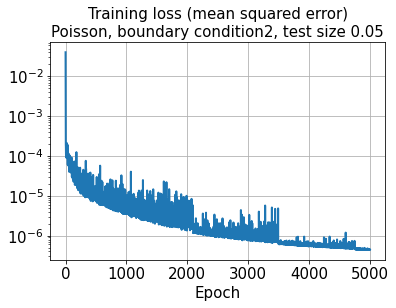

In [34]:
hist = history.history
plt.plot(hist['loss'], lw=2)
plt.title('Training loss (mean squared error)\nPoisson, boundary condition2, test size 0.05', size=15)
plt.xlabel('Epoch', size=15)
plt.yscale('log')
#plt.ylim([5e-5, 1e-1])
plt.tick_params(axis='both', which='major', labelsize=15)
plt.grid()
plt.savefig('')
plt.show()

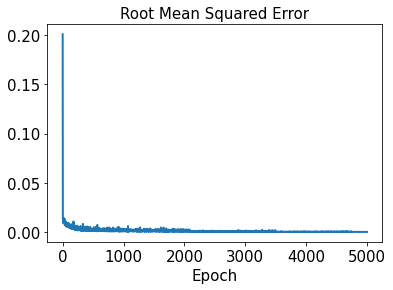

In [35]:
plt.plot(hist['rmse'], lw=2)
plt.title('Root Mean Squared Error', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

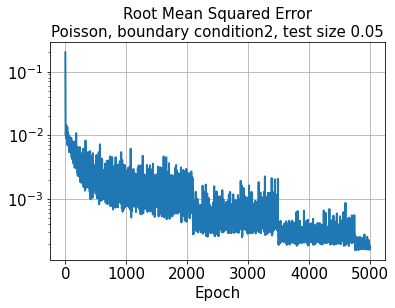

In [36]:
plt.plot(hist['rmse'], lw=2)
plt.title('Root Mean Squared Error\nPoisson, boundary condition2, test size 0.05', size=15)
plt.xlabel('Epoch', size=15)
plt.yscale('log')
plt.tick_params(axis='both', which='major', labelsize=15)
plt.grid()
plt.show()

In [37]:
#with mirrored_strategy.scope():
test_results = model.evaluate(x_train)

63/63 [==============================] - 0s 3ms/step - loss: 4.1247e-07 - rmse: 0.0000e+00


In [38]:
#with mirrored_strategy.scope():
decoded_train = model.predict(x_train)

63/63 [==============================] - 1s 10ms/step


In [39]:
#with mirrored_strategy.scope():
decoded_test = model.predict(x_test)

4/4 [==============================] - 0s 10ms/step


In [40]:
error_train_abs = np.abs(decoded_train - y_train)

In [41]:
error_test_abs = np.abs(decoded_test - y_test)

In [42]:
error_train_Cl_abs = np.abs(decoded_train[:,0,:] - y_train[:,0,:])

In [43]:
error_train_Cd_abs = np.abs(decoded_train[:,1,:] - y_train[:,1,:])

In [44]:
error_test_Cl_abs = np.abs(decoded_test[:,0,:] - y_test[:,0,:])

In [45]:
error_test_Cd_abs = np.abs(decoded_test[:,1,:] - y_test[:,1,:])

In [46]:
os.chdir("D:\\TrainedModels\\20221030")
model.save('Poisson_bc2_100kernel_2by2MaxPooling_2CNNlayer_testSize0.05.h5',
           overwrite=True, include_optimizer=True, save_format='h5')

In [47]:
l2_error_train = np.sqrt(np.sum((decoded_train - y_train)**2) / np.sum(y_train**2))
print(l2_error_train)

0.0003354244576055426


In [48]:
l2_error_test = np.sqrt(np.sum((decoded_test - y_test)**2) / np.sum(y_test**2))
print(l2_error_test)

0.004686275692025458


In [49]:
l2_error_train_list = []
for i in range(0, len(aa_train)):
    l2_error_train_data = np.sqrt(np.sum((decoded_train[i] - y_train[i])**2) / np.sum(y_train[i]**2))
    l2_error_train_list.append(l2_error_train_data)
#print(l2_error_train_list)

In [50]:
l2_error_test_list = []
for i in range(0, len(aa_test)):
    l2_error_test_data = np.sqrt(np.sum((decoded_test[i] - y_test[i])**2) / np.sum(y_test[i]**2))
    l2_error_test_list.append(l2_error_test_data)
#print(l2_error_test_list)

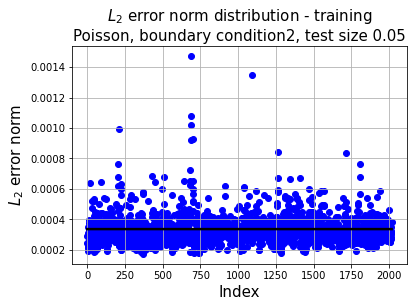

In [51]:
plt.plot(np.linspace(1, aa_train.shape[0], aa_train.shape[0]),
         l2_error_train*np.ones(aa_train.shape[0],), 'k', lw=2.5)
plt.scatter(np.linspace(1, aa_train.shape[0], aa_train.shape[0]), l2_error_train_list, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.title('$L_2$ error norm distribution - training\nPoisson, boundary condition2, test size 0.05',
          fontsize=15)
plt.grid()
save_variance_name = "20221030L2ErrorDistribution_Poisson_bc2(training).jpg"
plt.savefig(save_variance_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

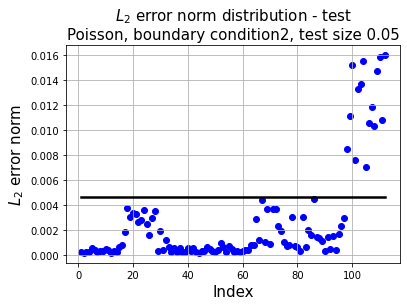

In [52]:
plt.plot(np.linspace(1, aa_test.shape[0], aa_test.shape[0]),
         l2_error_test*np.ones(aa_test.shape[0],), 'k', lw=2.5)
plt.scatter(np.linspace(1, aa_test.shape[0], aa_test.shape[0]), l2_error_test_list, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.title('$L_2$ error norm distribution - test\nPoisson, boundary condition2, test size 0.05',
          fontsize=15)
plt.grid()
save_variance_name = "20221030L2ErrorDistribution_Poisson_bc2(test).jpg"
plt.savefig(save_variance_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

In [53]:
os.chdir("D:\\CNN_poisson_files\\images\\20221030\\testSize0.05")

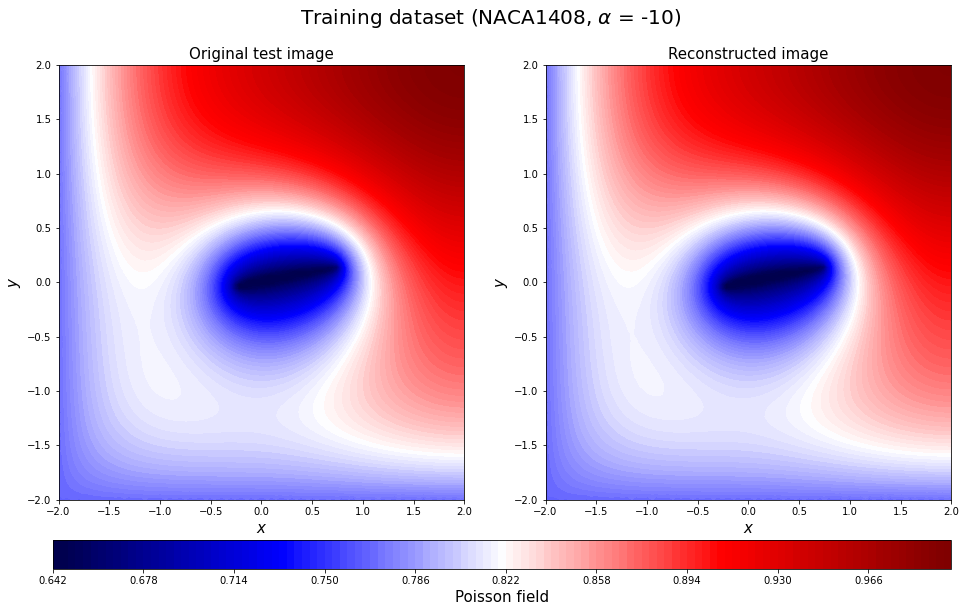

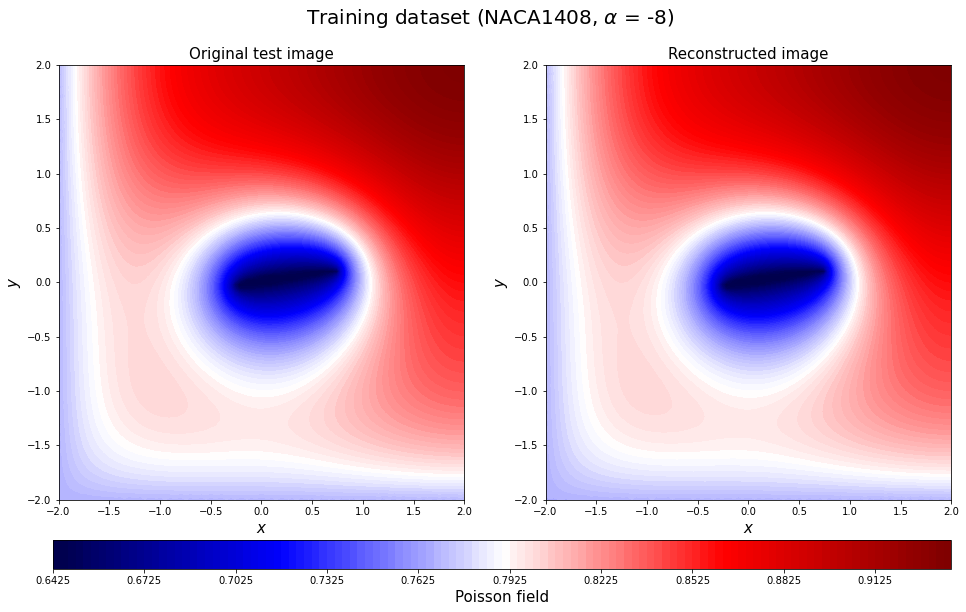

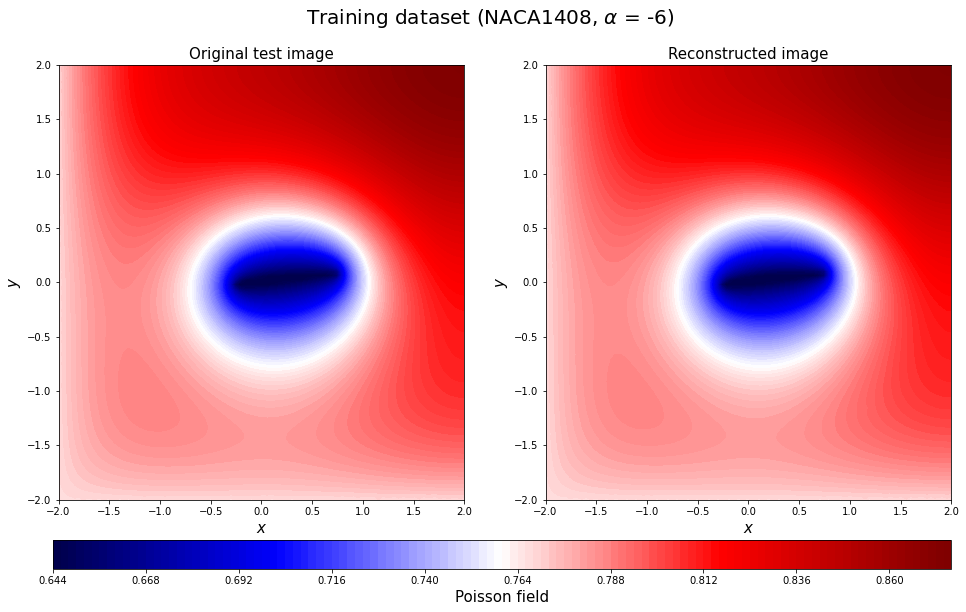

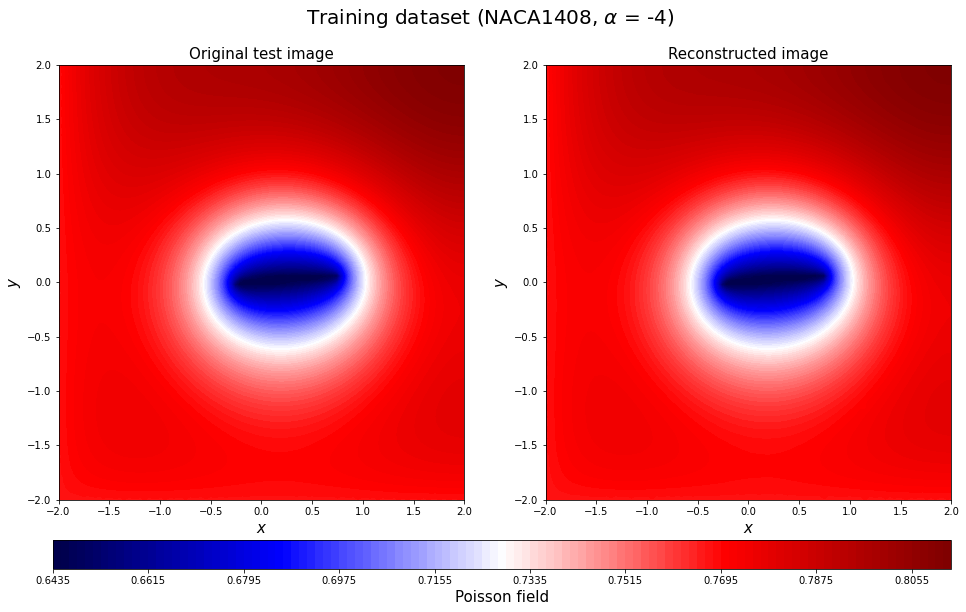

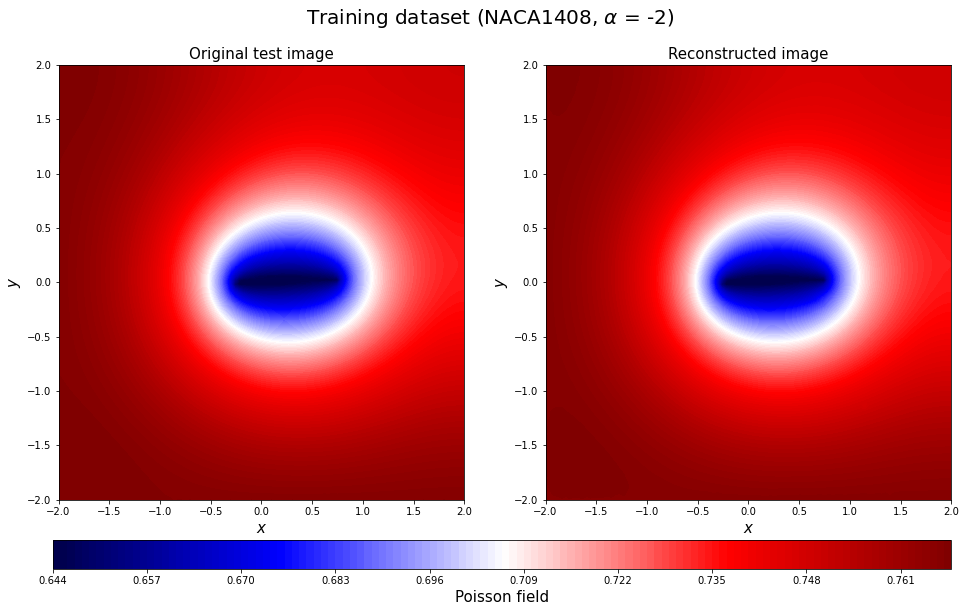

...

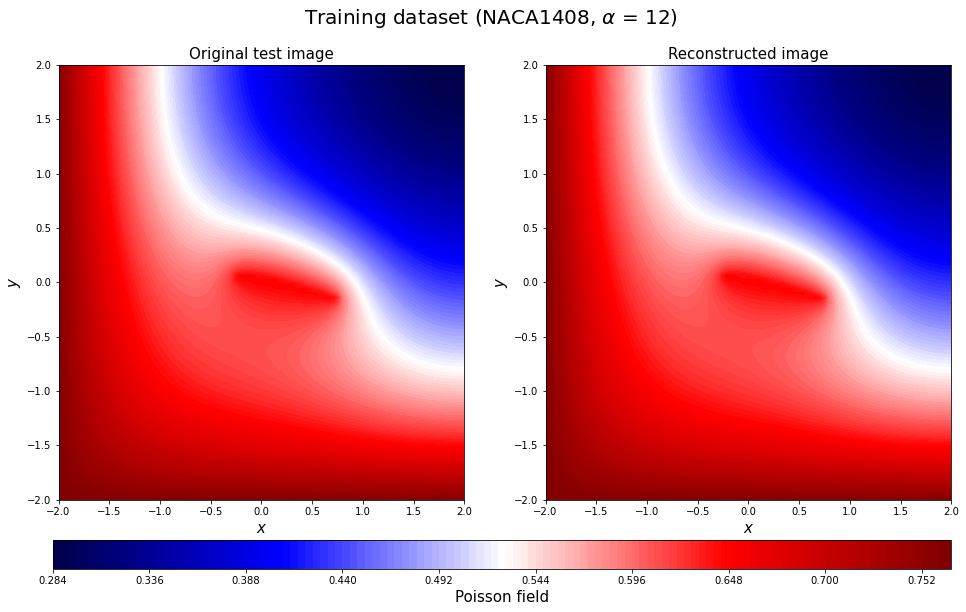

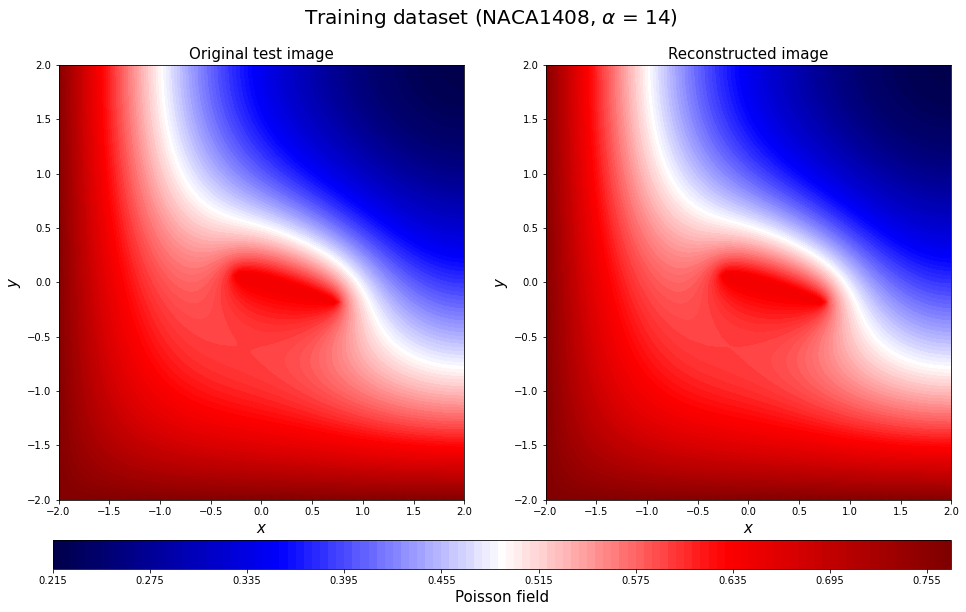

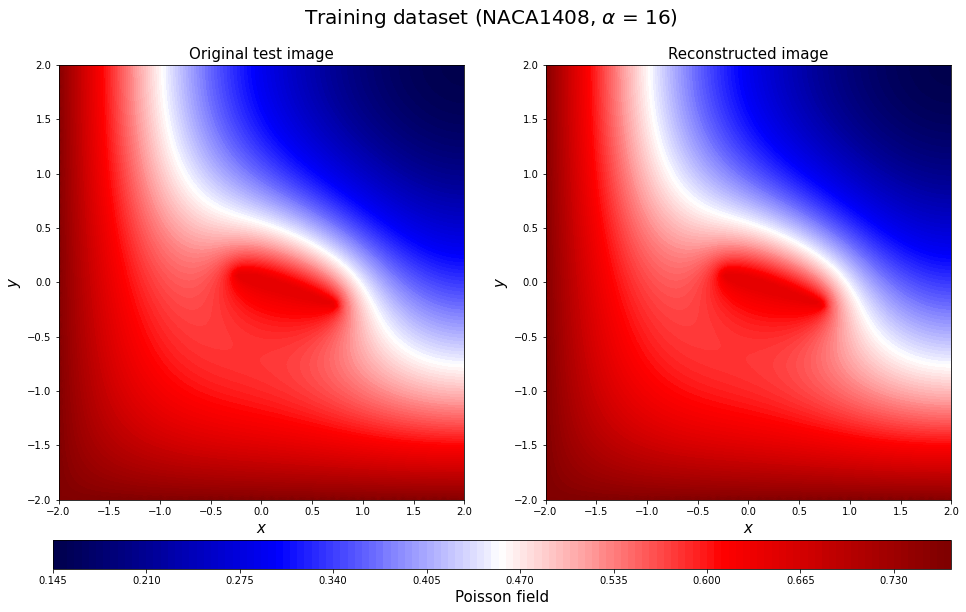

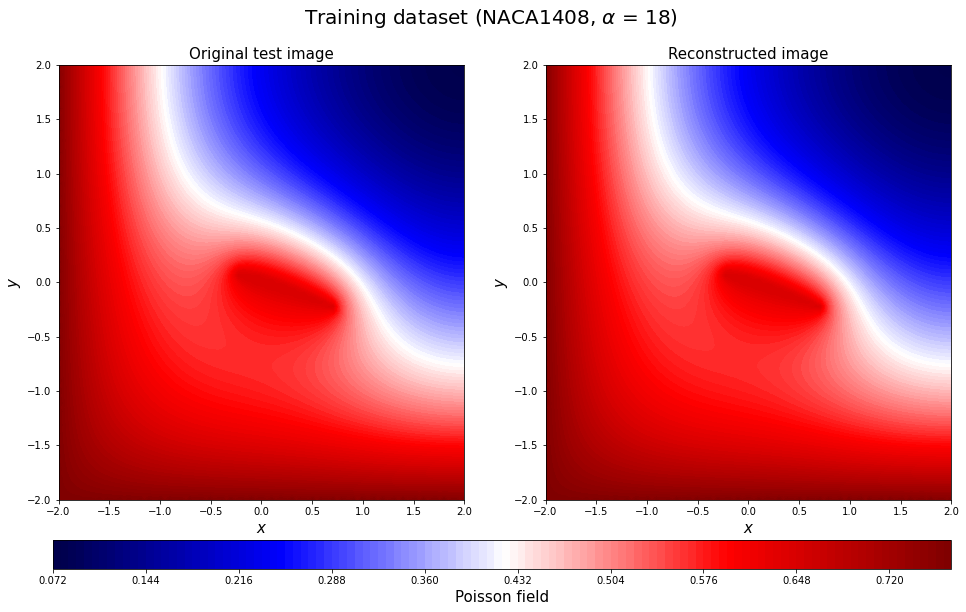

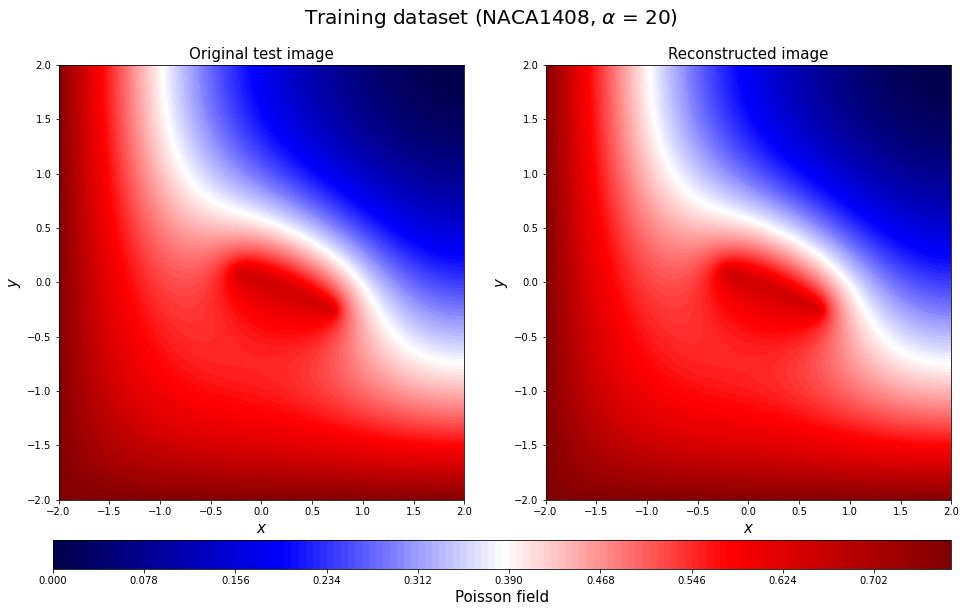

In [54]:
for c in range(0,16):
    plt.figure(figsize=(16, 8))
    y_train0_rotate = y_train[c].reshape(n_grid,n_grid).T
    decoded_rotate = decoded_train[c].reshape(n_grid,n_grid).T

    xrange = np.linspace(-2, 2, n_grid)
    yrange = np.linspace(-2, 2, n_grid)
    xmesh, ymesh = np.meshgrid(xrange, yrange)

    ax = plt.subplot(1, 2, 1)
    a1 = plt.contourf(xmesh, ymesh, y_train0_rotate, vmin=np.min(y_train0_rotate),
                      vmax = np.max(y_train0_rotate), levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Original test image', fontsize=15)

    # Display reconstruction
    ax = plt.subplot(1, 2, 2)
    a2 = plt.contourf(xmesh, ymesh, decoded_rotate, vmin=np.min(y_train0_rotate),
                      vmax = np.max(y_train0_rotate), levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Reconstructed image', fontsize=15)
    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
    cbar.set_label('Poisson field', fontsize=15)
    #cbar.set_ticks([-0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

    plt.suptitle(r'Training dataset (%s, $\alpha$ = %d)' %(np.array2string(geo_train[c])[3:-2], aa_train[c]),fontsize=20)
    save_fig_name = "20221030Prediction_Poisson_bc2(training)"+str(np.array2string(geo_train[c])[3:-2])+str(aa_train[c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

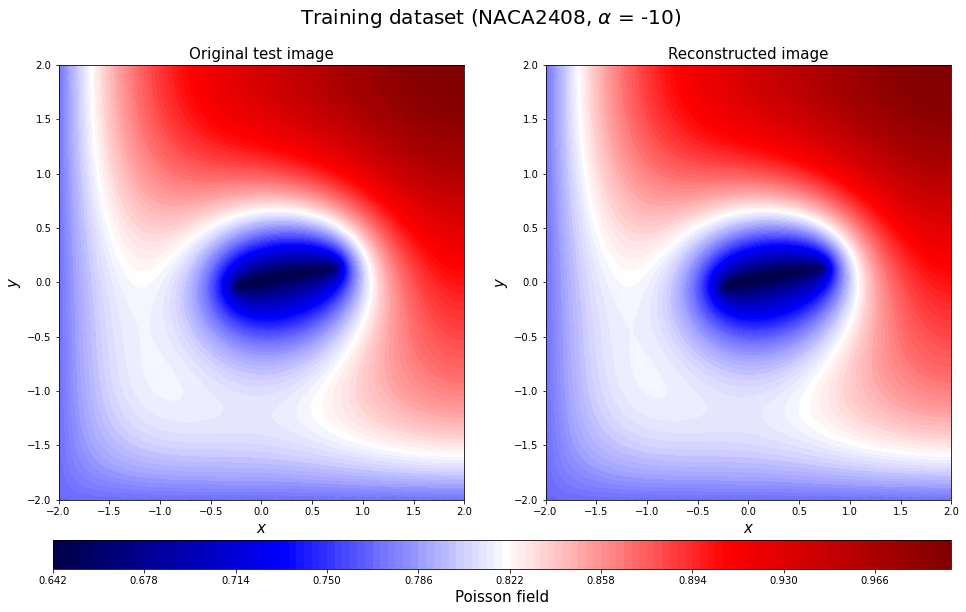

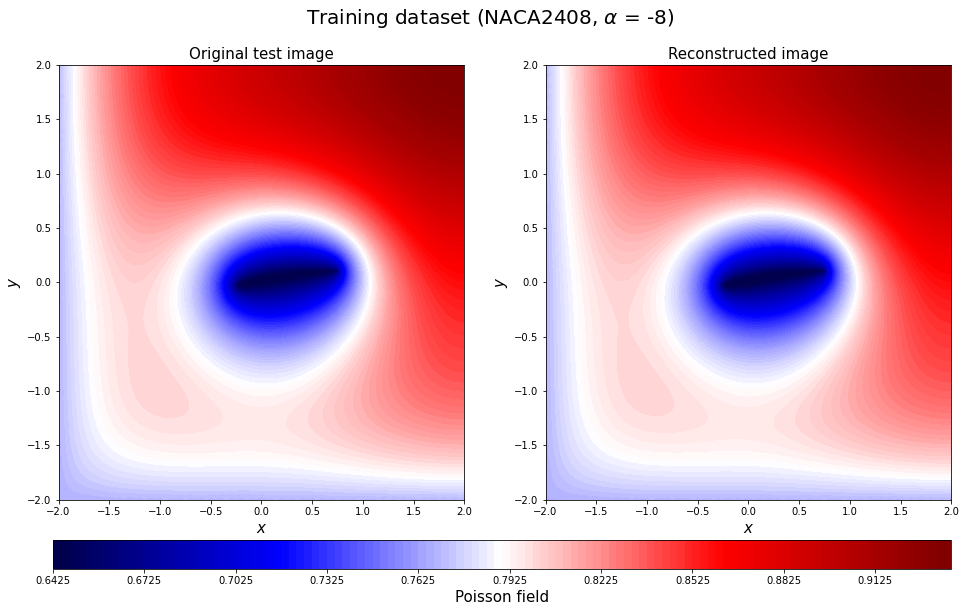

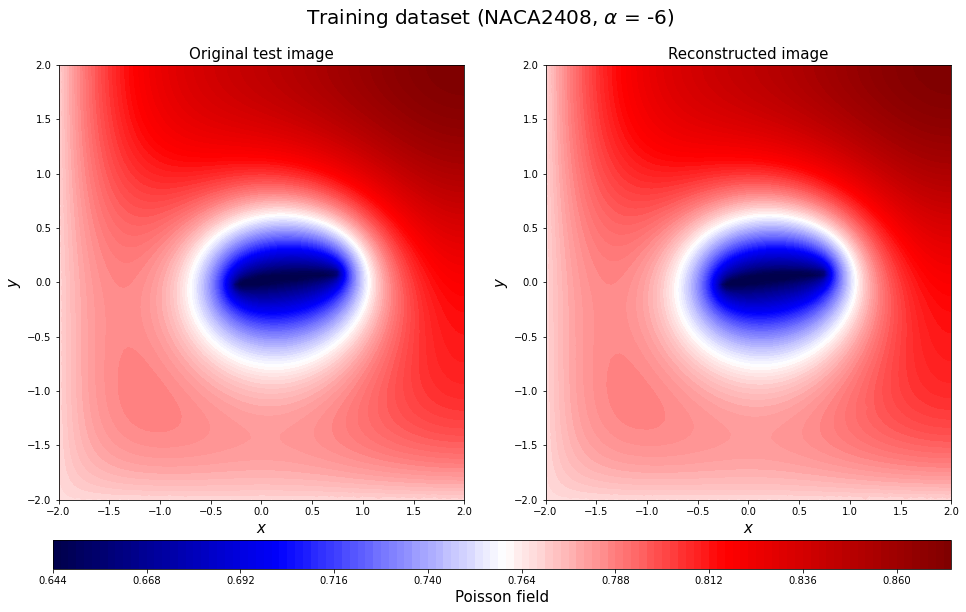

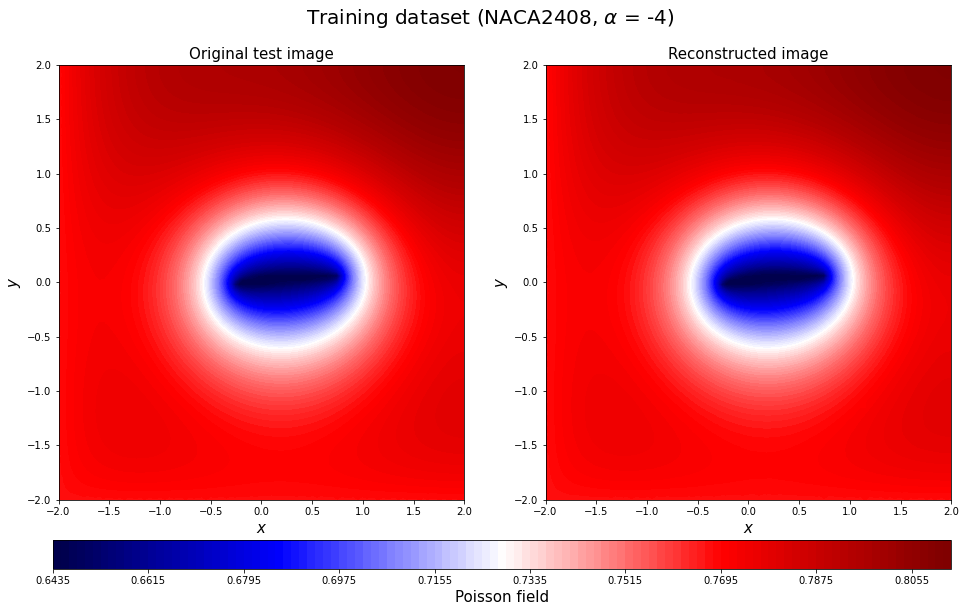

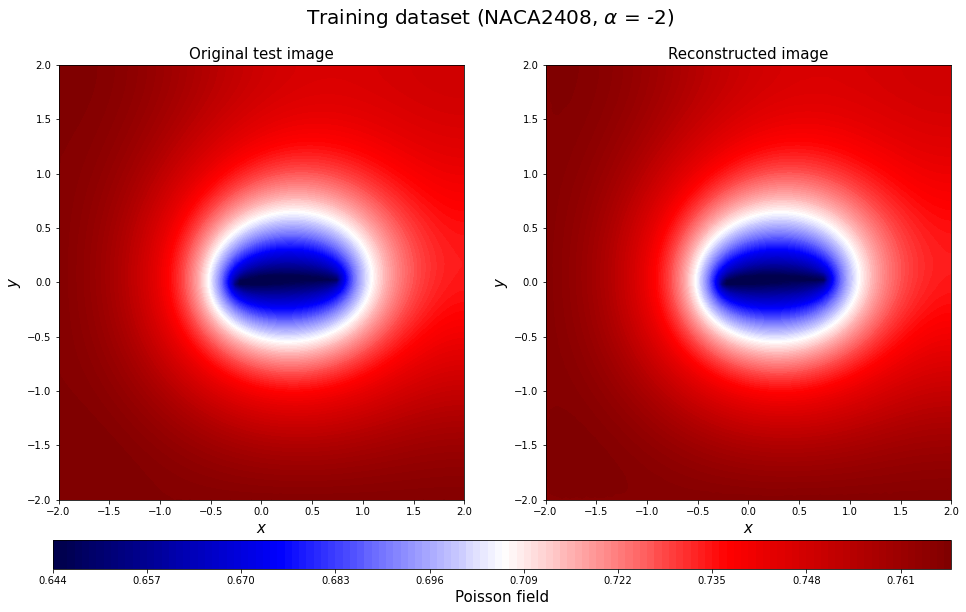

...

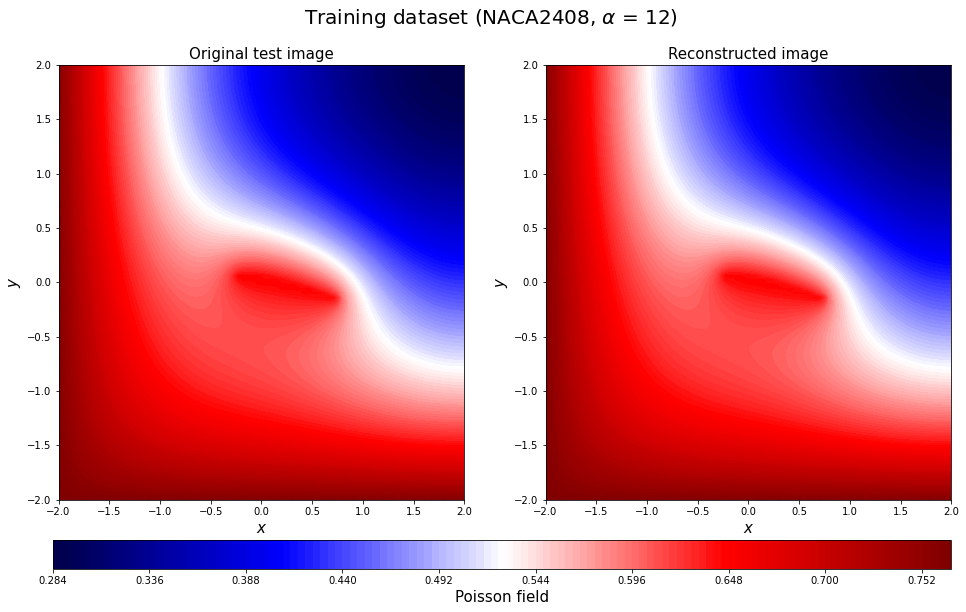

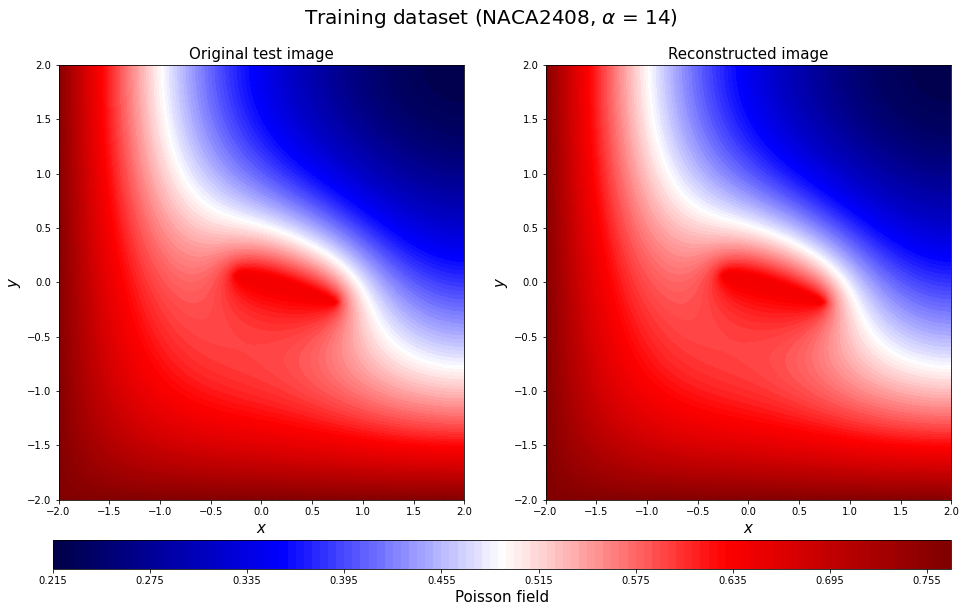

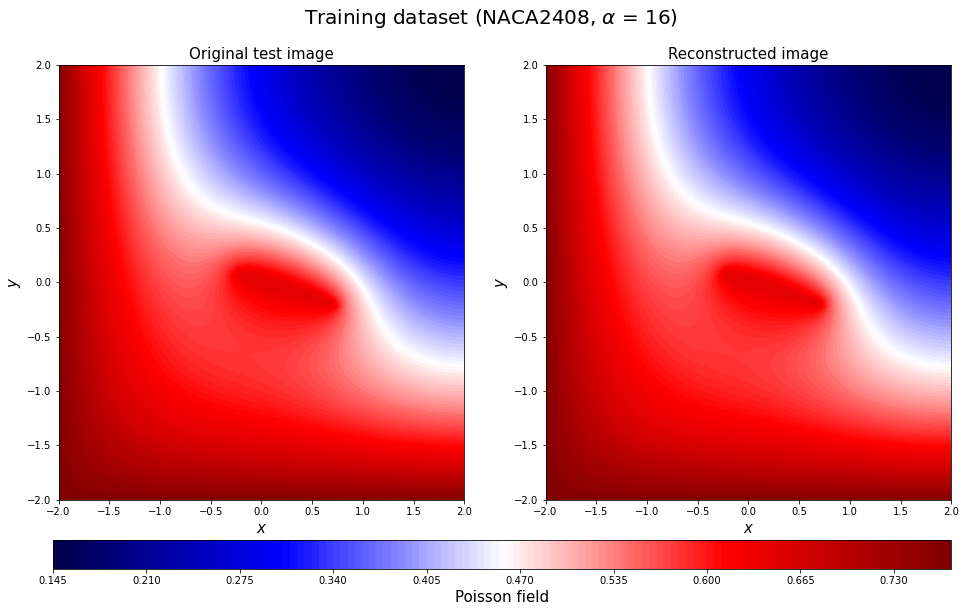

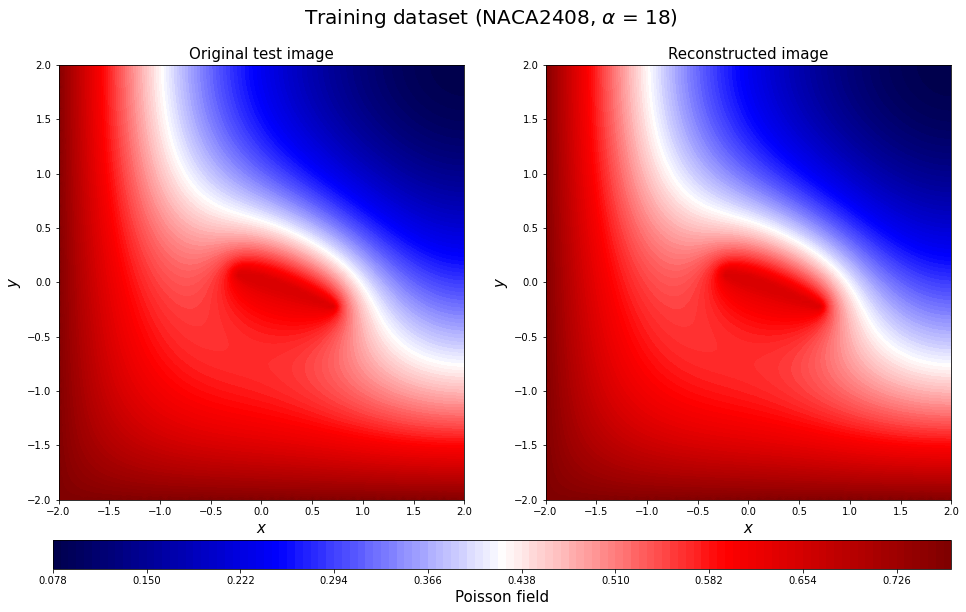

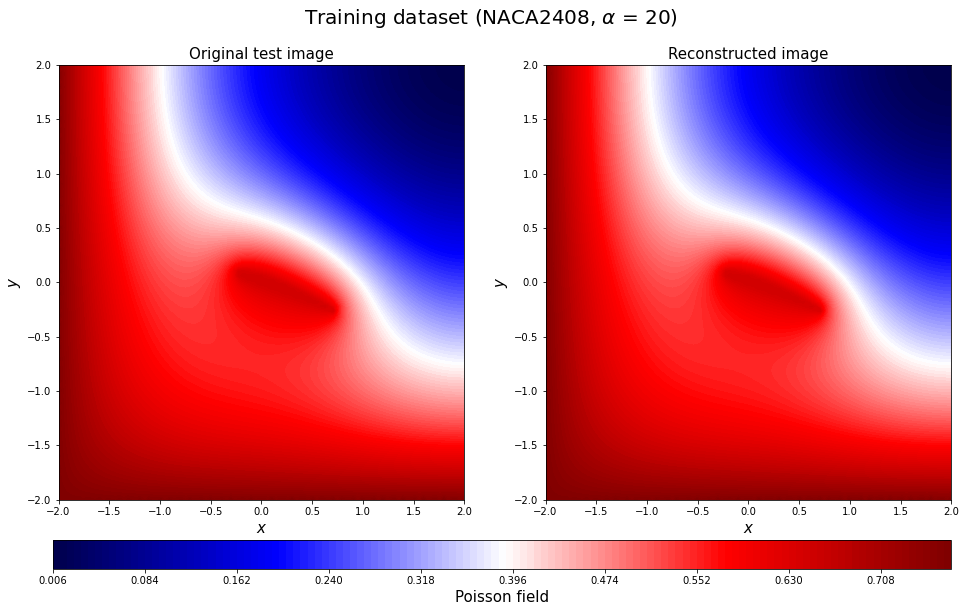

In [55]:
for c in range(0,16):
    plt.figure(figsize=(16, 8))
    y_train20_rotate = y_train[20*16+c].reshape(n_grid,n_grid).T
    decoded_rotate = decoded_train[20*16+c].reshape(n_grid,n_grid).T

    xrange = np.linspace(-2, 2, n_grid)
    yrange = np.linspace(-2, 2, n_grid)
    xmesh, ymesh = np.meshgrid(xrange, yrange)

    ax = plt.subplot(1, 2, 1)
    a1 = plt.contourf(xmesh, ymesh, y_train20_rotate, vmin=np.min(y_train20_rotate),
                      vmax=np.max(y_train20_rotate), levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Original test image', fontsize=15)

    # Display reconstruction
    ax = plt.subplot(1, 2, 2)
    a2 = plt.contourf(xmesh, ymesh, decoded_rotate, vmin=np.min(y_train20_rotate),
                      vmax=np.max(y_train20_rotate), levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Reconstructed image', fontsize=15)
    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
    cbar.set_label('Poisson field', fontsize=15)
    #cbar.set_ticks([-0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

    plt.suptitle(r'Training dataset (%s, $\alpha$ = %d)' %(np.array2string(geo_train[20*16+c])[3:-2], aa_train[20*16+c]),fontsize=20)
    save_fig_name = "20221030Prediction_Poisson_bc2(training)"+str(np.array2string(geo_train[20*16+c])[3:-2])+str(aa_train[20*16+c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

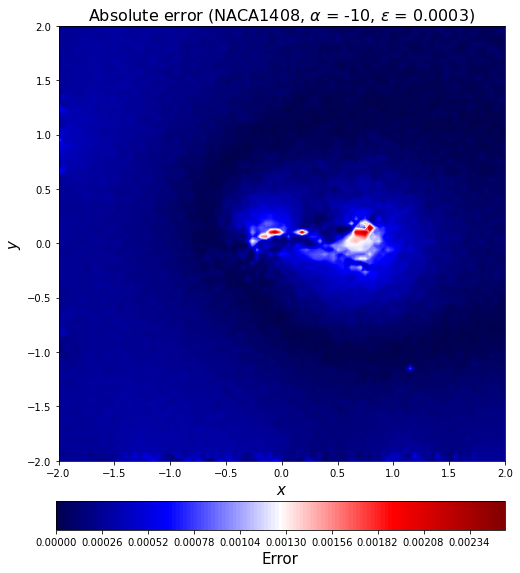

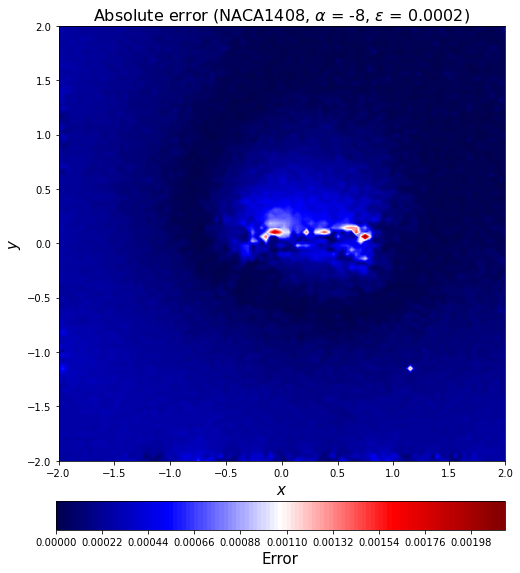

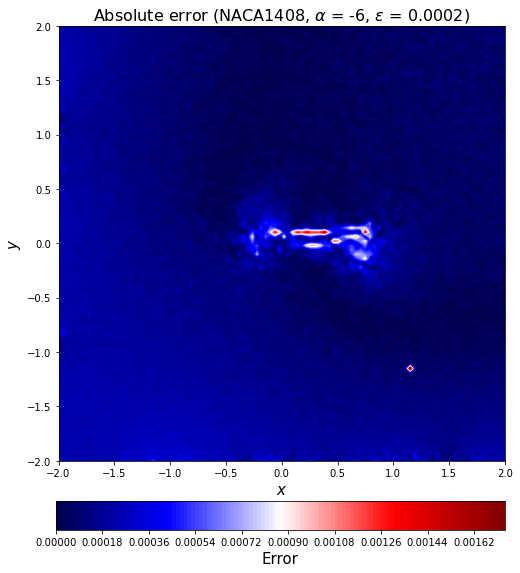

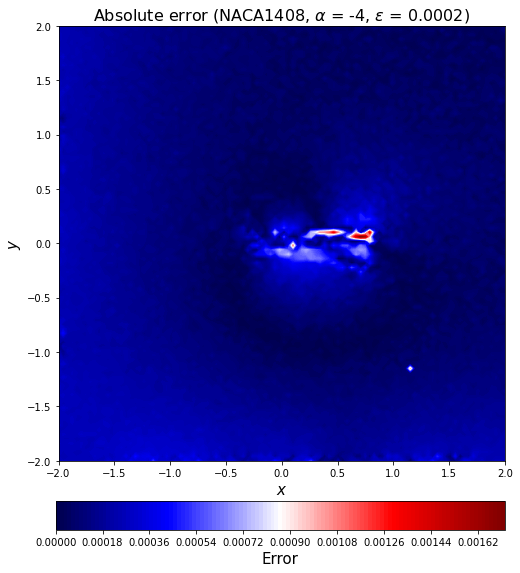

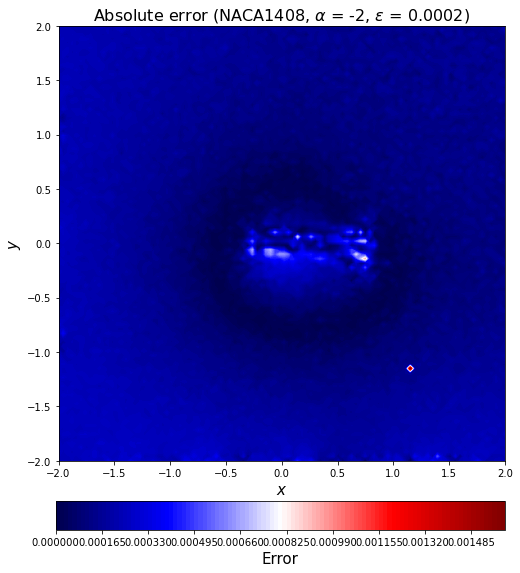

...

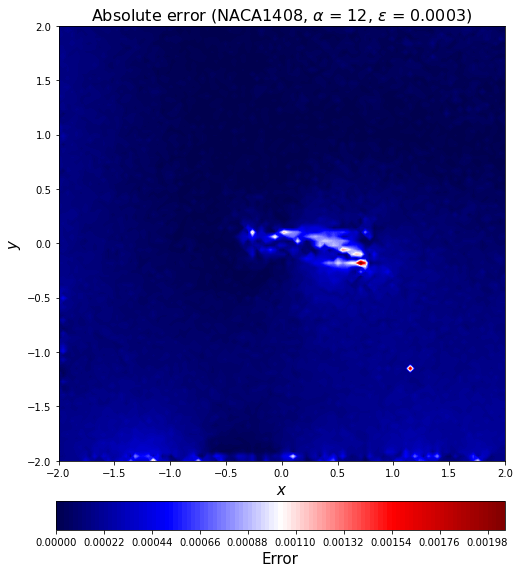

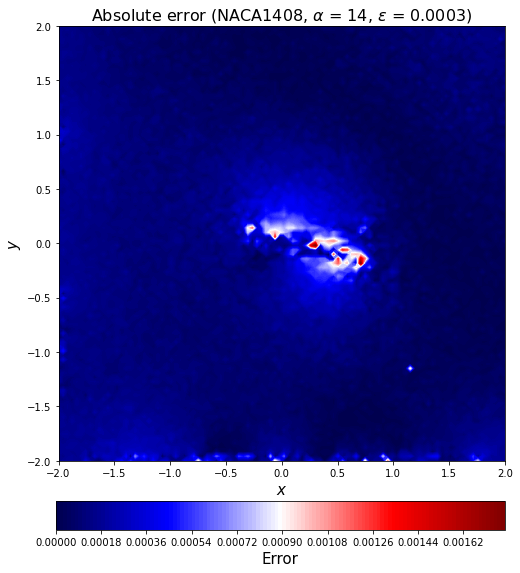

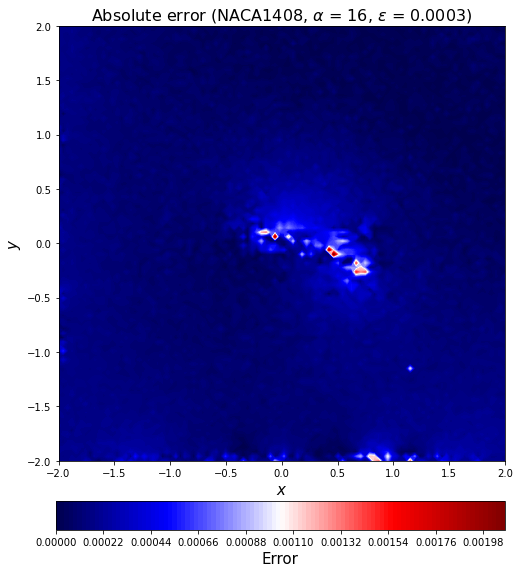

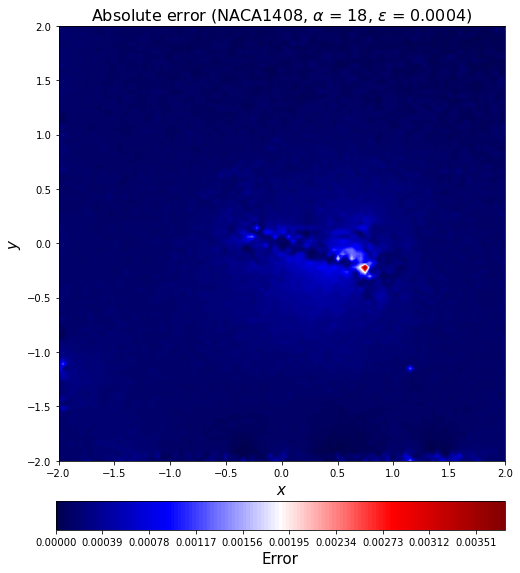

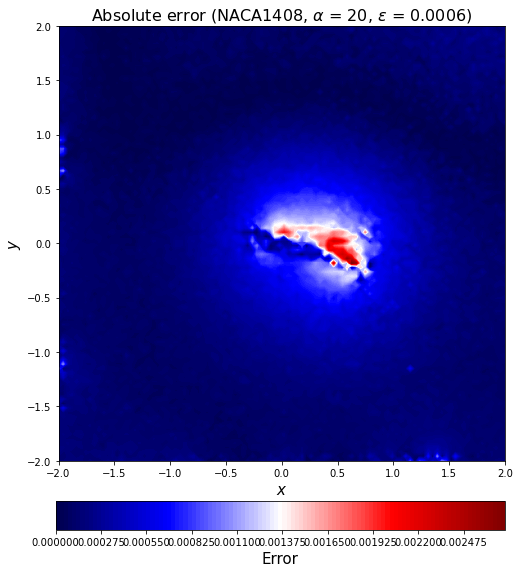

In [56]:
for c in range(0,16):
    error_train_abs2_rotate = error_train_abs[c].reshape(n_grid,n_grid).T

    fig5 = plt.figure(figsize = (8, 8))
    ax5 = fig5.add_subplot(111)
    mappable = ax5.contourf(xmesh, ymesh, error_train_abs2_rotate, levels=128, cmap='seismic')
    ax5.set_title(r'Absolute error (%s, $\alpha$ = %d, $\epsilon$ = %.4f)' %(np.array2string(geo_train[c])[3:-2],
                                                                             aa_train[c], l2_error_train_list[c]), fontsize=16)
    ax5.set_xlabel('$x$', fontsize=15)
    ax5.set_ylabel('$y$', fontsize=15)

    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
    cbar.set_label('Error', fontsize=15)

    save_fig_name = "20221030PredictionError_Poisson_bc2(training)"+str(np.array2string(geo_train[c])[3:-2])+str(aa_train[c])[3:-2]+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

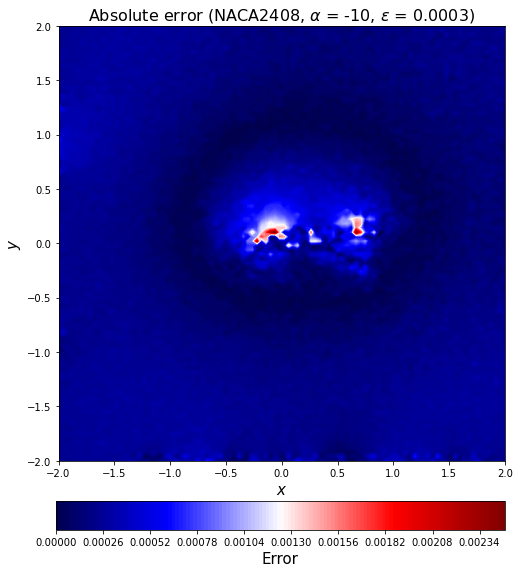

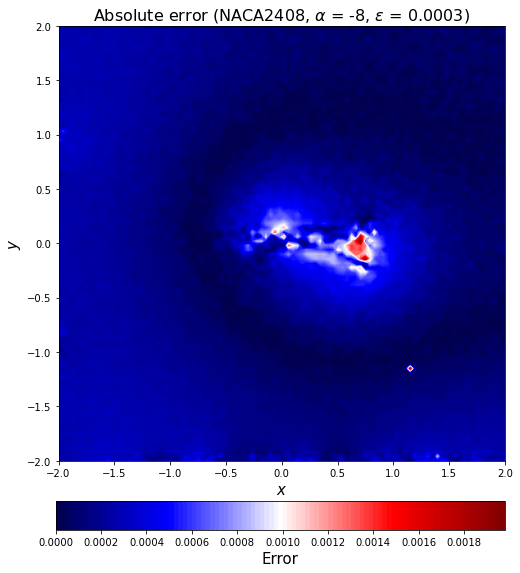

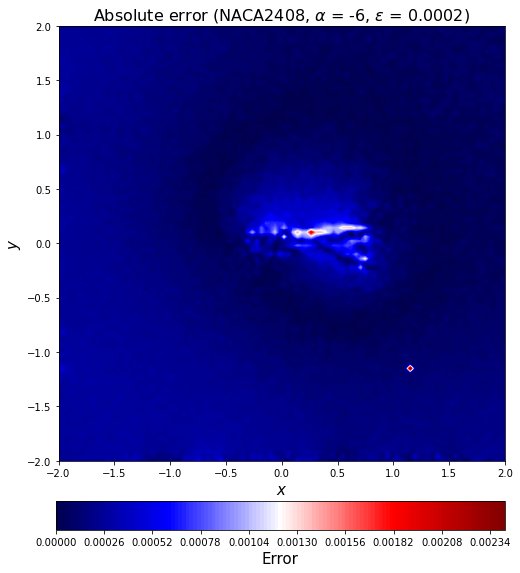

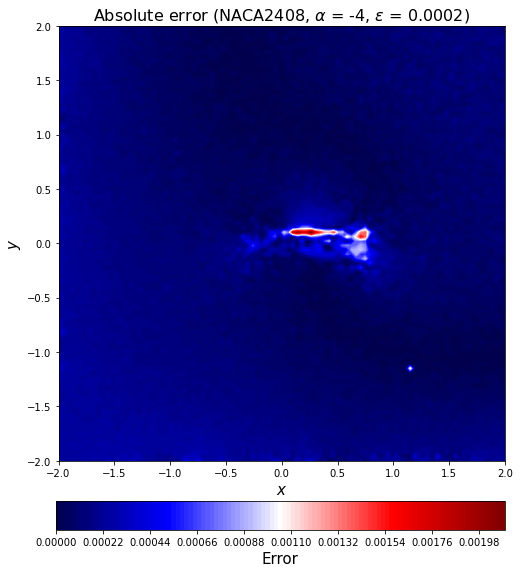

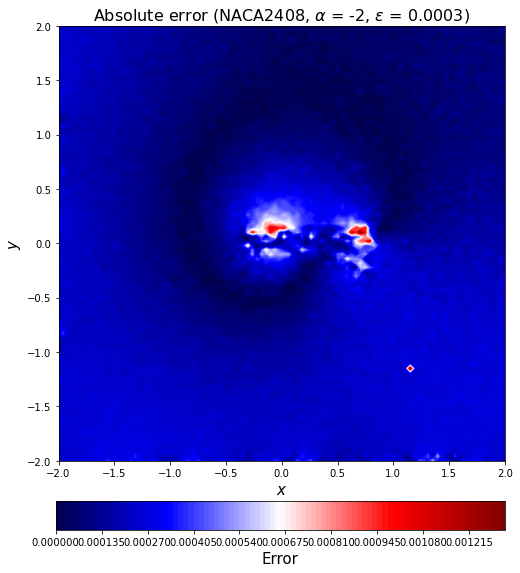

...

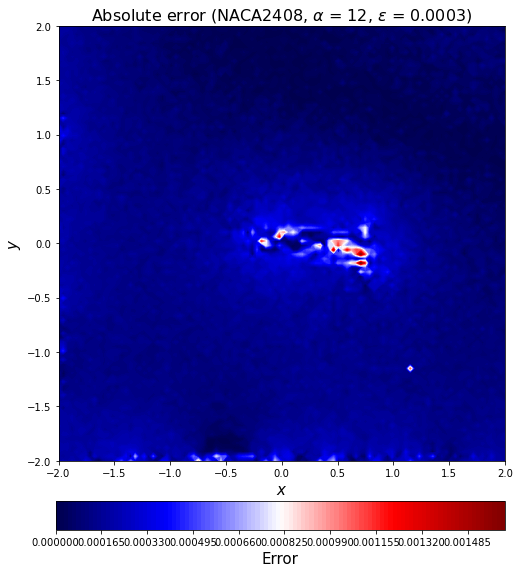

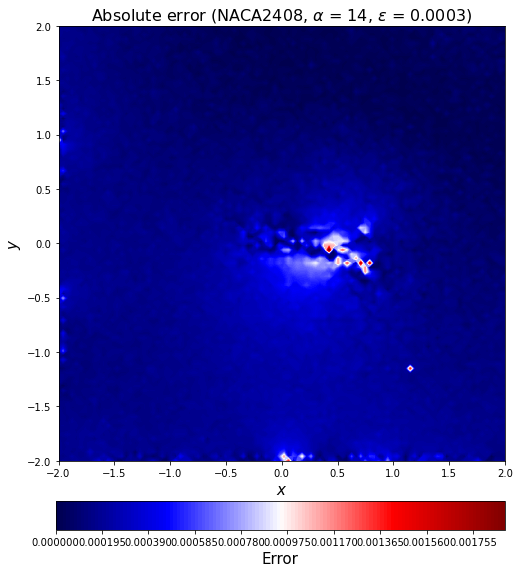

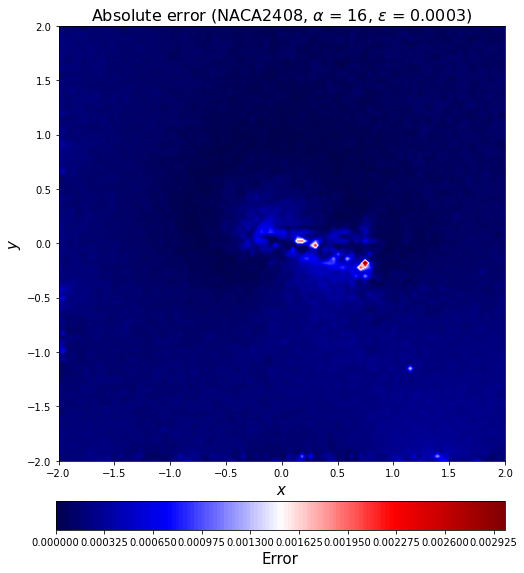

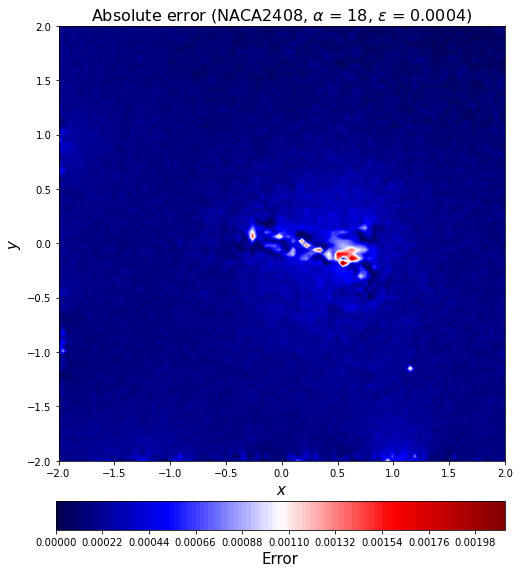

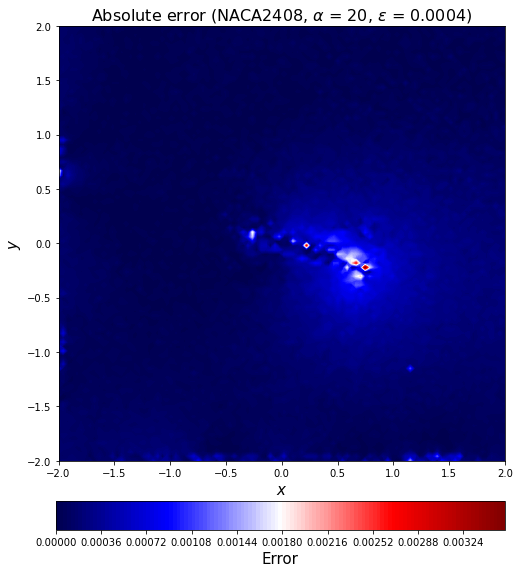

In [57]:
for c in range(0,16):
    error_train_abs2_rotate = error_train_abs[16*20+c].reshape(n_grid,n_grid).T

    fig5 = plt.figure(figsize = (8, 8))
    ax5 = fig5.add_subplot(111)
    mappable = ax5.contourf(xmesh, ymesh, error_train_abs2_rotate, levels=128, cmap='seismic')
    ax5.set_title(r'Absolute error (%s, $\alpha$ = %d, $\epsilon$ = %.4f)' %(np.array2string(geo_train[16*20+c])[3:-2],
                                                                             aa_train[16*20+c], l2_error_train_list[16*20+c]),fontsize=16)
    ax5.set_xlabel('$x$', fontsize=15)
    ax5.set_ylabel('$y$', fontsize=15)

    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
    cbar.set_label('Error', fontsize=15)

    save_fig_name = "20221030PredictionError_Poisson_bc2(training)"+str(np.array2string(geo_train[16*20+c])[3:-2])+str(aa_train[16*20+c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

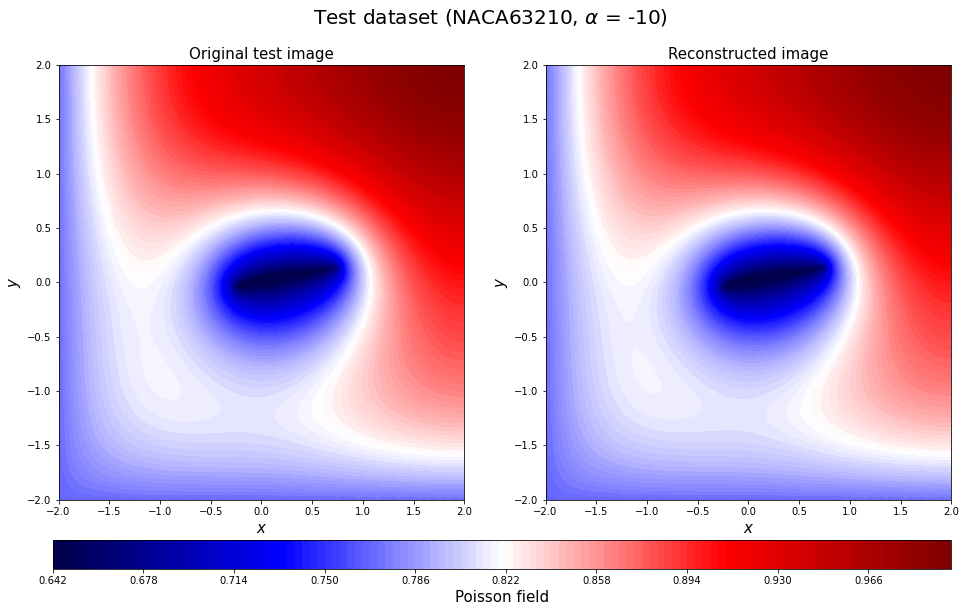

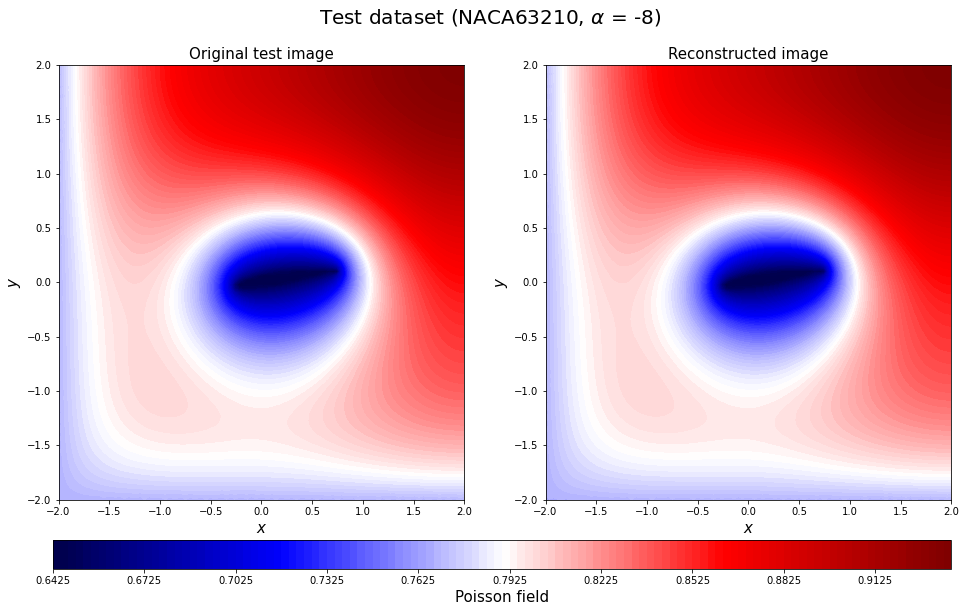

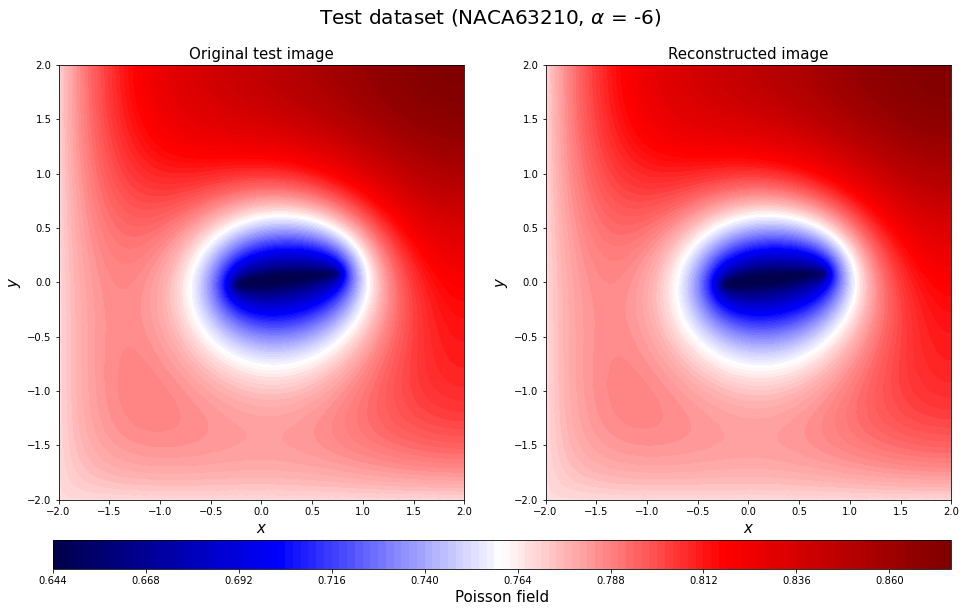

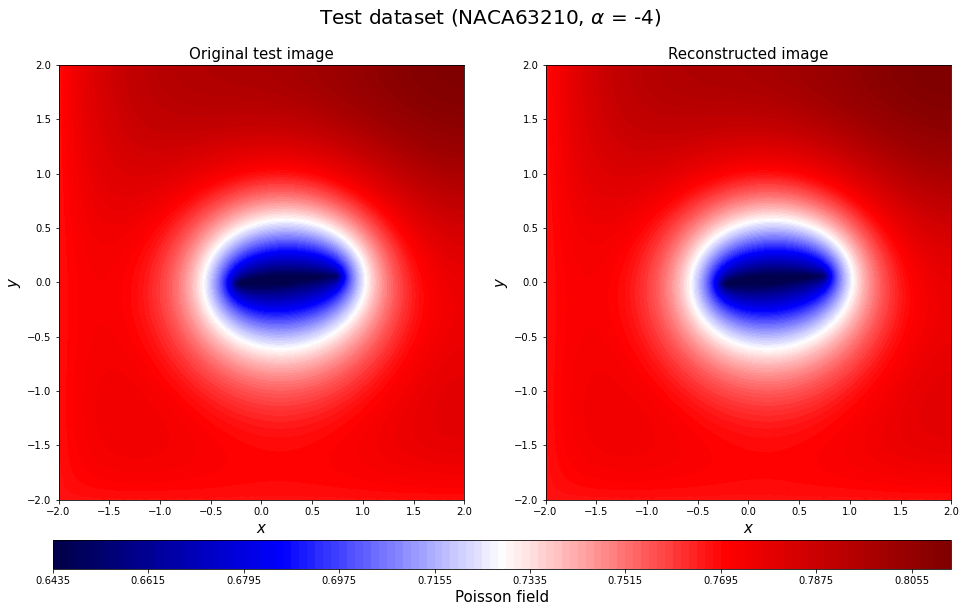

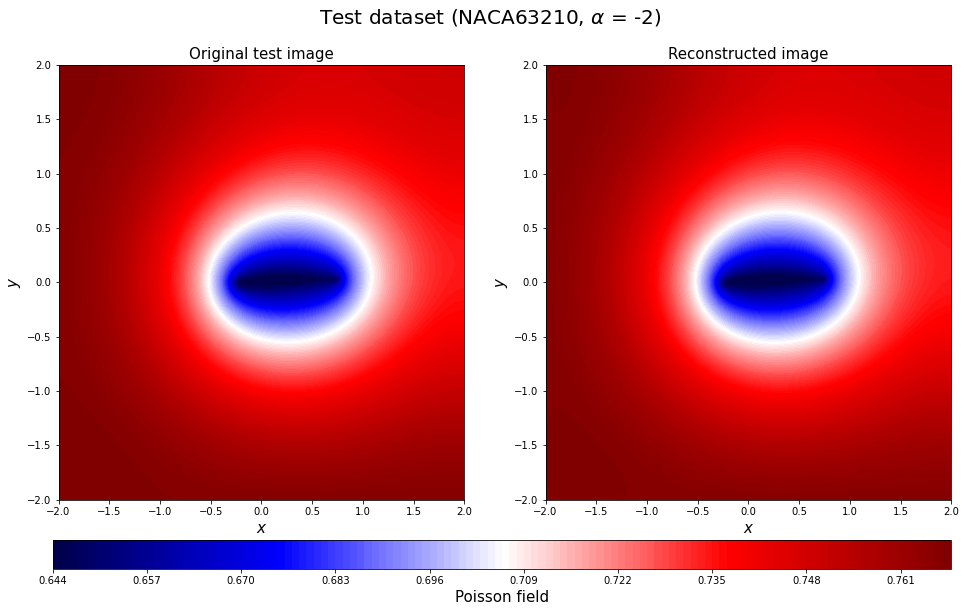

...

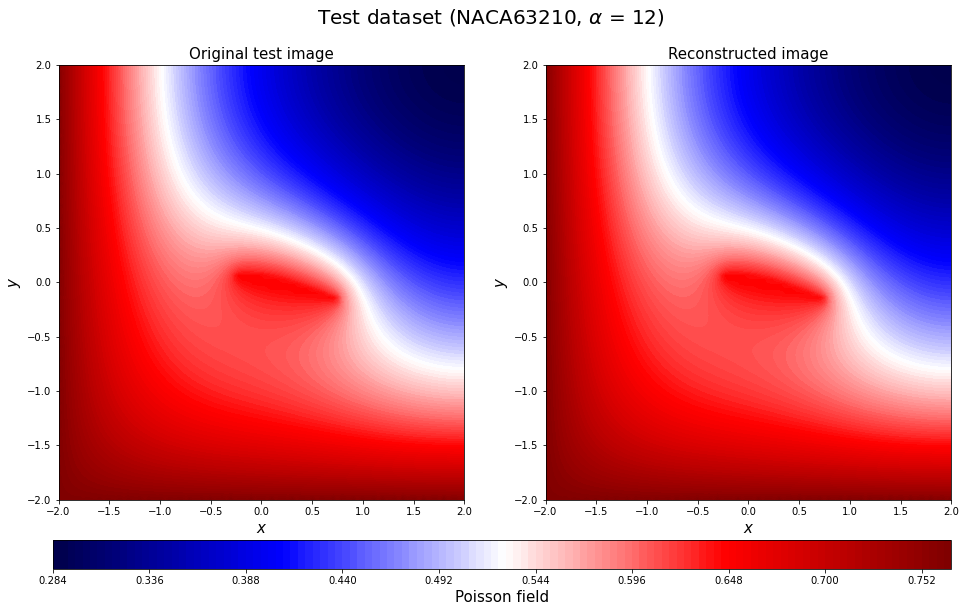

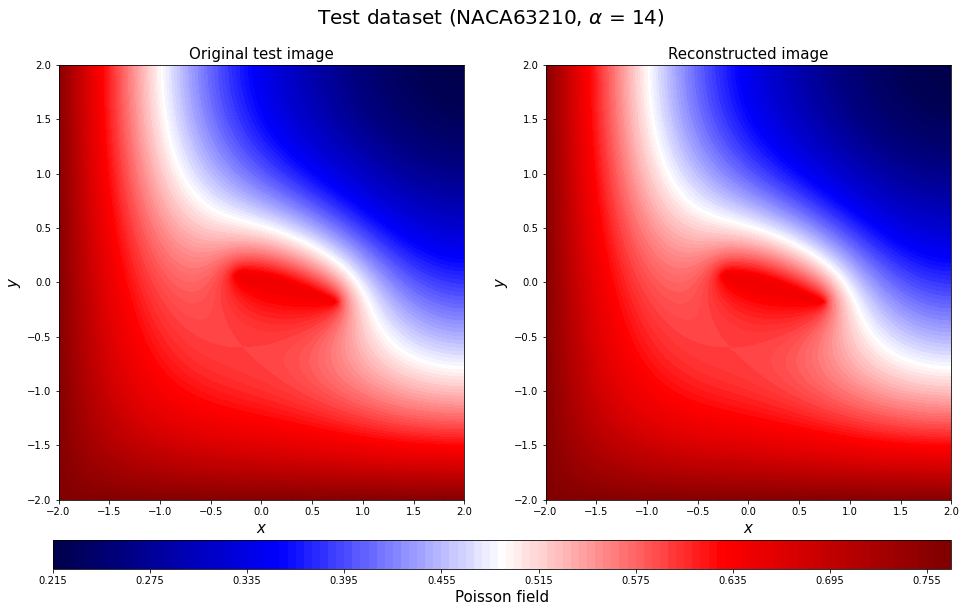

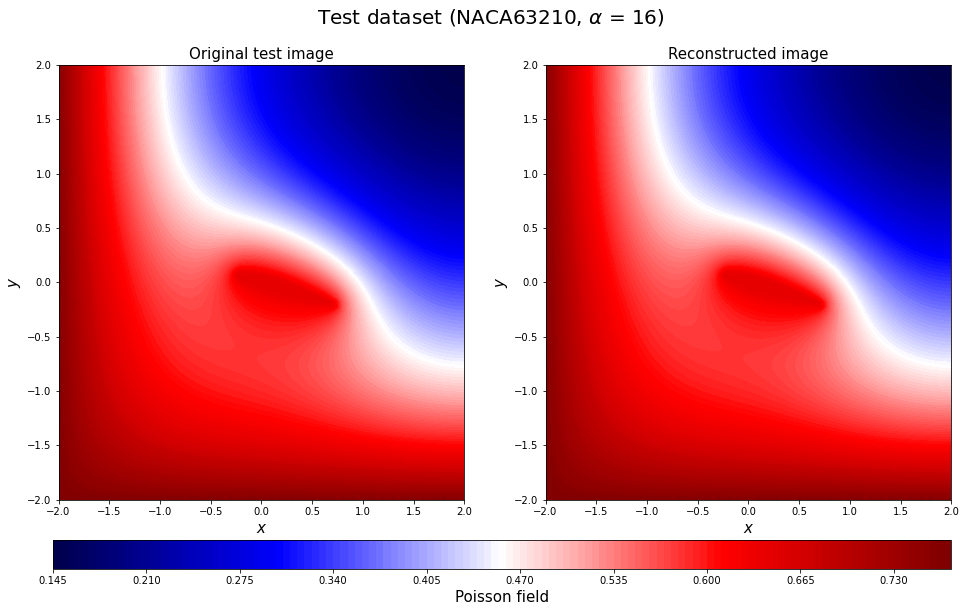

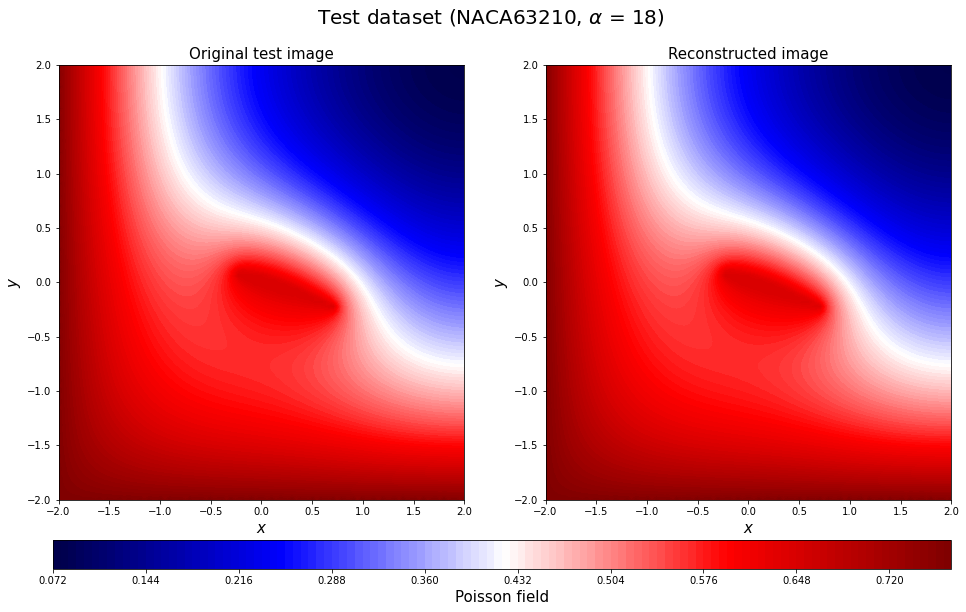

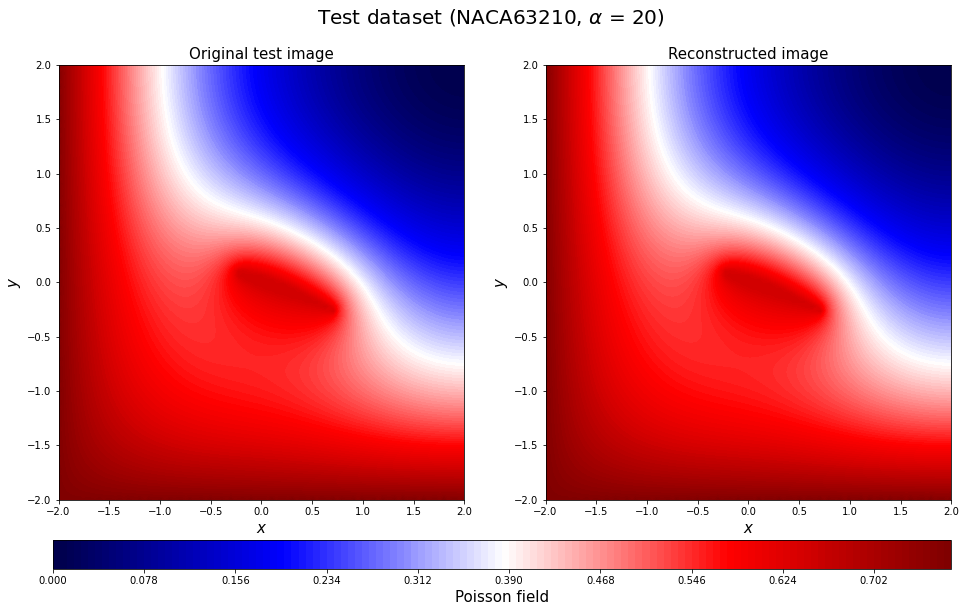

In [58]:
for c in range(0,16):
    plt.figure(figsize=(16, 8))
    y_test2_rotate = y_test[2*16+c].reshape(n_grid,n_grid).T
    decoded_rotate = decoded_test[2*16+c].reshape(n_grid,n_grid).T

    xrange = np.linspace(-2, 2, n_grid)
    yrange = np.linspace(-2, 2, n_grid)
    xmesh, ymesh = np.meshgrid(xrange, yrange)

    ax = plt.subplot(1, 2, 1)
    a1 = plt.contourf(xmesh, ymesh, y_test2_rotate, vmin=np.min(y_test2_rotate), 
                      vmax=np.max(y_test2_rotate), levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Original test image', fontsize=15)

    # Display reconstruction
    ax = plt.subplot(1, 2, 2)
    a2 = plt.contourf(xmesh, ymesh, decoded_rotate, vmin=np.min(y_test2_rotate), 
                      vmax=np.max(y_test2_rotate), levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Reconstructed image', fontsize=15)
    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
    cbar.set_label('Poisson field', fontsize=15)
    #cbar.set_ticks([-0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

    plt.suptitle(r'Test dataset (%s, $\alpha$ = %d)' %(np.array2string(geo_test[2*16+c])[3:-2], aa_test[2*16+c]),fontsize=20)
    save_fig_name = "20221030Prediction_Poisson_bc2(test)"+str(np.array2string(geo_test[2*16+c])[3:-2])+str(aa_test[2*16+c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

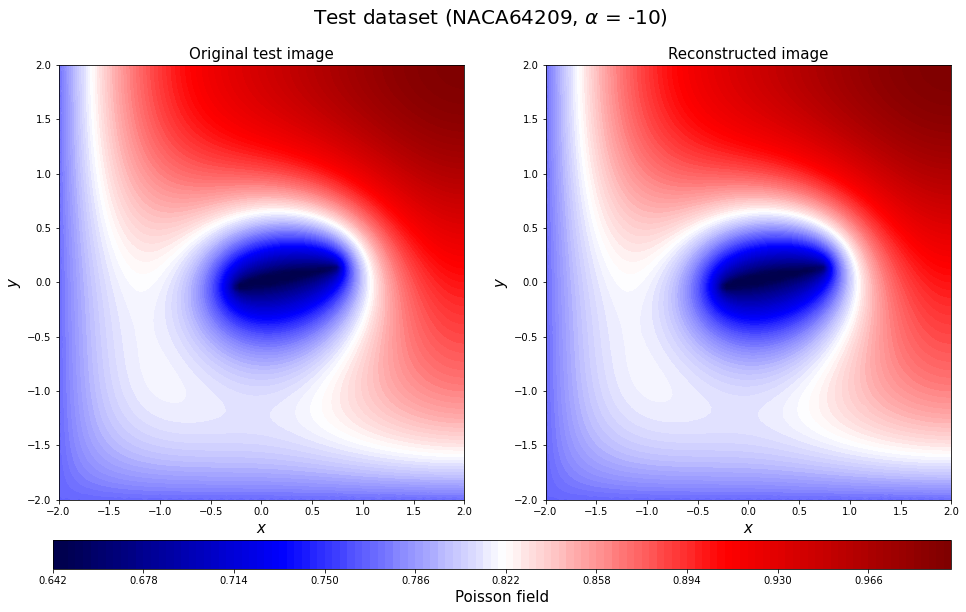

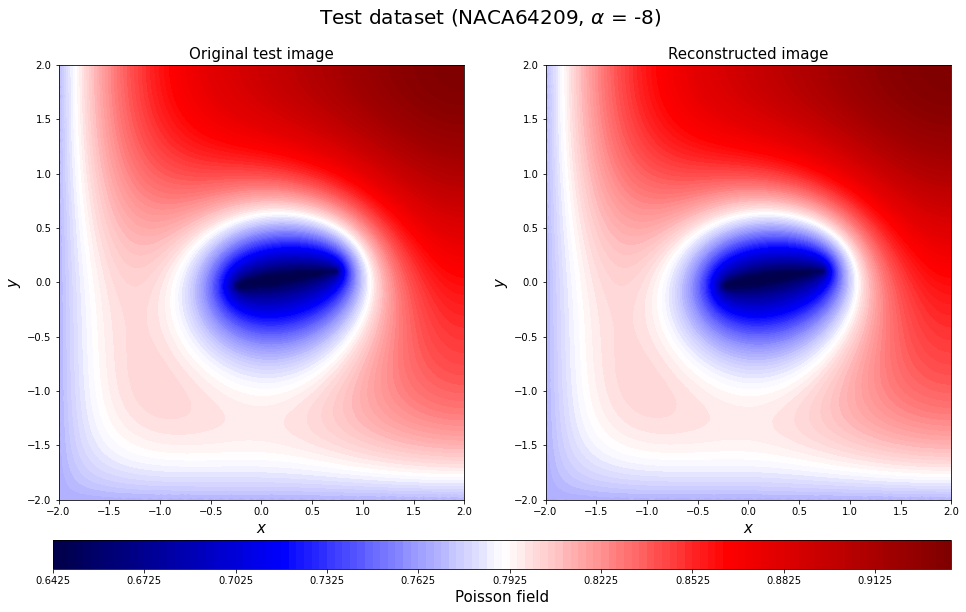

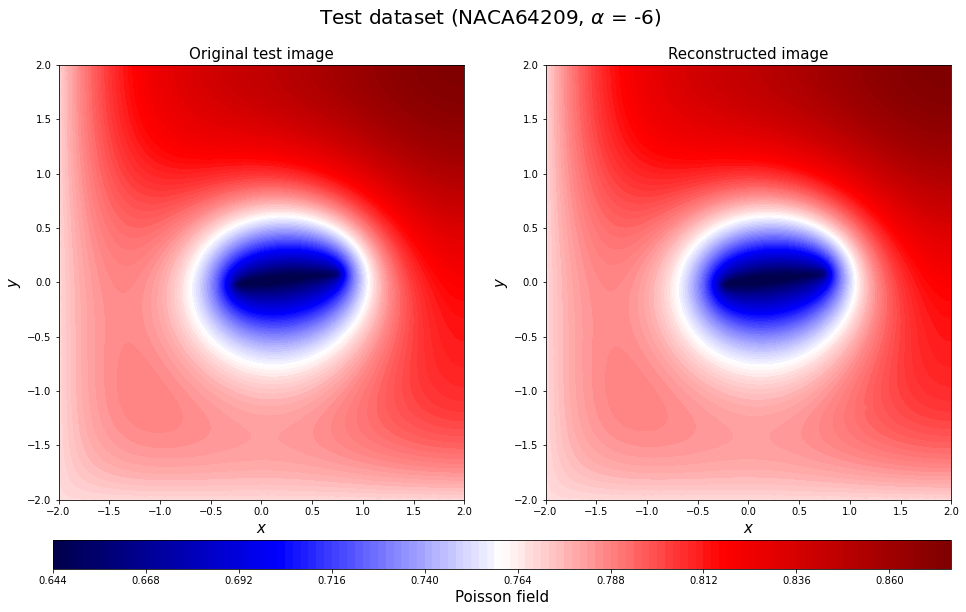

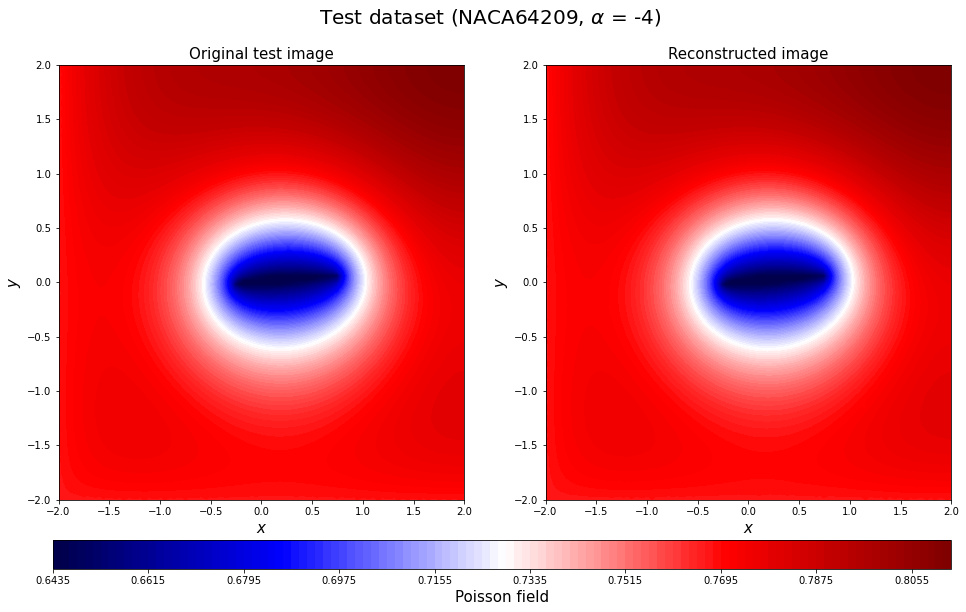

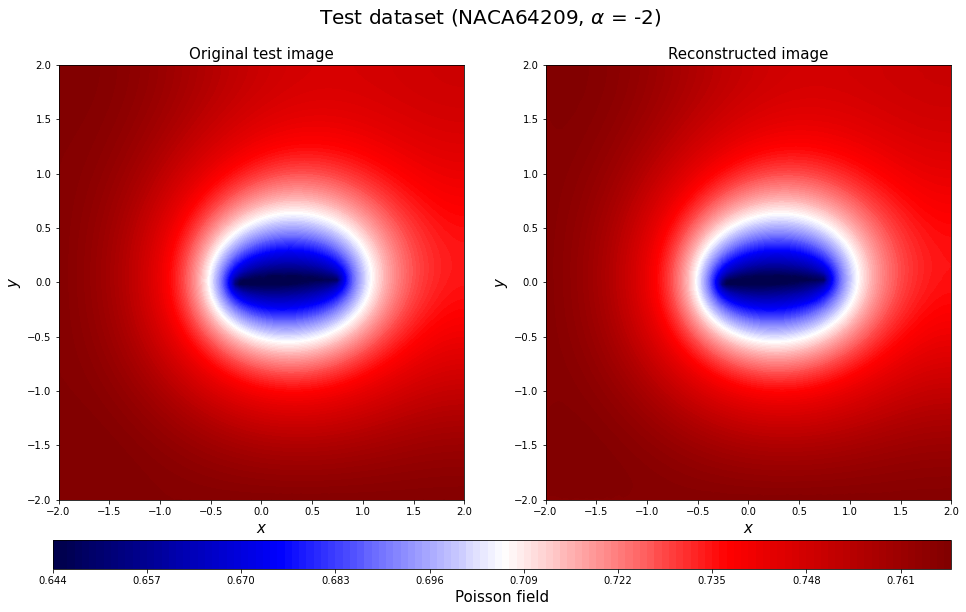

...

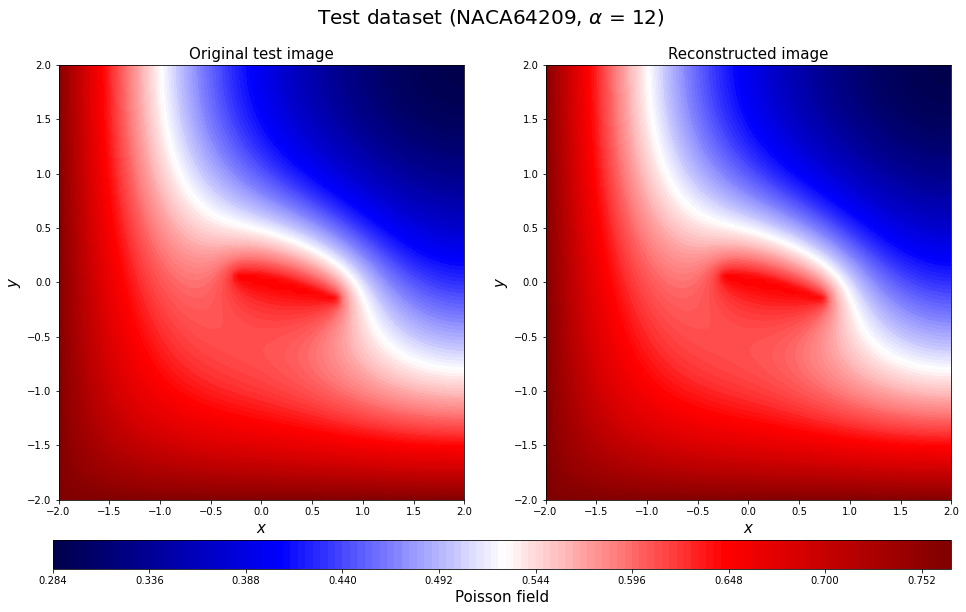

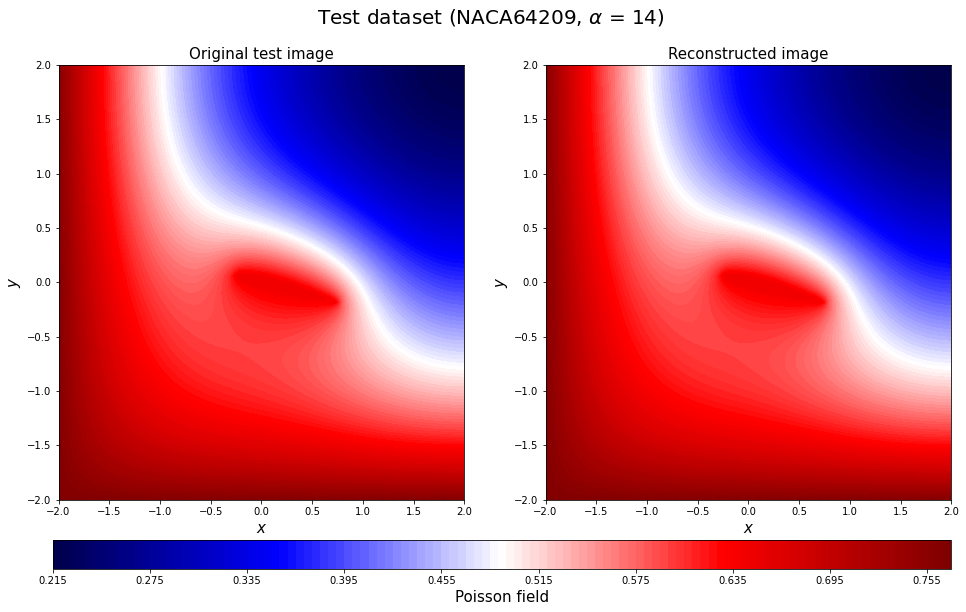

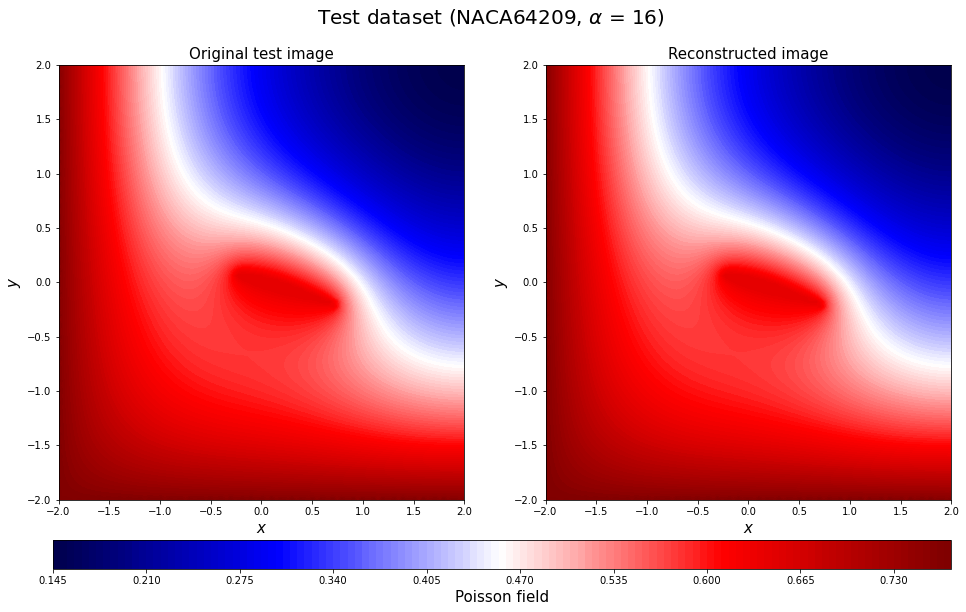

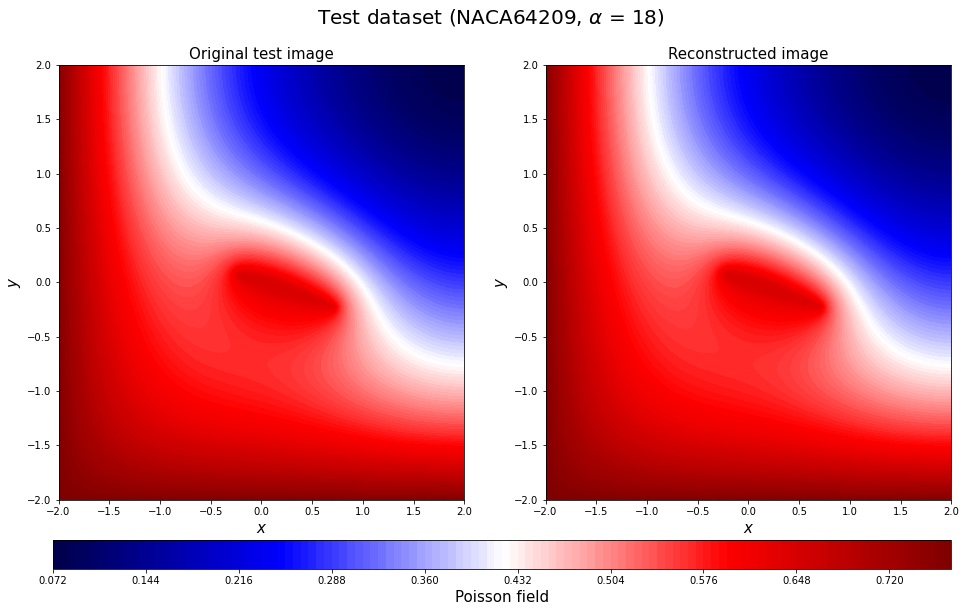

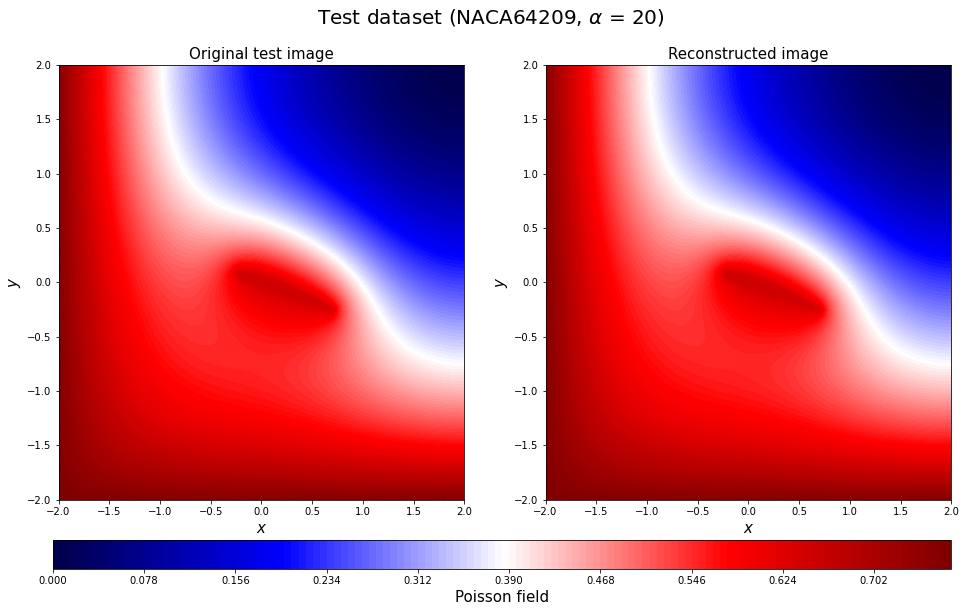

In [59]:
for c in range(0,16):
    plt.figure(figsize=(16, 8))
    y_test0_rotate = y_test[c].reshape(n_grid,n_grid).T
    decoded_rotate = decoded_test[c].reshape(n_grid,n_grid).T

    xrange = np.linspace(-2, 2, n_grid)
    yrange = np.linspace(-2, 2, n_grid)
    xmesh, ymesh = np.meshgrid(xrange, yrange)

    ax = plt.subplot(1, 2, 1)
    a1 = plt.contourf(xmesh, ymesh, y_test0_rotate, vmin=np.min(y_test0_rotate),
                      vmax=np.max(y_test0_rotate), levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Original test image', fontsize=15)

    # Display reconstruction
    ax = plt.subplot(1, 2, 2)
    a2 = plt.contourf(xmesh, ymesh, decoded_rotate, vmin=np.min(y_test0_rotate),
                      vmax=np.max(y_test0_rotate), levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Reconstructed image', fontsize=15)
    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
    cbar.set_label('Poisson field', fontsize=15)
    #cbar.set_ticks([-0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

    plt.suptitle(r'Test dataset (%s, $\alpha$ = %d)' %(np.array2string(geo_test[c])[3:-2], aa_test[c]),fontsize=20)
    save_fig_name = "20221030Prediction_Poisson_bc2(test)"+str(np.array2string(geo_test[c])[3:-2])+str(aa_test[c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

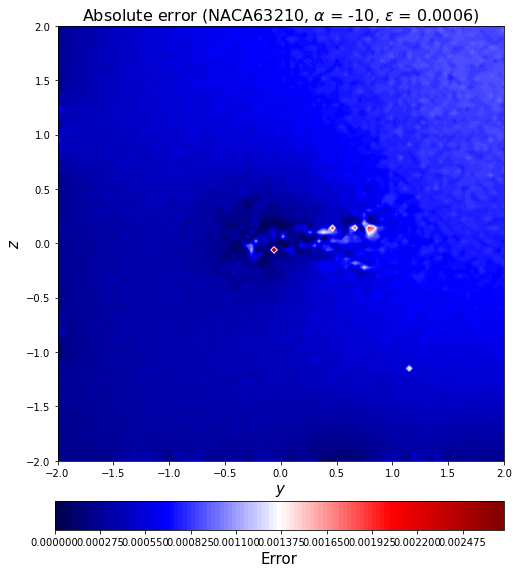

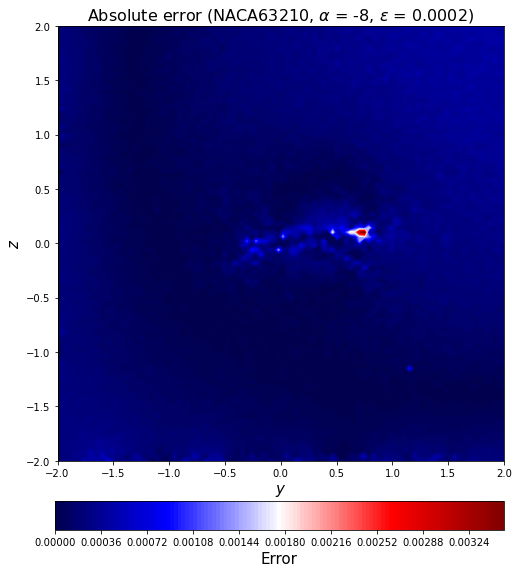

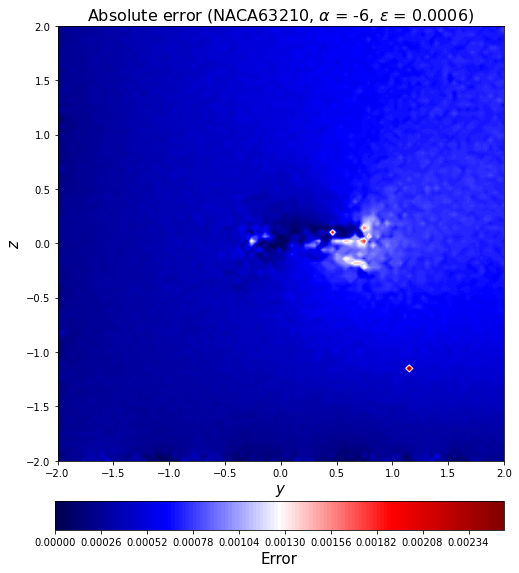

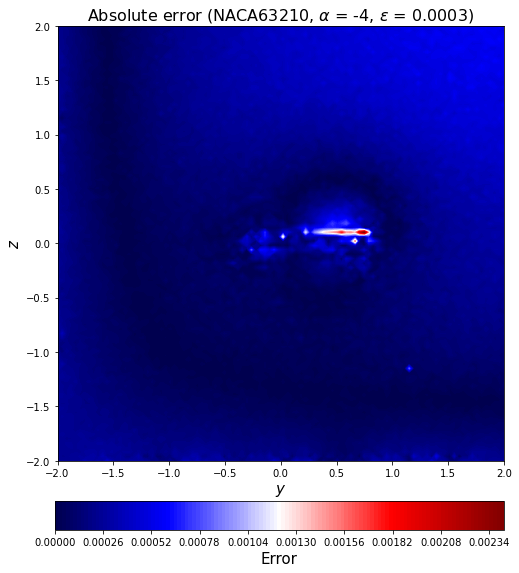

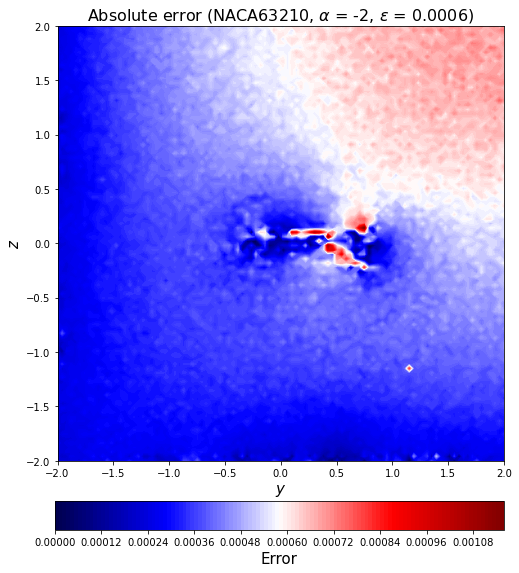

...

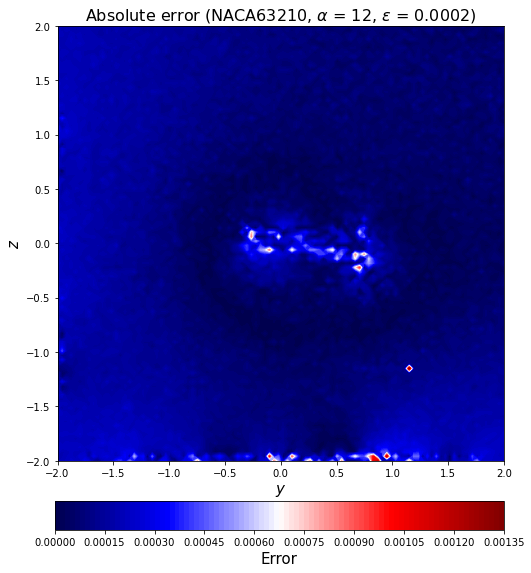

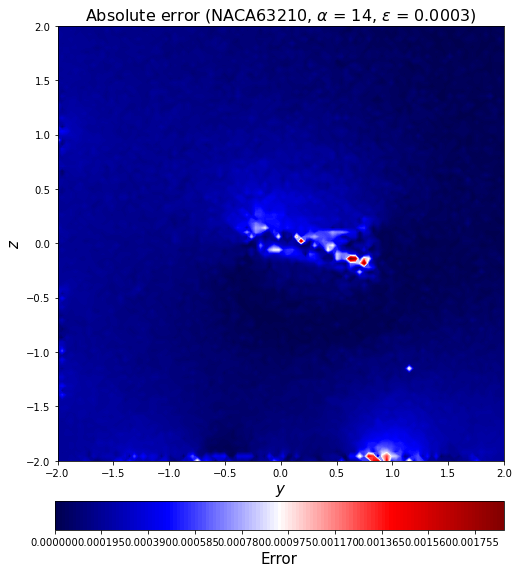

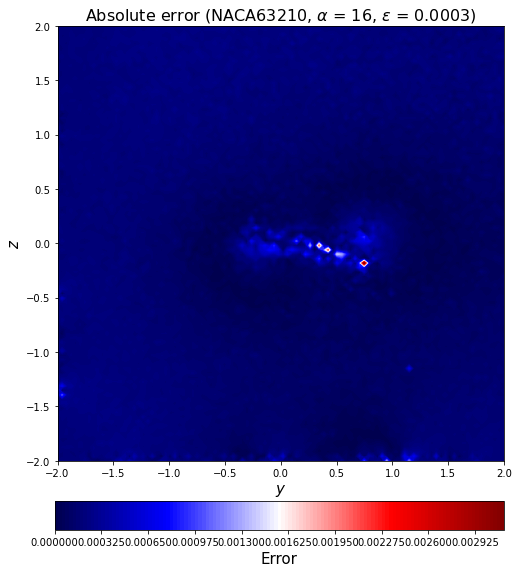

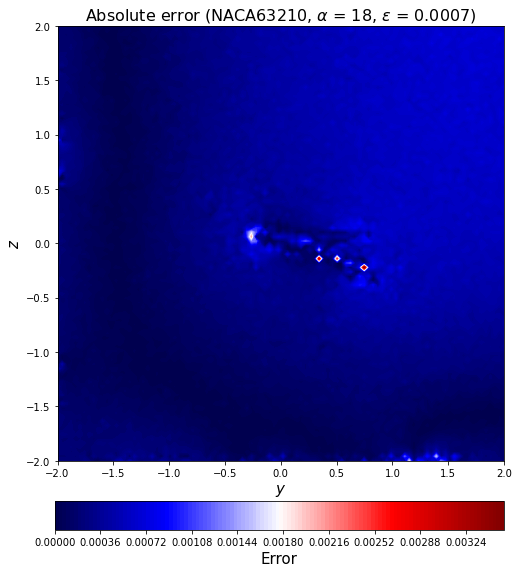

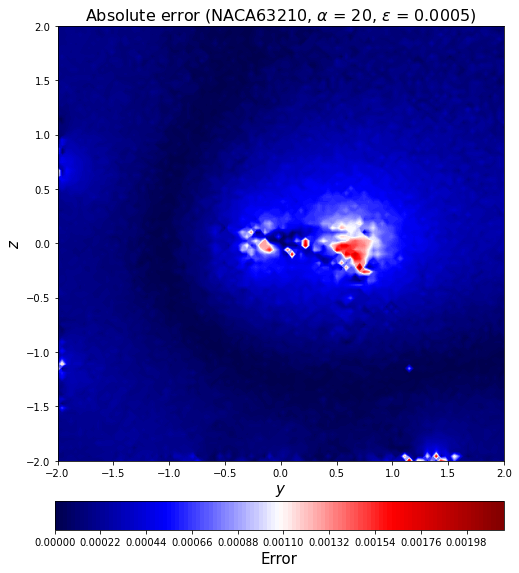

In [60]:
for c in range(0,16):
    error_test_abs2_rotate = error_test_abs[2*16+c].reshape(n_grid,n_grid).T

    fig5 = plt.figure(figsize = (8, 8))
    ax5 = fig5.add_subplot(111)
    mappable = ax5.contourf(xmesh, ymesh, error_test_abs2_rotate, levels=128, cmap='seismic')
    ax5.set_title(r'Absolute error (%s, $\alpha$ = %d, $\epsilon$ = %.4f)' %(np.array2string(geo_test[2*16+c])[3:-2],
                                                                       aa_test[2*16+c], l2_error_test_list[2*16+c]), fontsize=16)
    ax5.set_xlabel('$y$', fontsize=15)
    ax5.set_ylabel('$z$', fontsize=15)

    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
    cbar.set_label('Error', fontsize=15)

    save_fig_name = "20221030PredictionError_Poisson_bc2(test)"+str(np.array2string(geo_test[2*16+c])[3:-2])+str(aa_test[2*16+c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

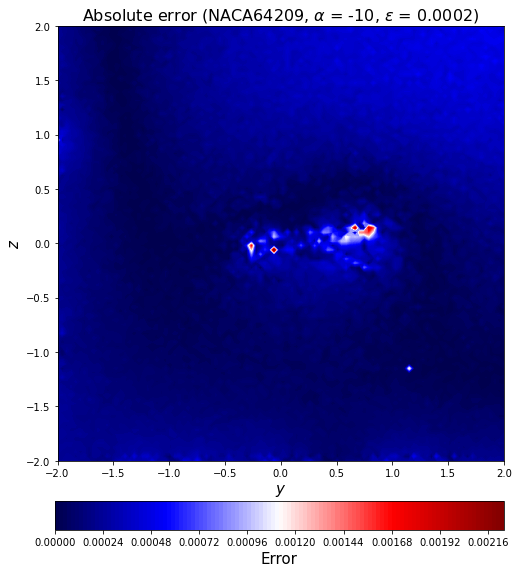

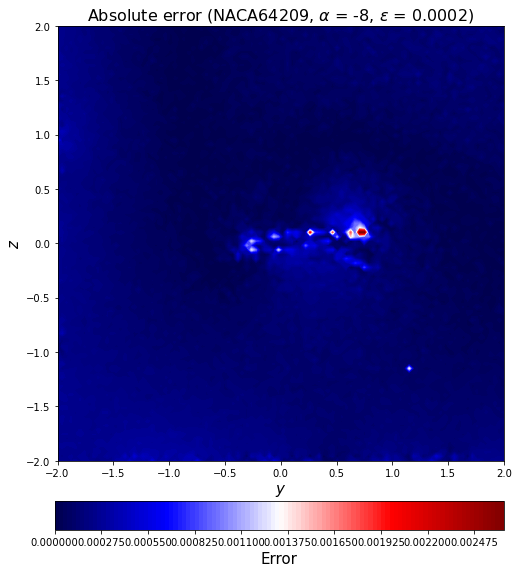

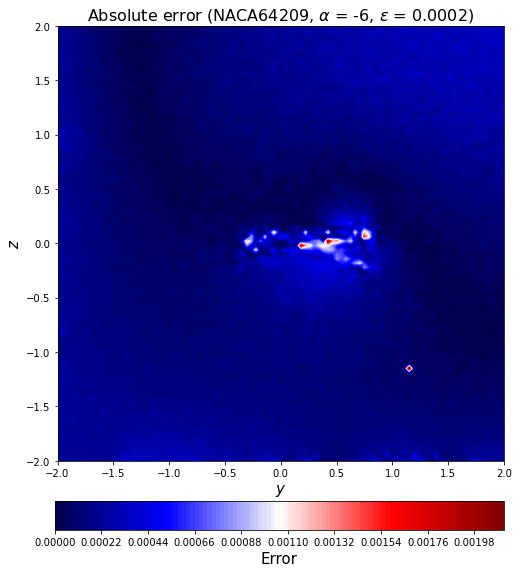

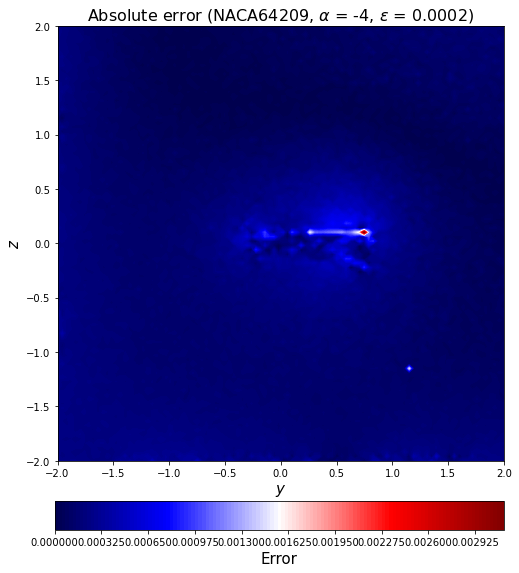

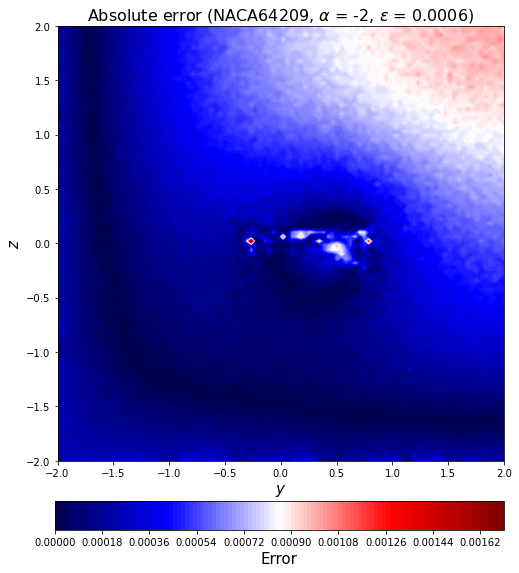

...

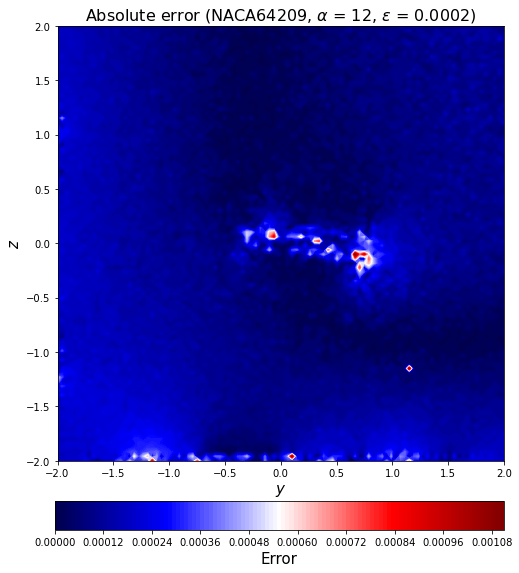

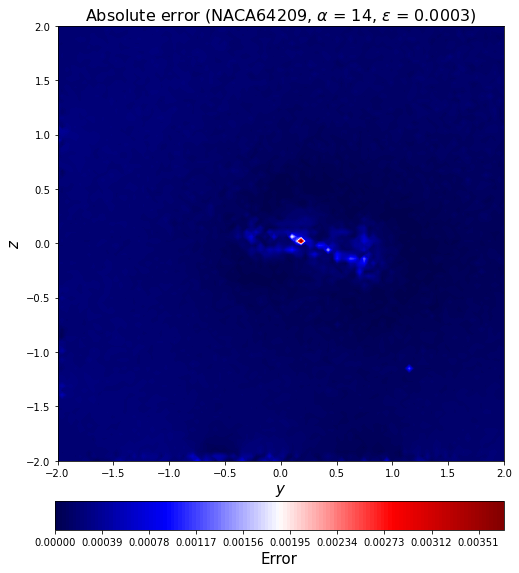

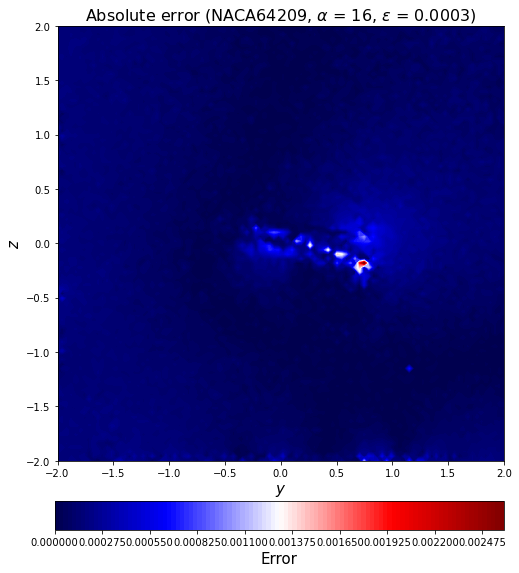

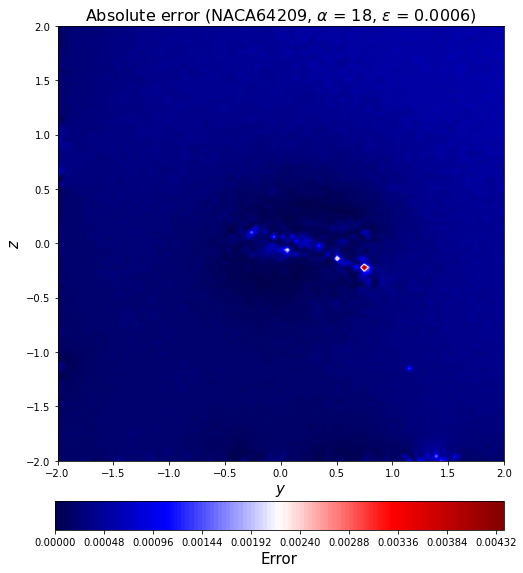

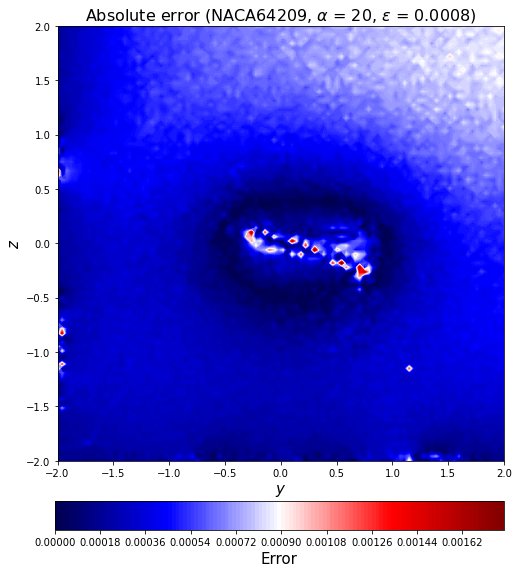

In [61]:
for c in range(0,16):
    error_test_abs2_rotate = error_test_abs[c].reshape(n_grid,n_grid).T

    fig5 = plt.figure(figsize = (8, 8))
    ax5 = fig5.add_subplot(111)
    mappable = ax5.contourf(xmesh, ymesh, error_test_abs2_rotate, levels=128, cmap='seismic')
    ax5.set_title(r'Absolute error (%s, $\alpha$ = %d, $\epsilon$ = %.4f)' %(np.array2string(geo_test[c])[3:-2],
                                                                       aa_test[c], l2_error_test_list[c]), fontsize=16)
    ax5.set_xlabel('$y$', fontsize=15)
    ax5.set_ylabel('$z$', fontsize=15)

    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
    cbar.set_label('Error', fontsize=15)

    save_fig_name = "20221030PredictionError_Poisson_bc2(test)"+str(np.array2string(geo_test[c])[3:-2])+str(aa_test[c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

In [62]:
MAPE_train = (np.sum(np.abs(np.sum(y_train)-np.sum(decoded_train))) / np.abs(np.sum(y_train)))/(y_train.shape[0]/16)*100
acc_train = 1-MAPE_train

In [63]:
MAPE_test = (np.sum(np.abs(np.sum(y_test)-np.sum(decoded_test))) / np.abs(np.sum(y_test)))/(y_test.shape[0]/16)*100
acc_test = 1-MAPE_test

In [64]:
print(MAPE_train)
print(acc_train)

0.00019479429824219925
0.9998052057017578


In [65]:
print(MAPE_test)
print(acc_test)

0.025698486251120502
0.9743015137488795


In [66]:
MAPE_train_list = []
acc_train_list = []
for i in range(0, len(aa_train)):
    MAPE_train_data = (np.sum(np.abs(y_train[i]-decoded_train[i])) / np.sum(np.abs(y_train[i])))/(y_train.shape[0]/16)*100
    MAPE_train_list.append(MAPE_train_data)
    acc_train_data = 1 - MAPE_train_data
    acc_train_list.append(acc_train_data)
print(MAPE_train_list)
print(acc_train_list)

[0.0001756188703904, 0.0001500970589693958, 0.00011723759111315741, 0.00013218750354259103, 0.00015896083711030713, 0.0001614091975190682, 0.0002656599992406641, 0.00018149921913968462, 0.00023159656959907568, 0.0002407319275363909, 0.00028779178507768973, 0.00015186851806002618, 0.00016374268623047385, 0.00018784998578073192, 0.0002789049727730382, 0.0003579289042397323, 0.00025109783208172577, 0.00020104537130099544, 0.00020765804494916385, 0.00013508806995014618, 0.0001649296243402267, 0.00023447191498095595, 0.00017653594691780173, 0.00014209990387918645, 0.0001835339863713392, 0.00021436346765874001, 0.00022670807792113878, 0.00021675753470549105, 0.00015615198308469513, 0.00020132626506518634, 0.000199063555107654, 0.00030565583895559624, 0.0002786932646130838, 0.00020306972088386273, 0.00020815239817636484, 0.00022827320297811137, 0.00023542230009154715, 0.00024830476233356696, 0.00016080381537062264, 0.0001769180658421639, 0.0002368184192264575, 0.000228160078592597, 0.00015548

In [67]:
MAPE_test_list = []
acc_test_list = []
for i in range(0, len(aa_test)):
    MAPE_test_data = (np.sum(np.abs(y_test[i]-decoded_test[i])) / np.sum(np.abs(y_test[i])))/(y_test.shape[0]/16)*100
    MAPE_test_list.append(MAPE_test_data)
    acc_test_data = 1 - MAPE_test_data
    acc_test_list.append(acc_test_data)
print(MAPE_test_list)
print(acc_test_list)

[0.0027287404112473807, 0.002059204180201073, 0.0026350951594138377, 0.0027479111123158875, 0.006005220025598114, 0.0063733434894454035, 0.002820831137599401, 0.004316484713925321, 0.004643757619308176, 0.006876848625043586, 0.005367136494868688, 0.0025994715152862606, 0.0038925843926952406, 0.0028141643828008263, 0.008821773186973608, 0.011615317311317945, 0.021516136142826395, 0.0436405447388313, 0.03466449861665591, 0.03875651323309185, 0.0376495865264195, 0.030065547466024415, 0.031863199319168756, 0.04101061184077059, 0.02787657800332661, 0.018268793609085125, 0.0335325657578948, 0.04043421514096555, 0.00478077218186691, 0.02214591817354112, 0.004924231256576724, 0.014978336811631035, 0.008518110598163757, 0.0025950505859041032, 0.008130207900593914, 0.0032581750258060733, 0.007983466554678801, 0.0028877796230220862, 0.0034097337297325386, 0.006504675225129918, 0.0035455091171998207, 0.007997291110853929, 0.002854713217713045, 0.0026023813800490907, 0.003742622124758673, 0.0040714

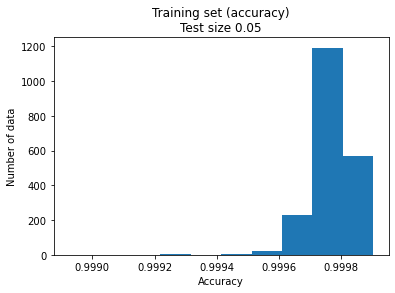

In [68]:
plt.hist(acc_train_list)
plt.title('Training set (accuracy)\nTest size 0.05')
plt.ylabel('Number of data')
plt.xlabel('Accuracy')
#plt.grid()
save_acc_name = "20221030Accuracy_Poisson_bc2(training).jpg"
plt.savefig(save_acc_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

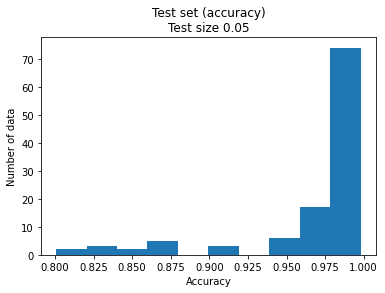

In [69]:
plt.hist(acc_test_list)
plt.title('Test set (accuracy)\nTest size 0.05')
plt.ylabel('Number of data')
plt.xlabel('Accuracy')
save_acc_name = "20221030Accuracy_Poisson_bc2(test).jpg"
plt.savefig(save_acc_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

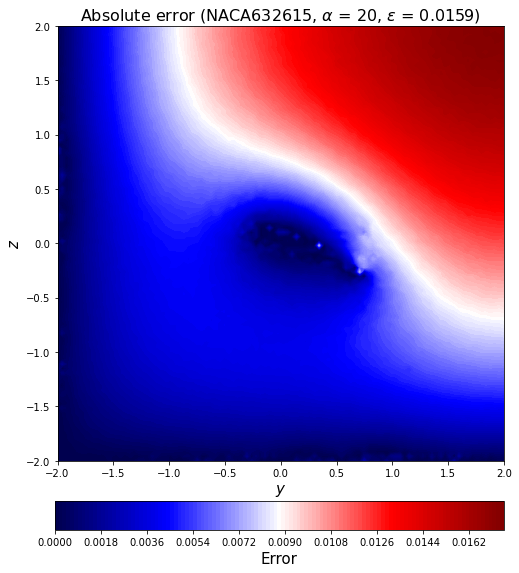

In [70]:
error_test_abs2_rotate = error_test_abs[-1].reshape(n_grid,n_grid).T

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_test_abs2_rotate, levels=128, cmap='seismic')
ax5.set_title(r'Absolute error (%s, $\alpha$ = %d, $\epsilon$ = %.4f)' %(np.array2string(geo_test[-1])[3:-2],
                                                                   aa_test[-1], l2_error_test_list[-1]), fontsize=16)
ax5.set_xlabel('$y$', fontsize=15)
ax5.set_ylabel('$z$', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)

save_fig_name = "20221030PredictionError_Poisson_bc2(test)"+str(np.array2string(geo_test[-1])[3:-2])+str(aa_test[-1])+".jpg"
plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

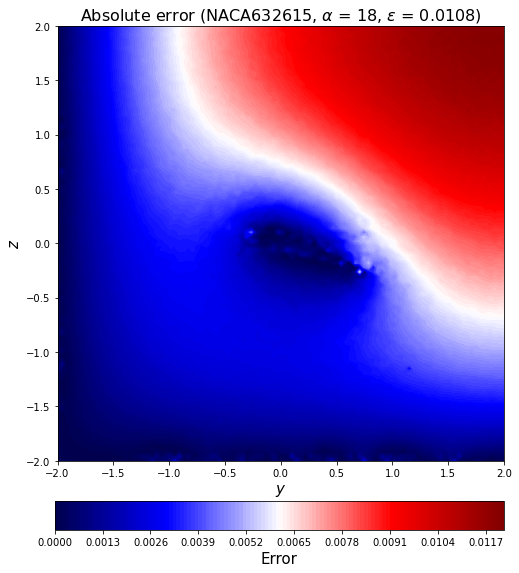

In [71]:
error_test_abs2_rotate = error_test_abs[-2].reshape(n_grid,n_grid).T

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_test_abs2_rotate, levels=128, cmap='seismic')
ax5.set_title(r'Absolute error (%s, $\alpha$ = %d, $\epsilon$ = %.4f)' %(np.array2string(geo_test[-2])[3:-2],
                                                                   aa_test[-2], l2_error_test_list[-2]), fontsize=16)
ax5.set_xlabel('$y$', fontsize=15)
ax5.set_ylabel('$z$', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)

save_fig_name = "20221030PredictionError_Poisson_bc2(test)"+str(np.array2string(geo_test[-2])[3:-2])+str(aa_test[-2])+".jpg"
plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

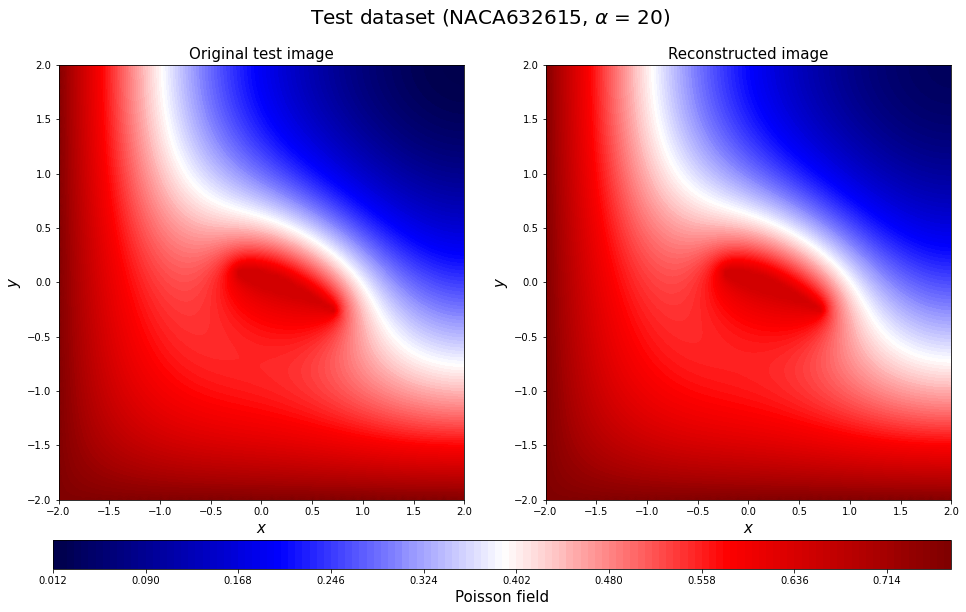

In [72]:
c=-1
plt.figure(figsize=(16, 8))
y_test0_rotate = y_test[c].reshape(n_grid,n_grid).T
decoded_rotate = decoded_test[c].reshape(n_grid,n_grid).T

xrange = np.linspace(-2, 2, n_grid)
yrange = np.linspace(-2, 2, n_grid)
xmesh, ymesh = np.meshgrid(xrange, yrange)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_test0_rotate, vmin=np.min(y_test0_rotate),
                  vmax=np.max(y_test0_rotate), levels=128, cmap='seismic')
ax.set_xlabel('$x$', fontsize=15)
ax.set_ylabel('$y$', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate, vmin=np.min(y_test0_rotate),
                  vmax=np.max(y_test0_rotate), levels=128, cmap='seismic')
ax.set_xlabel('$x$', fontsize=15)
ax.set_ylabel('$y$', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('Poisson field', fontsize=15)
#cbar.set_ticks([-0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

plt.suptitle(r'Test dataset (%s, $\alpha$ = %d)' %(np.array2string(geo_test[c])[3:-2], aa_test[c]),fontsize=20)
save_fig_name = "20221030Prediction_Poisson_bc2(test)"+str(np.array2string(geo_test[c])[3:-2])+str(aa_test[c])+".jpg"
plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

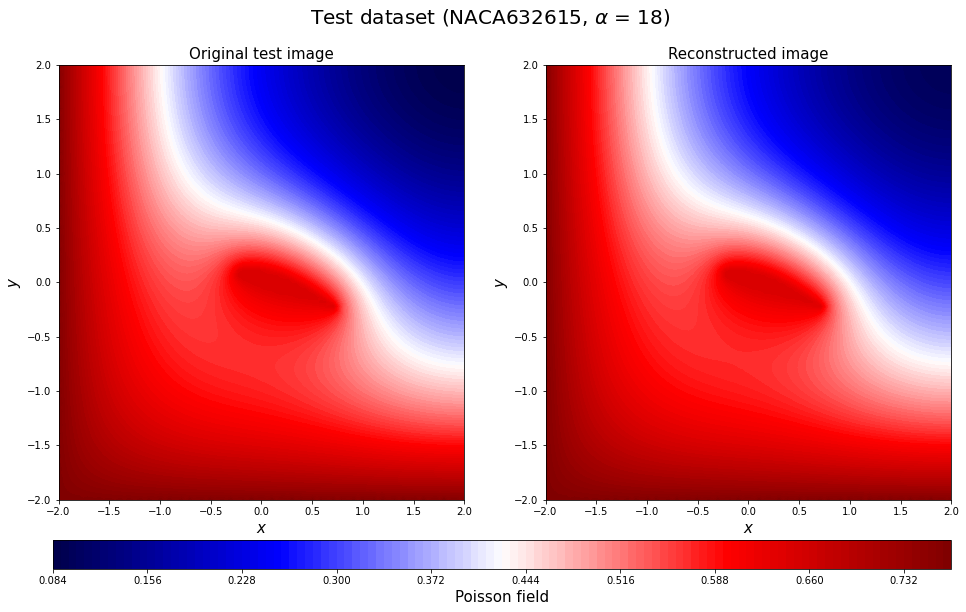

In [73]:
c=-2
plt.figure(figsize=(16, 8))
y_test0_rotate = y_test[c].reshape(n_grid,n_grid).T
decoded_rotate = decoded_test[c].reshape(n_grid,n_grid).T

xrange = np.linspace(-2, 2, n_grid)
yrange = np.linspace(-2, 2, n_grid)
xmesh, ymesh = np.meshgrid(xrange, yrange)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_test0_rotate, vmin=np.min(y_test0_rotate),
                  vmax=np.max(y_test0_rotate), levels=128, cmap='seismic')
ax.set_xlabel('$x$', fontsize=15)
ax.set_ylabel('$y$', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate, vmin=np.min(y_test0_rotate),
                  vmax=np.max(y_test0_rotate), levels=128, cmap='seismic')
ax.set_xlabel('$x$', fontsize=15)
ax.set_ylabel('$y$', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('Poisson field', fontsize=15)
#cbar.set_ticks([-0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

plt.suptitle(r'Test dataset (%s, $\alpha$ = %d)' %(np.array2string(geo_test[c])[3:-2], aa_test[c]),fontsize=20)
save_fig_name = "20221030Prediction_Poisson_bc2(test)"+str(np.array2string(geo_test[c])[3:-2])+str(aa_test[c])+".jpg"
plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

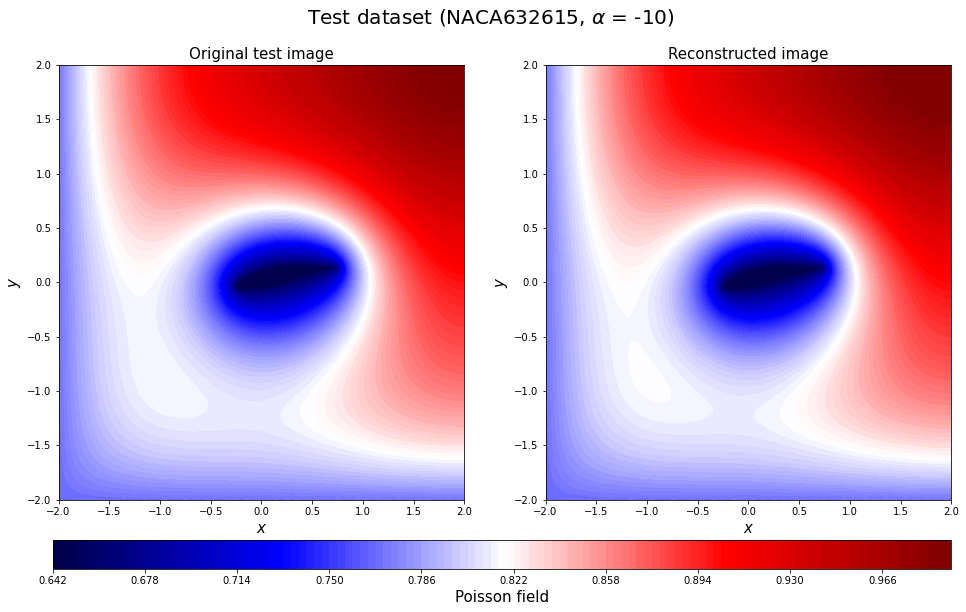

In [74]:
c=-16
plt.figure(figsize=(16, 8))
y_test0_rotate = y_test[c].reshape(n_grid,n_grid).T
decoded_rotate = decoded_test[c].reshape(n_grid,n_grid).T

xrange = np.linspace(-2, 2, n_grid)
yrange = np.linspace(-2, 2, n_grid)
xmesh, ymesh = np.meshgrid(xrange, yrange)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_test0_rotate, vmin=np.min(y_test0_rotate),
                  vmax=np.max(y_test0_rotate), levels=128, cmap='seismic')
ax.set_xlabel('$x$', fontsize=15)
ax.set_ylabel('$y$', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate, vmin=np.min(y_test0_rotate),
                  vmax=np.max(y_test0_rotate), levels=128, cmap='seismic')
ax.set_xlabel('$x$', fontsize=15)
ax.set_ylabel('$y$', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('Poisson field', fontsize=15)
#cbar.set_ticks([-0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

plt.suptitle(r'Test dataset (%s, $\alpha$ = %d)' %(np.array2string(geo_test[c])[3:-2], aa_test[c]),fontsize=20)
save_fig_name = "20221030Prediction_Poisson_bc2(test)"+str(np.array2string(geo_test[c])[3:-2])+str(aa_test[c])+".jpg"
plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

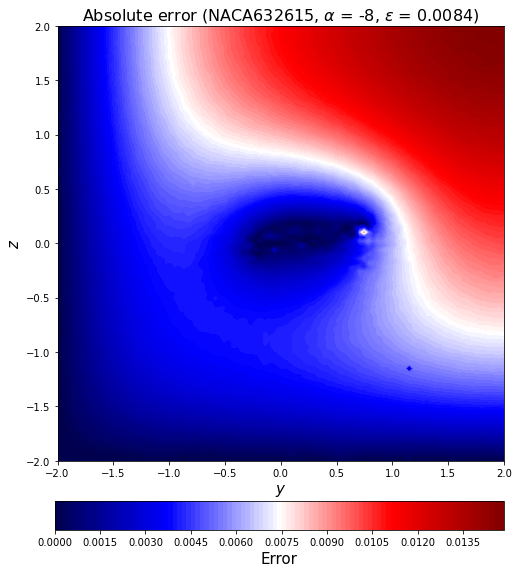

In [75]:
error_test_abs2_rotate = error_test_abs[-15].reshape(n_grid,n_grid).T

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_test_abs2_rotate, levels=128, cmap='seismic')
ax5.set_title(r'Absolute error (%s, $\alpha$ = %d, $\epsilon$ = %.4f)' %(np.array2string(geo_test[-15])[3:-2],
                                                                   aa_test[-15], l2_error_test_list[-15]), fontsize=16)
ax5.set_xlabel('$y$', fontsize=15)
ax5.set_ylabel('$z$', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)

save_fig_name = "20221030PredictionError_Poisson_bc2(test)"+str(np.array2string(geo_test[-15])[3:-2])+str(aa_test[-15])+".jpg"
plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

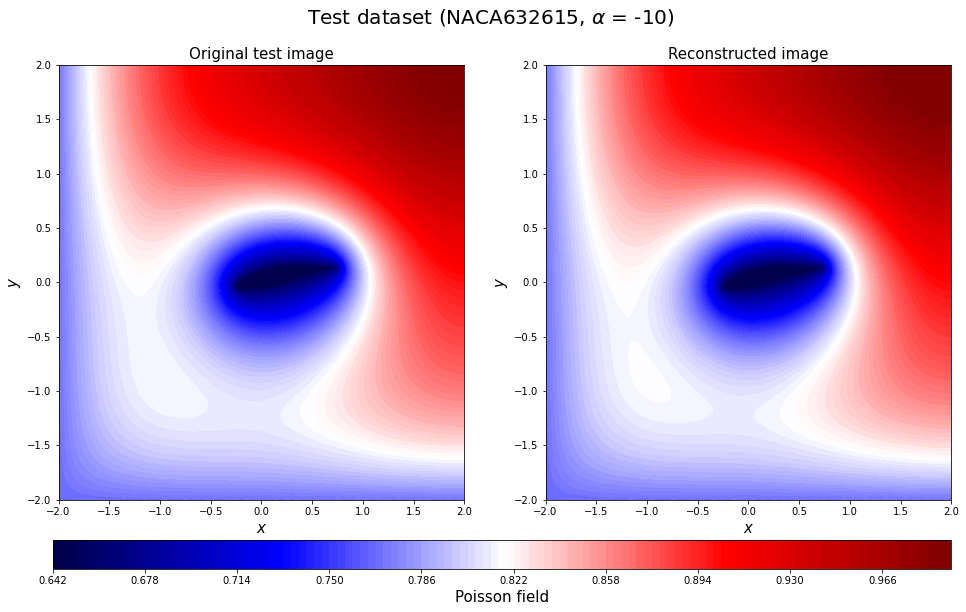

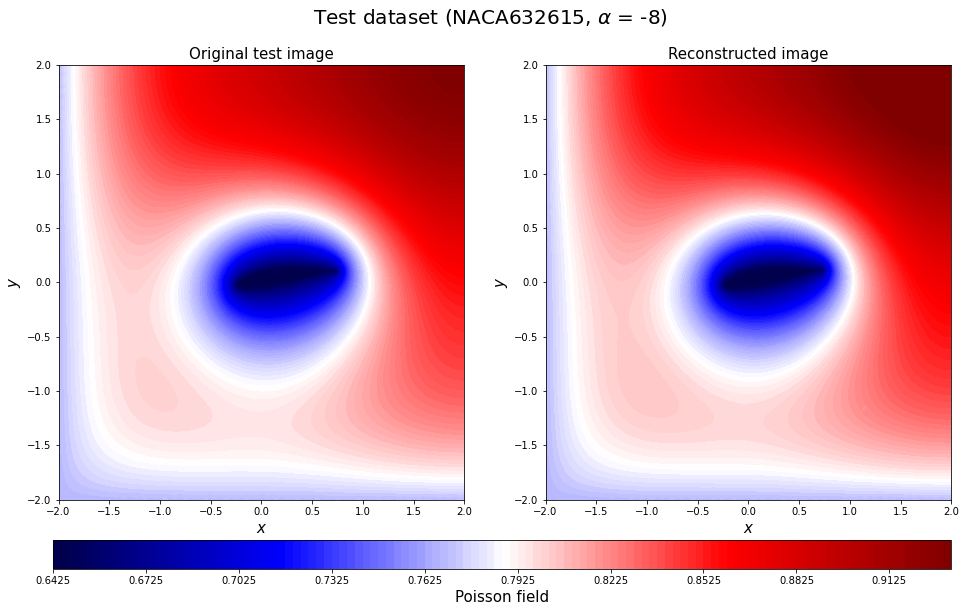

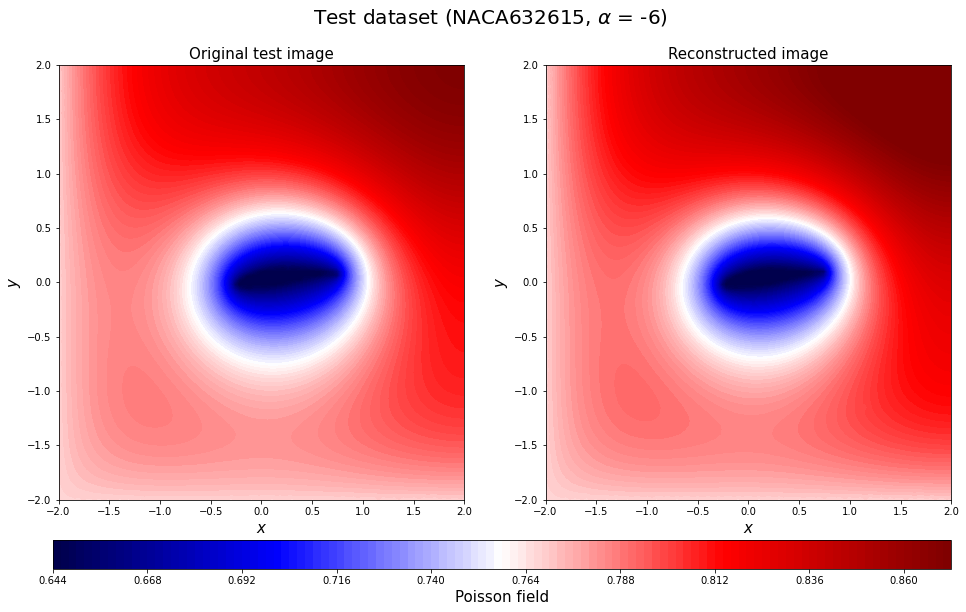

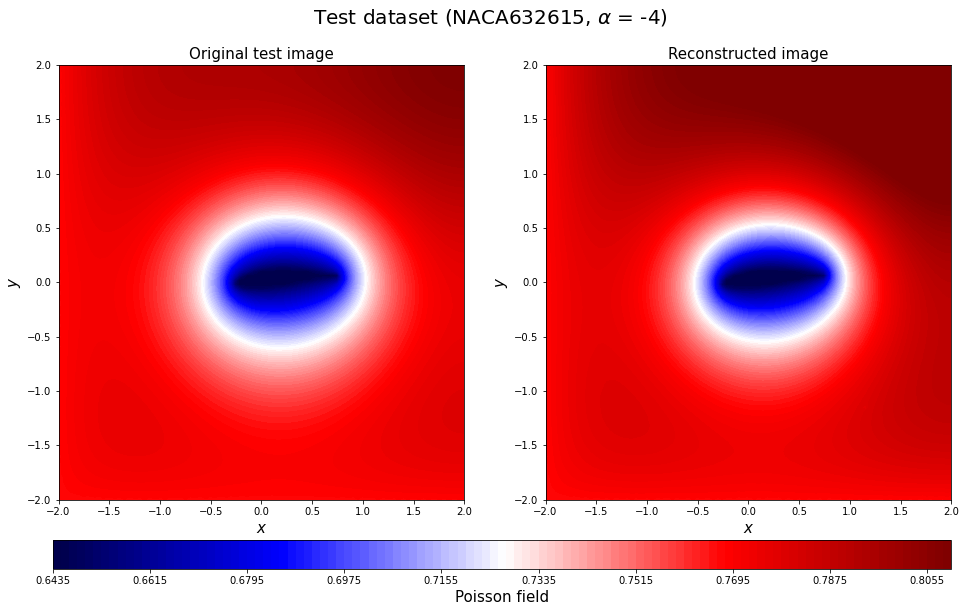

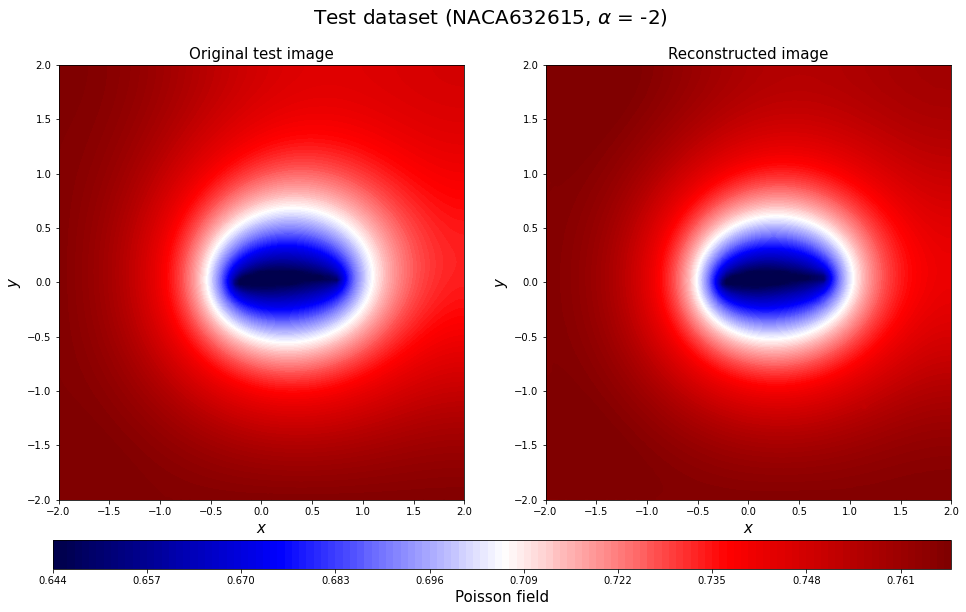

...

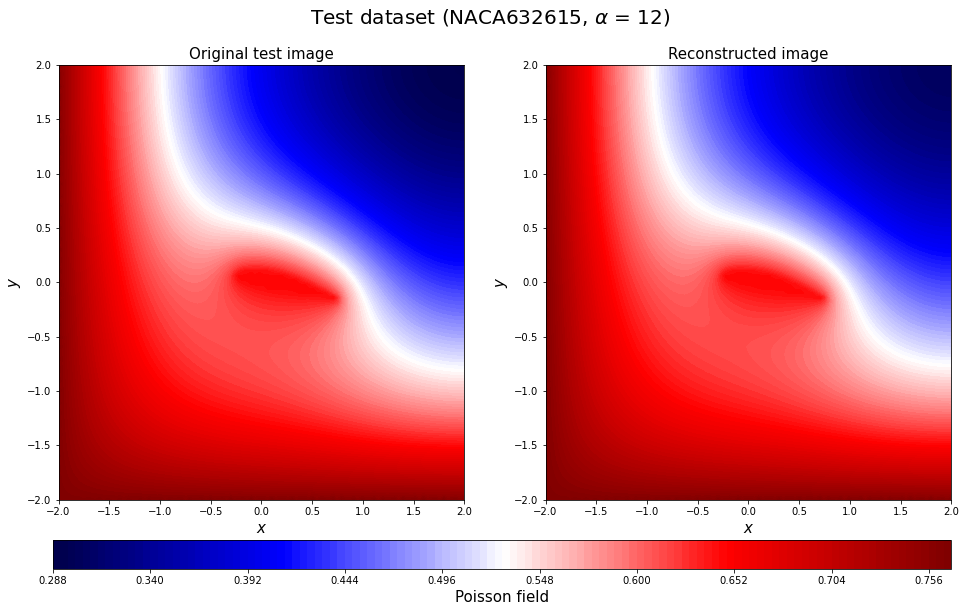

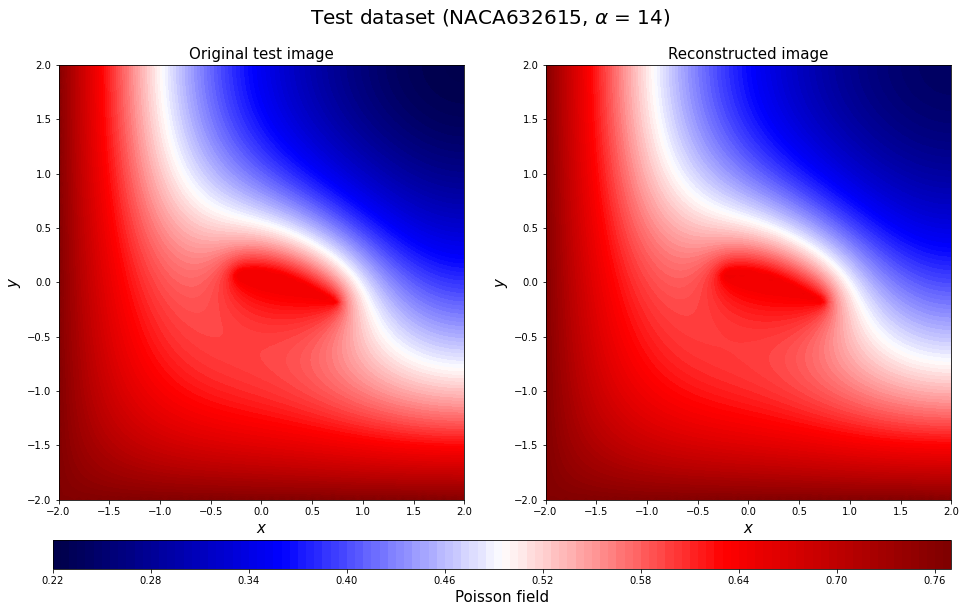

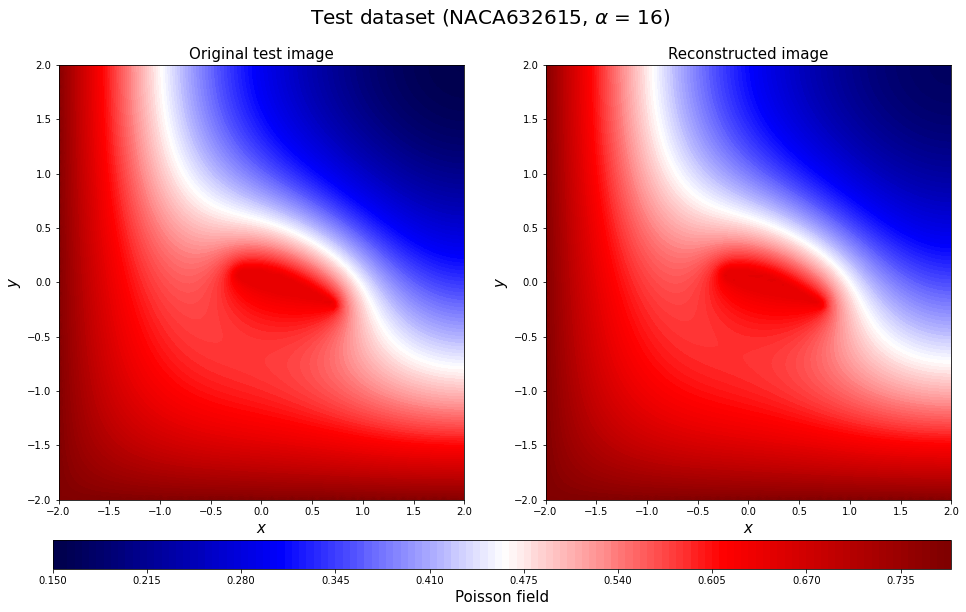

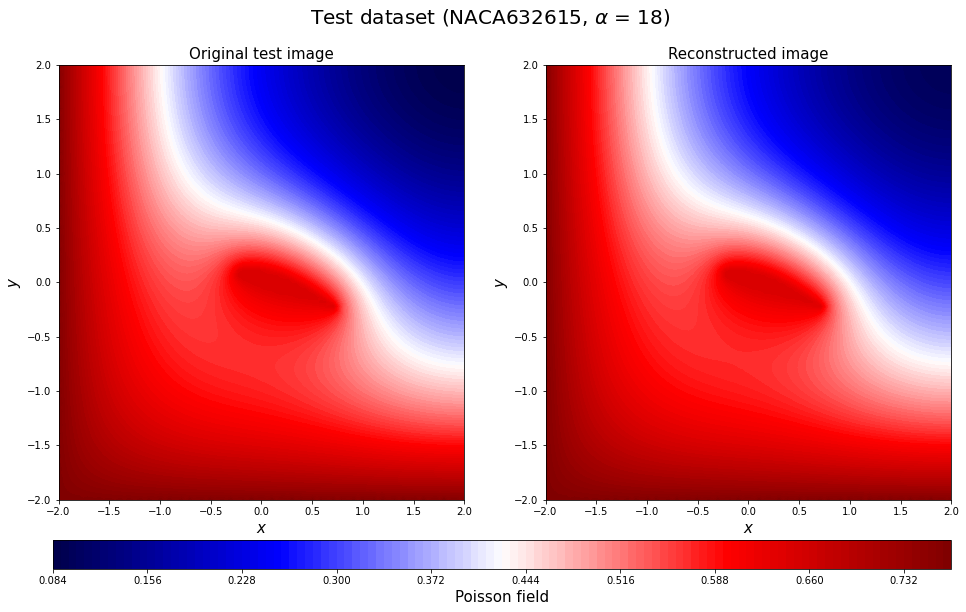

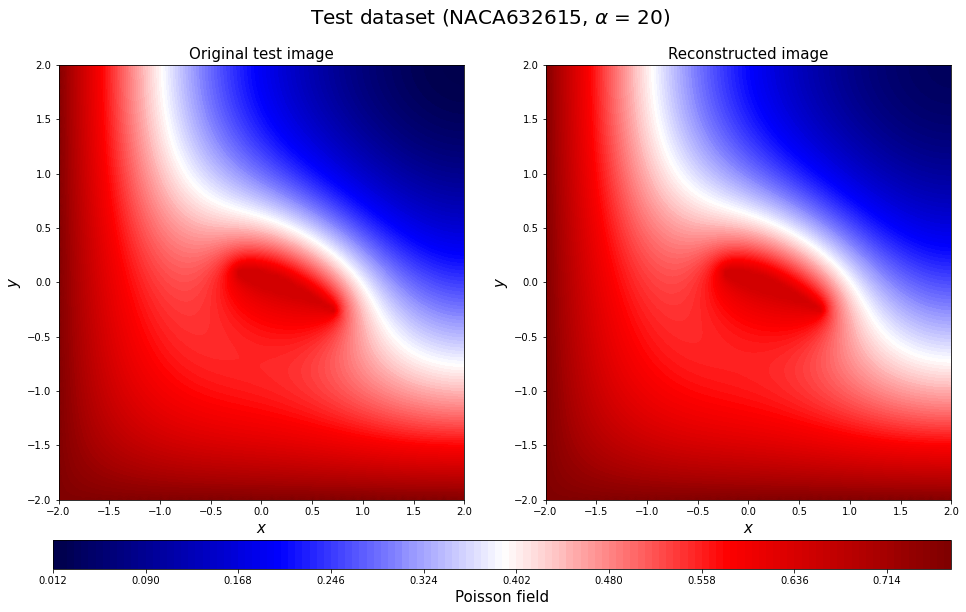

In [76]:
for c in range(96,112):
    plt.figure(figsize=(16, 8))
    y_test0_rotate = y_test[c].reshape(n_grid,n_grid).T
    decoded_rotate = decoded_test[c].reshape(n_grid,n_grid).T

    xrange = np.linspace(-2, 2, n_grid)
    yrange = np.linspace(-2, 2, n_grid)
    xmesh, ymesh = np.meshgrid(xrange, yrange)

    ax = plt.subplot(1, 2, 1)
    a1 = plt.contourf(xmesh, ymesh, y_test0_rotate, vmin=np.min(y_test0_rotate),
                      vmax = np.max(y_test0_rotate),levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Original test image', fontsize=15)

    # Display reconstruction
    ax = plt.subplot(1, 2, 2)
    a2 = plt.contourf(xmesh, ymesh, decoded_rotate, vmin=np.min(y_test0_rotate),
                      vmax = np.max(y_test0_rotate),levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Reconstructed image', fontsize=15)
    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
    cbar.set_label('Poisson field', fontsize=15)
    #cbar.set_ticks([-0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

    plt.suptitle(r'Test dataset (%s, $\alpha$ = %d)' %(np.array2string(geo_test[c])[3:-2], aa_test[c]),fontsize=20)
    save_fig_name = "20221030Prediction_Poisson_bc2(test)"+str(np.array2string(geo_test[c])[3:-2])+str(aa_test[c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

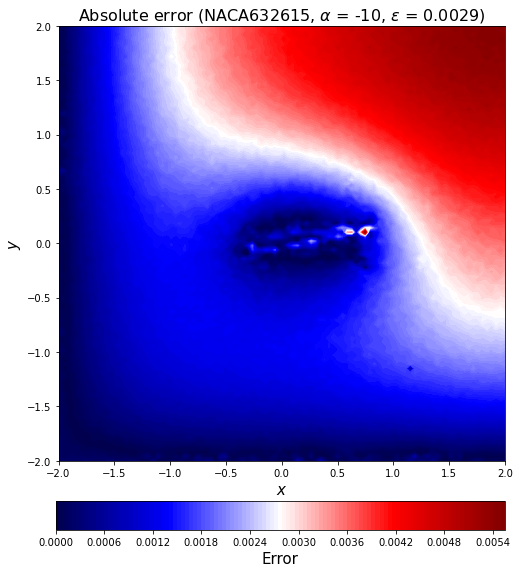

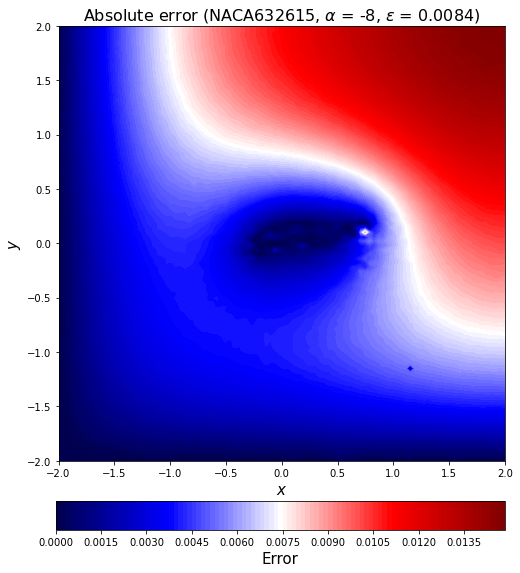

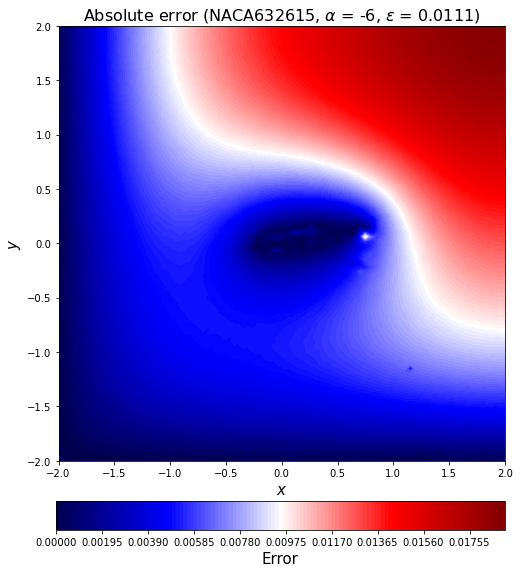

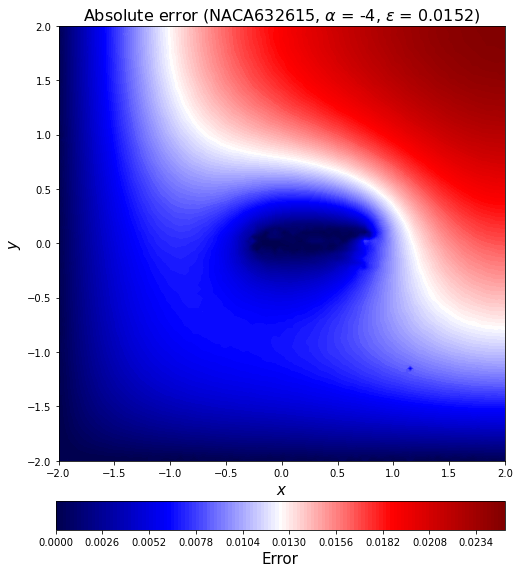

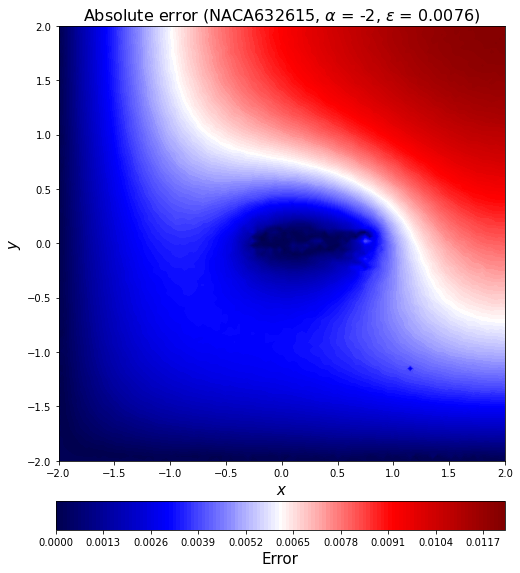

...

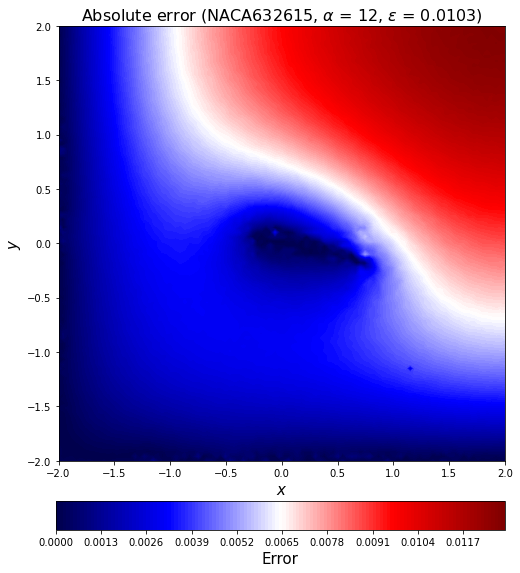

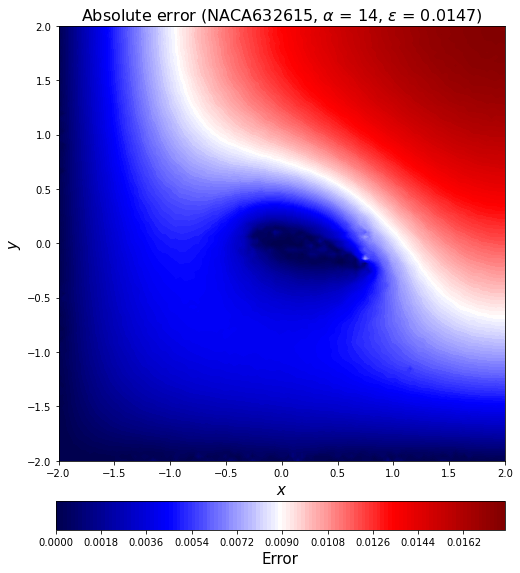

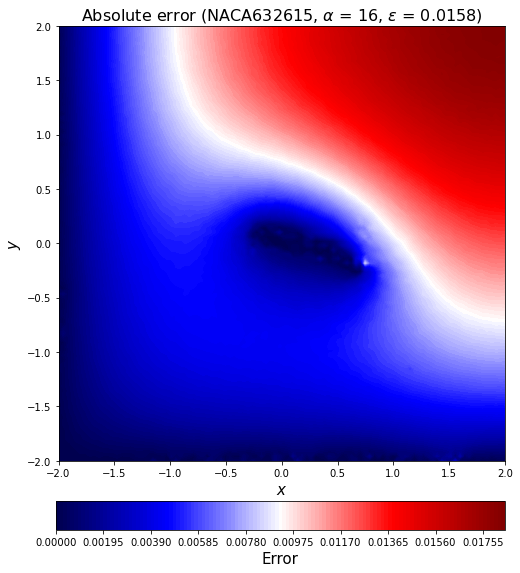

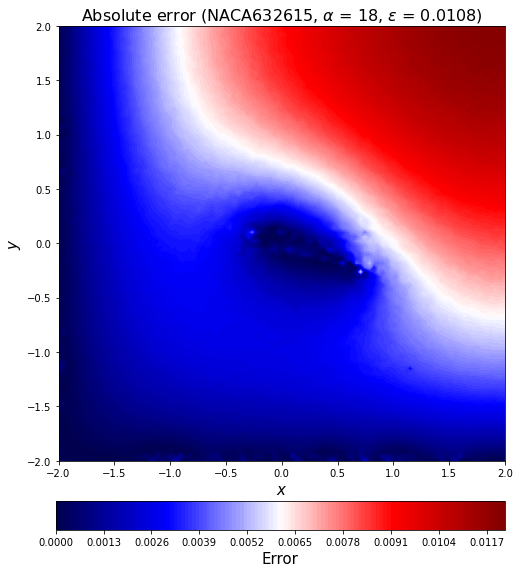

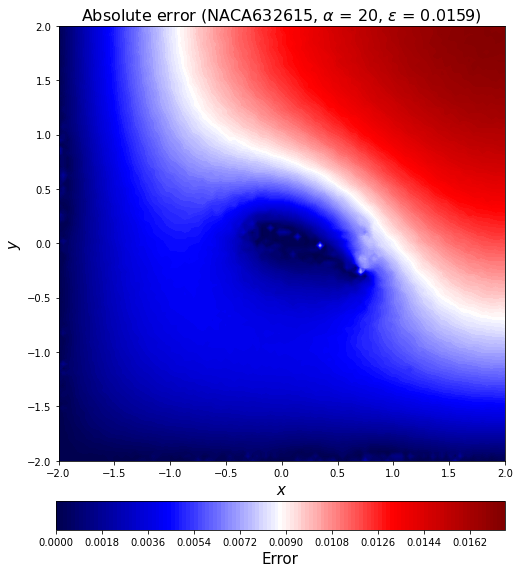

In [77]:
for c in range(96,112):
    error_test_abs2_rotate = error_test_abs[c].reshape(n_grid,n_grid).T

    fig5 = plt.figure(figsize = (8, 8))
    ax5 = fig5.add_subplot(111)
    mappable = ax5.contourf(xmesh, ymesh, error_test_abs2_rotate, levels=128, cmap='seismic')
    ax5.set_title(r'Absolute error (%s, $\alpha$ = %d, $\epsilon$ = %.4f)' %(np.array2string(geo_test[c])[3:-2],
                                                                       aa_test[c], l2_error_test_list[c]), fontsize=16)
    ax5.set_xlabel('$x$', fontsize=15)
    ax5.set_ylabel('$y$', fontsize=15)

    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
    cbar.set_label('Error', fontsize=15)

    save_fig_name = "20221030PredictionError_Poisson_bc2(test)"+str(np.array2string(geo_test[c])[3:-2])+str(aa_test[c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()